<img src="images\GRU_formulas.jpg" width=800>
<img src="images\GRU_shapes.jpg" width=200>

In [21]:
import random, math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"]=16,5


def load_data_txt(filename, dimensions, max_len=None):
    f = open(filename, "r")
    data = []
    print("loading data")
    for line in f:
        for c in line:
            new_data = []
            for i in range(0, dimensions):
                new_data.append([0])
                
            if ord(c)-ord(' ') < 89 and ord(c)-ord(' ') >= 0:
                new_data[ord(c)-ord(' ')] = [1]
            data.append(new_data)
            if max_len != None:
                if len(data) >= max_len:
                    print("all loaded")    
                    return data
                    
    print("all loaded")  
    return data
            
def sigmoid(x):
    return 1/(1+np.exp(-np.clip(x, -500, 500)))

def swish(x):
    return x*sigmoid(x)

def relu(x):
    return np.maximum(0,x)

def softmax(x):
    p = np.exp(x - np.max(x))
    return p/np.sum(p)

def MSE(target, x):
    return np.power(target - x, 2)

#def cross_entropy(target, x):
#    data = np.clip(x, 1, 

def activation_function(z, act, derivative=False, activated_value=None):
    if derivative == False:
        if act=="sigmoid":
            return sigmoid(z)
        elif act == "swish":
            return swish(z)
        elif act == "relu":
            return relu(z)
        elif act=="tanh":
            return np.tanh(z)
        elif act=="softmax":
            return softmax(z)
    else:
        if act=="sigmoid":
            return activated_value * (1 - activated_value)
        elif act == "swish":
            return activated_value + sigmoid(z) * (1 - activated_value)
        elif act == "relu":  
            x = activated_value
            x[x<=0] = 0
            x[x>0] = 1
            return x
        
        elif act=="tanh":
            return 1 - np.power(activated_value, 2)
        elif act=="softmax":
            return activated_value

class RNN():
    
    def __init__(self, l_rate):
        self.layers = []
        self.learning_rate = l_rate
        self.end_grad = []
        
    def add_layer(self, input_size, output_size, last_activation=None):
        new_layer = Layer(input_size, output_size, last_activation)
        self.layers.append(new_layer)
        self.end_grad = np.empty((output_size, 1))
        
    def forward_pass(self, input_data, max_steps=0):
        self.layers[0].forward_pass(input_data, max_steps)
        for i in range(1, len(self.layers)):
            prev_layer_out = self.layers[i-1].h[-1]        # Takes in the output of the previous layer. h[-1] is the hidden state of the last timestep of the layer
            self.layers[i].forward_pass(prev_layer_out, max_steps)
            
        return self.layers[-1].y
            
    def clear_memory(self):
        for i in range(0, len(self.layers)):
            self.layers[i].clear_memory()
            
    def backpropagation_through_time(self, input_data, target, max_steps, t, batch_size):
        self.end_grad += self.layers[-1].der_MSE(target)
        loss = MSE(target, self.layers[-1].y)
        #np.power(target - self.y, 2)
        if t%batch_size == 0:
            gradient = self.end_grad
            for i in range(1, len(self.layers)):
                inputs = self.layers[-i-1].h
                gradient = self.layers[-i].descent(gradient, inputs, self.learning_rate, max_steps, t)
            self.layers[0].descent(gradient, input_data, self.learning_rate, max_steps, t)
        self.end_grad.fill(0)
        return loss
    
    def predict(self, input_data):
        self.clear_memory()
        next_letter = []
        out_letter = []
        for i in range(0, len(input_data)):
            next_letter = self.forward_pass(input_data[i])
            
        out_letter = next_letter
        print_output = ""
        for i in range(0, 500):
            #choice = np.random.choice(np.arange(27), 1, p=np.squeeze(softmax(np.power(next_letter, 300))))
            choice = np.argmax(next_letter)
            out_letter = np.zeros(self.end_grad.shape)
            out_letter[choice,0] = 1
            if choice >= 0 and choice < 89:
                print_output += chr(ord(' ')+choice)
            next_letter = self.forward_pass(out_letter)
        print(print_output)
    
class Layer():
    
    def __init__(self, input_size, output_size, last_activation=None):
        self.input_size = input_size # M
        self.output_size = output_size # N
        self.last_activation = last_activation
        
        self.Wz = self.weights_init(output_size, input_size) # NxM
        self.Wr = self.weights_init(output_size, input_size) # NxM
        self.Wh = self.weights_init(output_size, input_size) # NxM
        
        self.Uz = self.weights_init(output_size, output_size) # NxN
        self.Ur = self.weights_init(output_size, output_size) # NxN
        self.Uh = self.weights_init(output_size, output_size) # NxN
        
        self.bz = self.weights_init(output_size, 1, bias=True) # Nx1
        self.br = self.weights_init(output_size, 1, bias=True) # Nx1
        self.bh = self.weights_init(output_size, 1, bias=True) # Nx1
        
        # T = time steps, starts with 0
        
        self.z       = np.empty((0,output_size,1)) # TxNx1, z(t) = Nx1
        self.r       = np.empty((0,output_size,1)) # TxNx1, r(t) = Nx1
        self.h_tilde = np.empty((0,output_size,1)) # TxNx1, h_tilde(t) = Nx1
        self.h       = np.empty((0,output_size,1)) # TxNx1, h(t) = Nx1
        self.inputs  = np.empty((0,input_size,1))  # TxMx1, inputs(t) = Mx1
        self.y       = np.empty((output_size, 1))
        
        self.beta1 = 0.9
        self.beta2 = 0.999
        self.mWz = np.zeros((output_size, input_size))
        self.vWz = np.zeros((output_size, input_size))
        self.mWr = np.zeros((output_size, input_size))
        self.vWr = np.zeros((output_size, input_size))
        self.mWh = np.zeros((output_size, input_size))
        self.vWh = np.zeros((output_size, input_size))
        
        self.mUz = np.zeros((output_size, output_size))
        self.vUz = np.zeros((output_size, output_size))
        self.mUr = np.zeros((output_size, output_size))
        self.vUr = np.zeros((output_size, output_size))
        self.mUh = np.zeros((output_size, output_size))
        self.vUh = np.zeros((output_size, output_size))
        
        self.mbz = np.zeros((output_size, 1))
        self.vbz = np.zeros((output_size, 1))
        self.mbr = np.zeros((output_size, 1))
        self.vbr = np.zeros((output_size, 1))
        self.mbh = np.zeros((output_size, 1))
        self.vbh = np.zeros((output_size, 1))
        
        self.epsilon = 0.000000001
        
        #self.errors  = np.empty((0,input_size,1))  # TxMx1, inputs(t) = Mx1
        
    def weights_init(self, rows, cols, bias=False):
        variance = math.sqrt(1/self.input_size)
        if bias:
            return np.random.uniform(0,0,(rows, cols))
        return np.random.uniform(-variance,variance,(rows, cols))
    
    
    def forward_pass(self, input_data, max_steps=0):
        
        self.inputs = np.concatenate((self.inputs, [input_data]), axis=0)
        prev_h = []
        if len(self.h) > 0:
            prev_h = self.h[-1]
        else:
            prev_h = np.zeros((self.output_size, 1))
        
        new_z = self.Wz @ input_data + self.Uz @ prev_h + self.bz      #Nx1
        new_z = sigmoid(new_z)
        self.z = np.concatenate((self.z, [new_z]), axis=0)

        new_r = self.Wr @ input_data + self.Ur @ prev_h + self.br
        new_r = sigmoid(new_r)
        self.r = np.concatenate((self.r, [new_r]), axis=0)
        
        new_h_tilde = self.Wh @ input_data + self.Uh @ (new_r * prev_h) + self.bh
        new_h_tilde = np.tanh(new_h_tilde)
        self.h_tilde = np.concatenate((self.h_tilde, [new_h_tilde]), axis=0)
        
        new_h = new_z * prev_h + (1 - new_z) * new_h_tilde
        self.h = np.concatenate((self.h, [new_h]), axis=0)
        if self.last_activation != None:
            self.y = activation_function(new_h, self.last_activation)
        else:
            self.y = new_h
        
        """if max_steps != 0:
            if len(self.z) > max_steps:
                self.z = np.delete(self.z, 0, 0)
            if len(self.r) > max_steps:
                self.r = np.delete(self.r, 0, 0)
            if len(self.h_tilde) > max_steps:
                self.h_tilde = np.delete(self.h_tilde, 0, 0)
            if len(self.h) > max_steps:
                self.h = np.delete(self.h, 0, 0)
            if len(self.h) > max_steps:
                self.inputs = np.delete(self.inputs, 0, 0)"""
            
        
    def clear_memory(self):
        self.z       = np.empty((0,self.output_size,1))
        self.r       = np.empty((0,self.output_size,1))
        self.h_tilde = np.empty((0,self.output_size,1))
        self.h       = np.empty((0,self.output_size,1))
        self.inputs  = np.empty((0,self.input_size,1))  # TxMx1, inputs(t) = Mx1
        
        self.mWz = np.zeros((self.output_size, self.input_size))
        self.vWz = np.zeros((self.output_size, self.input_size))
        self.mWr = np.zeros((self.output_size, self.input_size))
        self.vWr = np.zeros((self.output_size, self.input_size))
        self.mWh = np.zeros((self.output_size, self.input_size))
        self.vWh = np.zeros((self.output_size, self.input_size))
        
        self.mUz = np.zeros((self.output_size, self.output_size))
        self.vUz = np.zeros((self.output_size, self.output_size))
        self.mUr = np.zeros((self.output_size, self.output_size))
        self.vUr = np.zeros((self.output_size, self.output_size))
        self.mUh = np.zeros((self.output_size, self.output_size))
        self.vUh = np.zeros((self.output_size, self.output_size))
        
        self.mbz = np.zeros((self.output_size, 1))
        self.vbz = np.zeros((self.output_size, 1))
        self.mbr = np.zeros((self.output_size, 1))
        self.vbr = np.zeros((self.output_size, 1))
        self.mbh = np.zeros((self.output_size, 1))
        self.vbh = np.zeros((self.output_size, 1))
        #self.errors  = np.empty((0,self.input_size,1))  # TxMx1, inputs(t) = Mx1
        
        
    def der_MSE(self, target):
        if self.last_activation != None:
            return 2*(self.y-target) * softmax(self.y)
        return 2*(self.y-target)

     

<img src="images\article_derivative_image.png" width=800>

In [22]:
class Layer(Layer):    
    
    def descent(self, gradient, input_data, learning_rate, max_steps, t):
        
        first_index = 0 if len(self.h) <= max_steps else len(self.h) - max_steps
        step = 1
        
        d0 = gradient
        d1=0
        d2=0
        d3=0
        d4=0
        d5=0
        d6=0
        d7=0
        d8=0
        d9=0
        d10=0
        d11=0
        d12=0
        d13=0
        d14=0
        d15=0
        d16=0
        d17=0
        d18=0
        d19=0
        d20=0
        dx=0
        dh=0
        dWz=0
        dWr=0
        dWh=0
        dUz=0
        dUr=0
        dUh=0
        dbz=0
        dbr=0
        dbh=0
        
        
        while len(self.h) - step > first_index:
            x = np.array(input_data[len(self.h) - step])
            prev_h = self.h[len(self.h) - step-1] if len(self.h) - step-1 >= 0 else np.zeros((self.output_size, 1))
            h_tilde = self.h_tilde[len(self.h) - step]
            h = self.h[len(self.h) - step]
            z = self.z[len(self.h) - step]
            r = self.r[len(self.h) - step]
            
            d1 = d0 * z
            d2 = d0 * prev_h
            d3 = d0 * h_tilde
            d4 = -d3
            d5 = d2 + d4
            d6 = d0 * (1-z)
            d7 = d5 * (z * (1-z))
            d8 = d6 * (1 - np.power(h_tilde, 2))
            
            d9 = self.Wh.T @ d8 
            d10= self.Uh.T @ d8 
            d11= self.Wz.T @ d7
            d12= self.Uz.T @ d7
            d14= d10 * r
            d15= d10 * prev_h
            d16= d15 * (r * (1-r))
            d17= self.Ur.T @ d16
            d13= self.Wr.T @ d16
            
            if step == 1:
                dx = d13 + d11 + d9
            dh = d1 + d14 + d17 + d12
            dWr+= d16 @ x.T
            dWh+= d8 @ x.T
            dWz+= d7 @ x.T
            dUr+= d16 @ prev_h.T
            dUh+= d8 @ (r * prev_h).T
            dUz+= d7 @ prev_h.T
            
            dbh+= d8
            dbr+= d16
            dbz+= d7
            
            d0 = dh
            
            step += 1
        
        oneminusbeta1 = (1 - self.beta1)
        oneminusbeta2 = (1 - self.beta2)
        
        self.mWz = self.beta1 * self.mWz + oneminusbeta1 * dWz
        self.vWz = self.beta2 * self.vWz + oneminusbeta2 * np.power(dWz, 2)
        self.mWr = self.beta1 * self.mWr + oneminusbeta1 * dWr
        self.vWr = self.beta2 * self.vWr + oneminusbeta2 * np.power(dWr, 2)
        self.mWh = self.beta1 * self.mWh + oneminusbeta1 * dWh
        self.vWh = self.beta2 * self.vWh + oneminusbeta2 * np.power(dWh, 2)
        
        self.mUz = self.beta1 * self.mUz + oneminusbeta1 * dUz
        self.vUz = self.beta2 * self.vUz + oneminusbeta2 * np.power(dUz, 2)
        self.mUr = self.beta1 * self.mUr + oneminusbeta1 * dUr
        self.vUr = self.beta2 * self.vUr + oneminusbeta2 * np.power(dUr, 2)
        self.mUh = self.beta1 * self.mUh + oneminusbeta1 * dUh
        self.vUh = self.beta2 * self.vUh + oneminusbeta2 * np.power(dUh, 2)
        
        self.mbz = self.beta1 * self.mbz + oneminusbeta1 * dbz
        self.vbz = self.beta2 * self.vbz + oneminusbeta2 * np.power(dbz, 2)
        self.mbr = self.beta1 * self.mbr + oneminusbeta1 * dbr
        self.vbr = self.beta2 * self.vbr + oneminusbeta2 * np.power(dbr, 2)
        self.mbh = self.beta1 * self.mbh + oneminusbeta1 * dbh
        self.vbh = self.beta2 * self.vbh + oneminusbeta2 * np.power(dbh, 2)
        
        powerbeta1 = (1 - np.power(self.beta1, t))
        powerbeta2 = (1 - np.power(self.beta2, t))
        
        mWz_hat = self.mWz / powerbeta1
        vWz_hat = self.vWz / powerbeta2
        mWr_hat = self.mWr / powerbeta1
        vWr_hat = self.vWr / powerbeta2
        mWh_hat = self.mWh / powerbeta1
        vWh_hat = self.vWh / powerbeta2
        mUz_hat = self.mUz / powerbeta1
        vUz_hat = self.vUz / powerbeta2
        mUr_hat = self.mUr / powerbeta1
        vUr_hat = self.vUr / powerbeta2
        mUh_hat = self.mUh / powerbeta1
        vUh_hat = self.vUh / powerbeta2
        mbz_hat = self.mbz / powerbeta1
        vbz_hat = self.vbz / powerbeta2
        mbr_hat = self.mbr / powerbeta1
        vbr_hat = self.vbr / powerbeta2
        mbh_hat = self.mbh / powerbeta1
        vbh_hat = self.vbh / powerbeta2
        
        self.Wr = self.Wr - learning_rate * mWr_hat / (np.sqrt(vWr_hat) + self.epsilon)
        self.Wh = self.Wh - learning_rate * mWh_hat / (np.sqrt(vWh_hat) + self.epsilon)
        self.Wz = self.Wz - learning_rate * mWz_hat / (np.sqrt(vWz_hat) + self.epsilon)
        self.Ur = self.Ur - learning_rate * mUr_hat / (np.sqrt(vUr_hat) + self.epsilon)
        self.Uh = self.Uh - learning_rate * mUh_hat / (np.sqrt(vUh_hat) + self.epsilon)
        self.Uz = self.Uz - learning_rate * mUz_hat / (np.sqrt(vUz_hat) + self.epsilon)
        self.br = self.br - learning_rate * mbr_hat / (np.sqrt(vbr_hat) + self.epsilon)
        self.bh = self.bh - learning_rate * mbh_hat / (np.sqrt(vbh_hat) + self.epsilon)
        self.bz = self.bz - learning_rate * mbz_hat / (np.sqrt(vbz_hat) + self.epsilon)
        
        return dx
    

In [23]:
network = RNN(0.00065)
network.add_layer(89, 30)
network.add_layer(30, 20)
network.add_layer(20, 10)
network.add_layer(10, 89, "softmax")

In [24]:
input_data = load_data_txt("FinalTextMusic.txt", 89, 1200)

loading data
all loaded


---------------
epoch 0
---------------
epoch 0
learning rate: 0.00065
sample 0
---------------
epoch 0
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.69123206e-01]
 [6.96774070e-05]
 [6.50193902e-05]
 [6.20302695e-05]
 [1.60286048e-04]
 [3.50615605e-05]
 [5.41441117e-05]
 [9.25669809e-05]
 [6.19344369e-05]
 [7.08560500e-05]
 [3.42560356e-05]
 [3.03830075e-05]
 [5.83711162e-05]
 [3.43784873e-05]
 [3.95822508e-05]
 [4.63418852e-05]
 [1.91415288e-04]
 [5.89731610e-05]
 [4.73690024e-05]
 [6.11700270e-05]
 [5.48550432e-05]
 [3.42095867e-05]
 [2.06811003e-04]
 [1.04538041e-04]
 [4.40857485e-05]
 [6.36201785e-05]
 [1.16774957e-04]
 [1.32210156e-04]
 [1.20283993e-04]
 [4.47411290e-04]
 [3.25580707e-05]
 [3.67150600e-05]
 [5.19804816e-05]
 [3.08039512e-05]
 [3.49192792e-05]
 [4.66694181e-05]
 [5.12831014e-05]
 [6.09774922e-05]
 [1.43800492e-04]
 [1.97777136e-04]
 [7.84010108e-05]
 [4.09131862e-05]
 [4.53208008e-05]
 [8.13113963e-05]
 [9.52127216e-05]
 [2.93642592e-05]
 

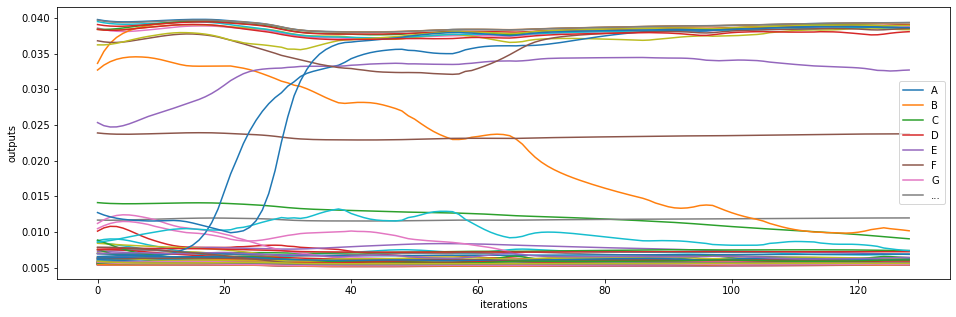

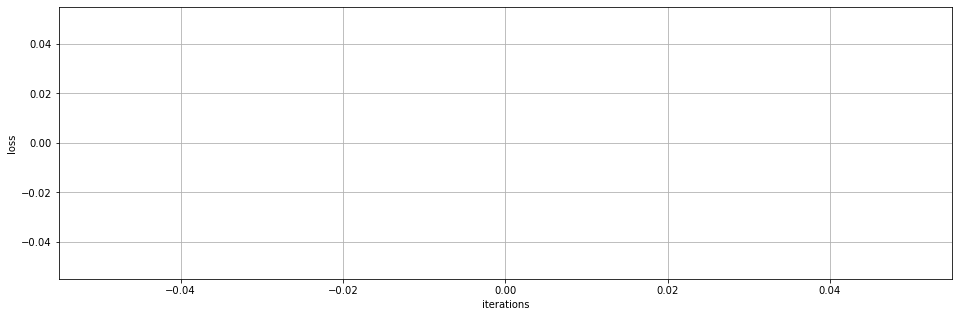

mmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmm
---------------
epoch 1
---------------
epoch 2
---------------
epoch 3
---------------
epoch 4
---------------
epoch 5
---------------
epoch 5
learning rate: 0.00065
sample 0
---------------
epoch 5
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.62799363e-01]
 [6.61194449e-05]
 [6.65833494e-05]
 [6.60693143e-05]
 [6.61433351e-05]
 [6.61484933e-05]
 [6.64380765e-05]
 [6.62925036e-05]
 [6.60865943e-05]
 [6.61176120e-05]
 [6.62117688e-05]
 [6.64291471e-05]
 [6.61103921e-05

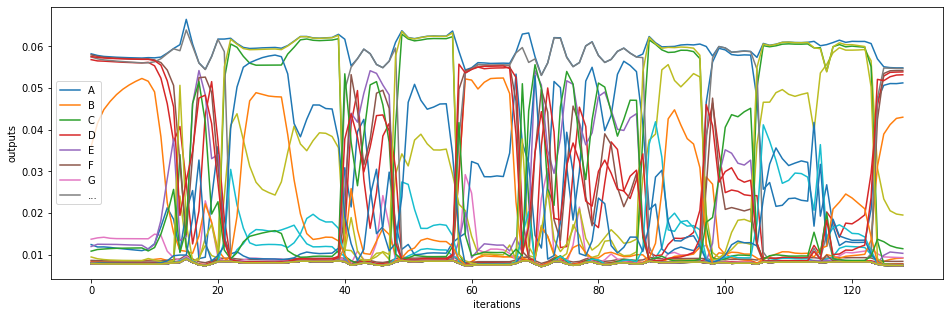

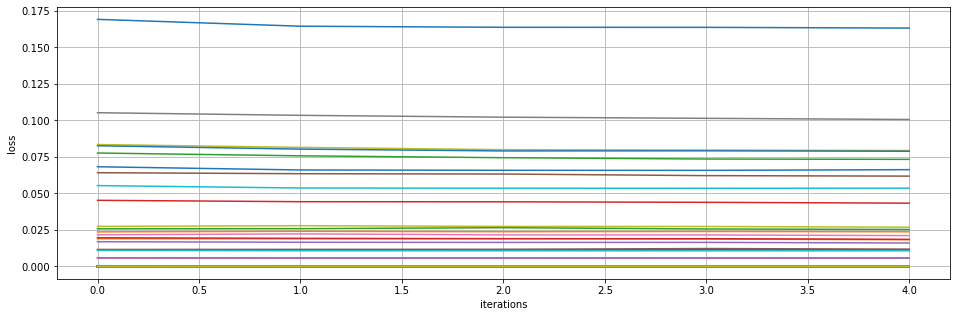

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 6
---------------
epoch 7
---------------
epoch 8
---------------
epoch 9
---------------
epoch 10
---------------
epoch 10
learning rate: 0.00065
sample 0
---------------
epoch 10
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.61858796e-01]
 [7.65796906e-05]
 [7.65267729e-05]
 [7.64031183e-05]
 [7.63276537e-05]
 [7.64844280e-05]
 [7.66680115e-05]
 [7.64339567e-05]
 [7.63458546e-05]
 [7.63493068e-05]
 [7.62678946e-05]
 [7.64591670e-05]
 [7.64281960e

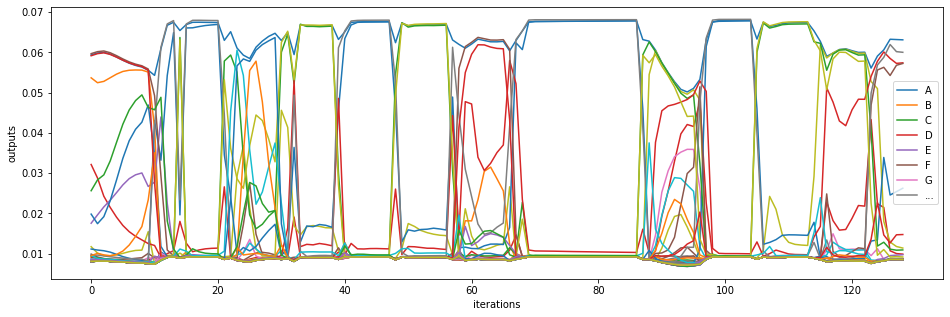

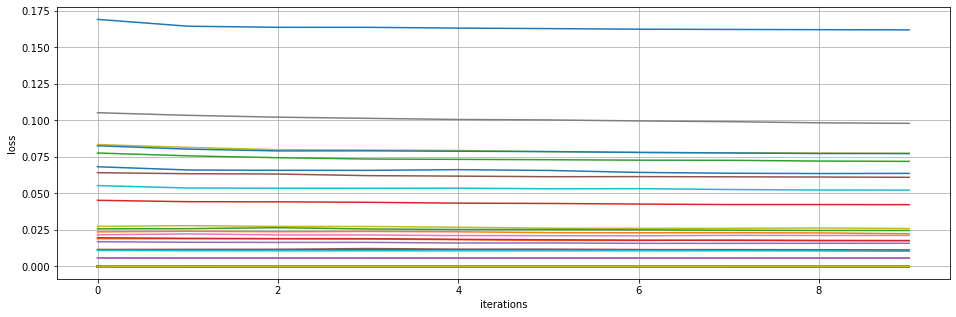

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 11
---------------
epoch 12
---------------
epoch 13
---------------
epoch 14
---------------
epoch 15
---------------
epoch 15
learning rate: 0.00065
sample 0
---------------
epoch 15
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.61933124e-01]
 [7.50790976e-05]
 [7.50404057e-05]
 [7.51135708e-05]
 [7.50490910e-05]
 [7.51161632e-05]
 [7.51544118e-05]
 [7.51349944e-05]
 [7.50742575e-05]
 [7.52164332e-05]
 [7.50616495e-05]
 [7.51219257e-05]
 [7.50907

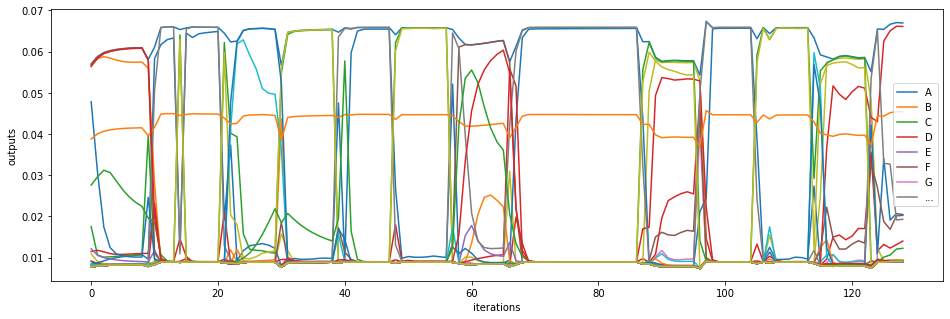

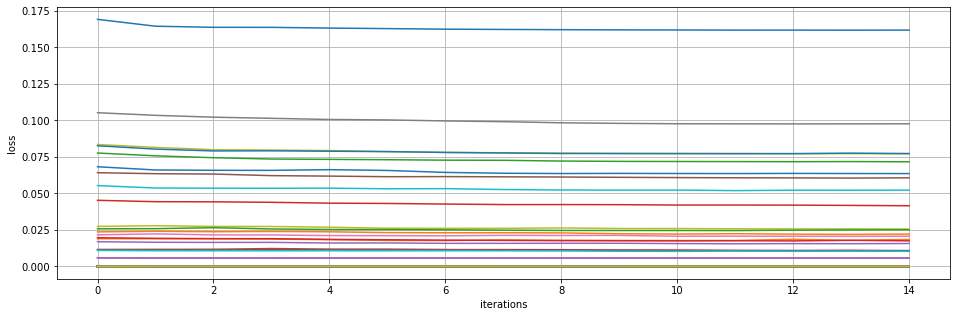

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 16
---------------
epoch 17
---------------
epoch 18
---------------
epoch 19
---------------
epoch 20
---------------
epoch 20
learning rate: 0.00065
sample 0
---------------
epoch 20
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.60996591e-01]
 [8.38418309e-05]
 [8.38388856e-05]
 [8.38843562e-05]
 [8.38887849e-05]
 [8.38867415e-05]
 [8.39181927e-05]
 [8.38583582e-05]
 [8.38766127e-05]
 [8.38594295e-05]
 [8.38784786e-05]
 [8.38709565e-05]
 [8.39054

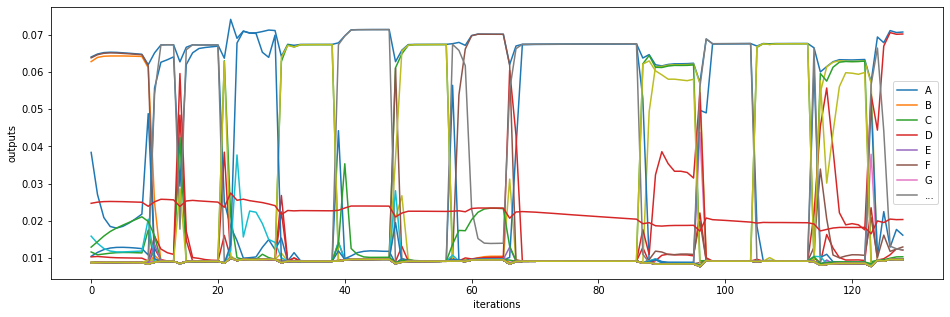

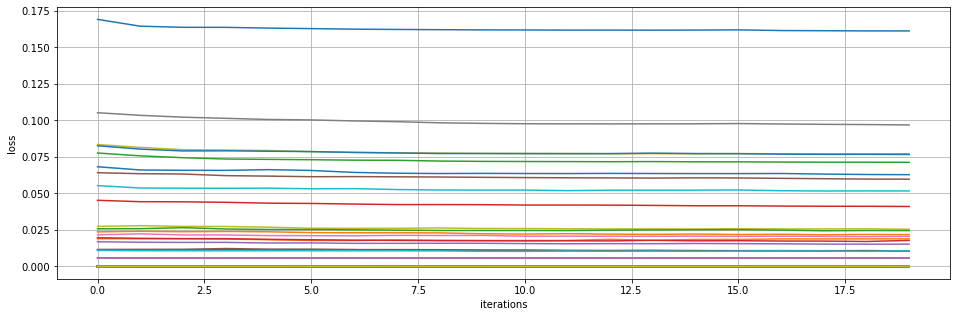

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 21
---------------
epoch 22
---------------
epoch 23
---------------
epoch 24
---------------
epoch 25
---------------
epoch 25
learning rate: 0.00065
sample 0
---------------
epoch 25
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.60655069e-01]
 [8.72282054e-05]
 [8.72268820e-05]
 [8.73208171e-05]
 [8.72888861e-05]
 [8.73432578e-05]
 [8.74105027e-05]
 [8.72499838e-05]
 [8.74391891e-05]
 [8.72640911e-05]
 [8.72727574e-05]
 [8.72902199e-05]
 [8.73917

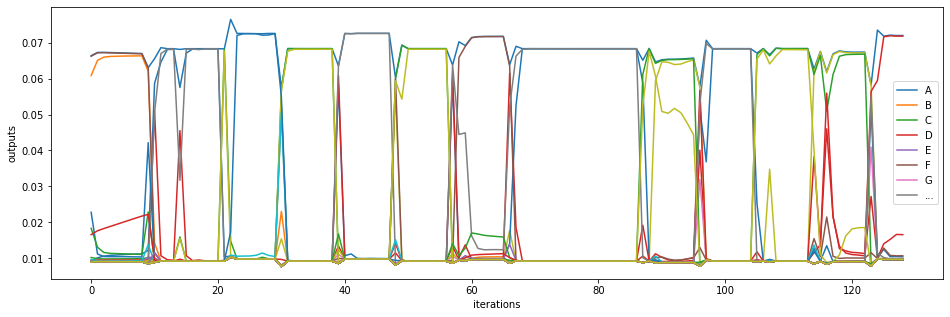

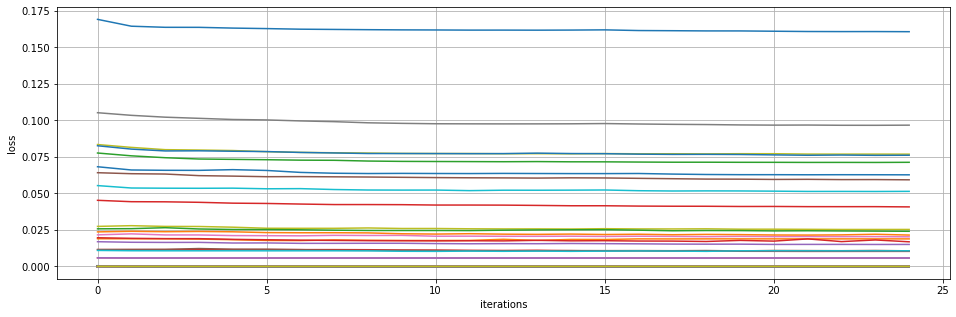

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 26
---------------
epoch 27
---------------
epoch 28
---------------
epoch 29
---------------
epoch 30
---------------
epoch 30
learning rate: 0.00065
sample 0
---------------
epoch 30
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.60625000e-01]
 [8.73353223e-05]
 [8.73361047e-05]
 [8.73858998e-05]
 [8.73915163e-05]
 [8.73908371e-05]
 [8.74099035e-05]
 [8.73542007e-05]
 [8.73731957e-05]
 [8.73603579e-05]
 [8.73816525e-05]
 [8.73606740e-05]
 [8.73966

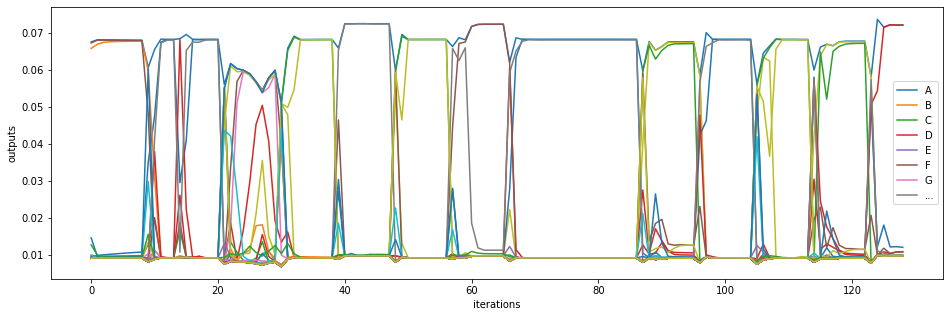

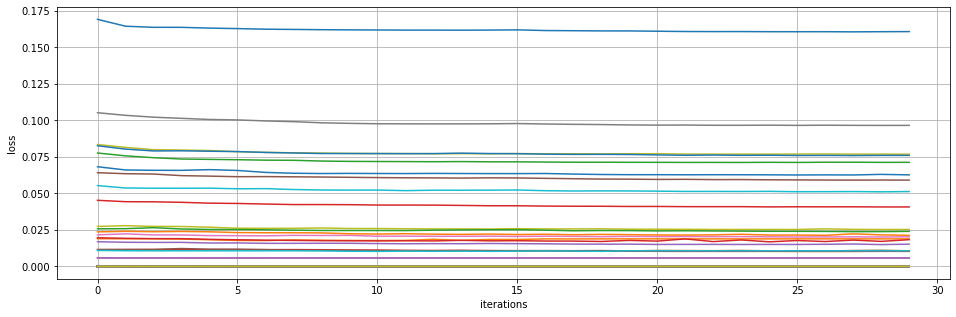

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 31
---------------
epoch 32
---------------
epoch 33
---------------
epoch 34
---------------
epoch 35
---------------
epoch 35
learning rate: 0.00065
sample 0
---------------
epoch 35
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.60351910e-01]
 [8.97405453e-05]
 [8.97424381e-05]
 [8.97865202e-05]
 [8.97962915e-05]
 [8.97883076e-05]
 [8.98114841e-05]
 [8.97515855e-05]
 [8.97878965e-05]
 [8.97669347e-05]
 [8.97843020e-05]
 [8.97626212e-05]
 [8.98032

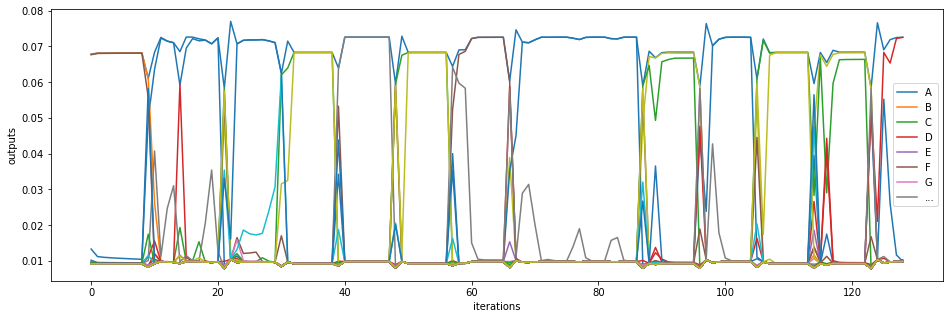

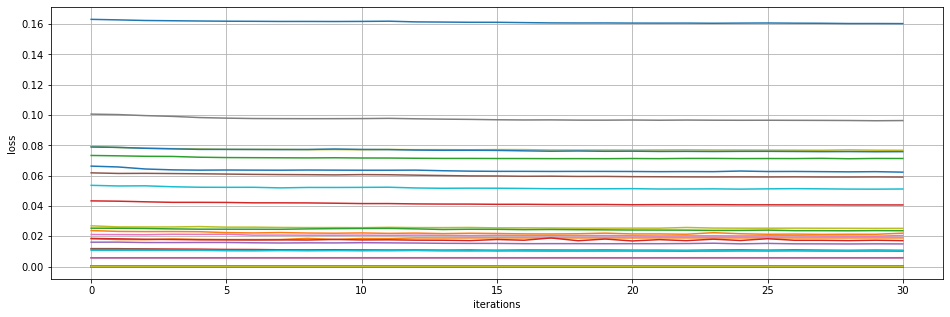

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 36
---------------
epoch 37
---------------
epoch 38
---------------
epoch 39
---------------
epoch 40
---------------
epoch 40
learning rate: 0.00065
sample 0
---------------
epoch 40
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.60110724e-01]
 [9.04898867e-05]
 [9.04971661e-05]
 [9.05405498e-05]
 [9.05494075e-05]
 [9.05401987e-05]
 [9.05657047e-05]
 [9.05013969e-05]
 [9.05064160e-05]
 [9.05164173e-05]
 [9.05364750e-05]
 [9.05113758e-05]
 [9.05526

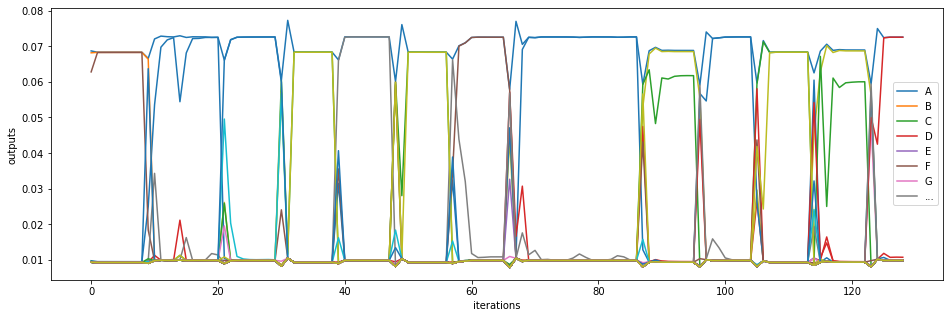

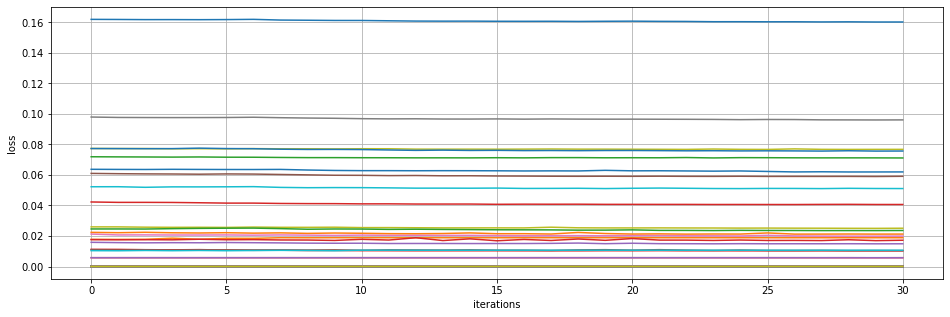

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 41
---------------
epoch 42
---------------
epoch 43
---------------
epoch 44
---------------
epoch 45
---------------
epoch 45
learning rate: 0.00065
sample 0
---------------
epoch 45
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.60173067e-01]
 [9.02923110e-05]
 [9.03006105e-05]
 [9.03373100e-05]
 [9.03498262e-05]
 [9.03404663e-05]
 [9.03671141e-05]
 [9.02999213e-05]
 [9.04129370e-05]
 [9.03182788e-05]
 [9.03354090e-05]
 [9.03150907e-05]
 [9.03542

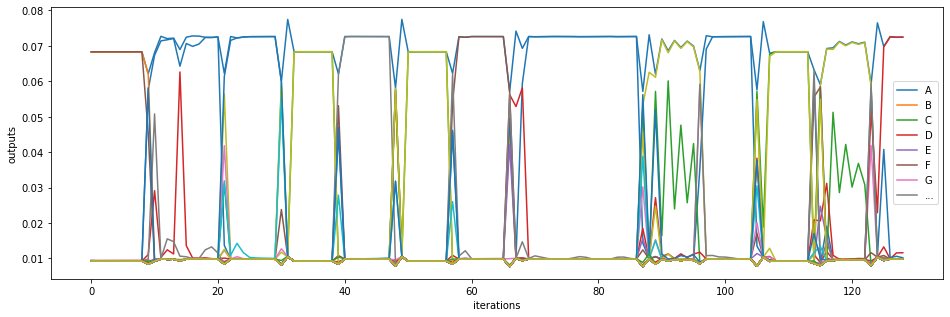

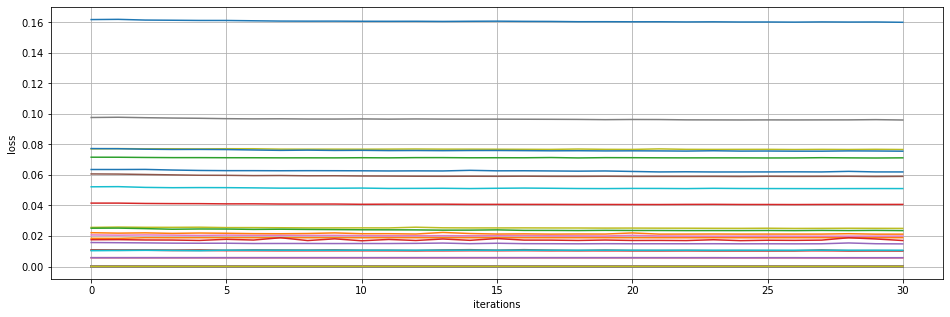

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 46
---------------
epoch 47
---------------
epoch 48
---------------
epoch 49
---------------
epoch 50
---------------
epoch 50
learning rate: 0.00065
sample 0
---------------
epoch 50
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59926254e-01]
 [9.06832052e-05]
 [9.06941329e-05]
 [9.07304606e-05]
 [9.07412610e-05]
 [9.07332942e-05]
 [9.07544767e-05]
 [9.06915491e-05]
 [9.07028246e-05]
 [9.07126494e-05]
 [9.07254222e-05]
 [9.07037185e-05]
 [9.07439

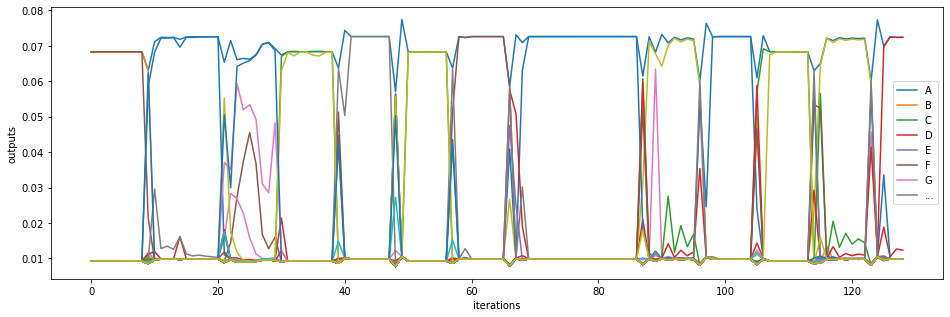

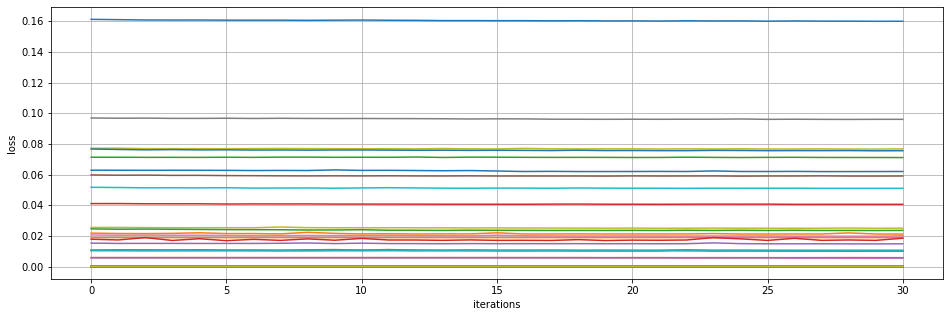

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 51
---------------
epoch 52
---------------
epoch 53
---------------
epoch 54
---------------
epoch 55
---------------
epoch 55
learning rate: 0.00065
sample 0
---------------
epoch 55
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59750171e-01]
 [9.12152851e-05]
 [9.12253467e-05]
 [9.12578054e-05]
 [9.12707826e-05]
 [9.12637796e-05]
 [9.12815322e-05]
 [9.12218033e-05]
 [9.12292024e-05]
 [9.12434540e-05]
 [9.12554483e-05]
 [9.12345082e-05]
 [9.12730

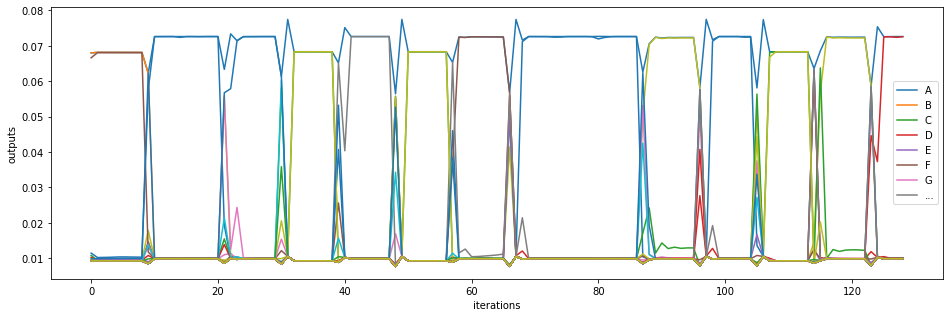

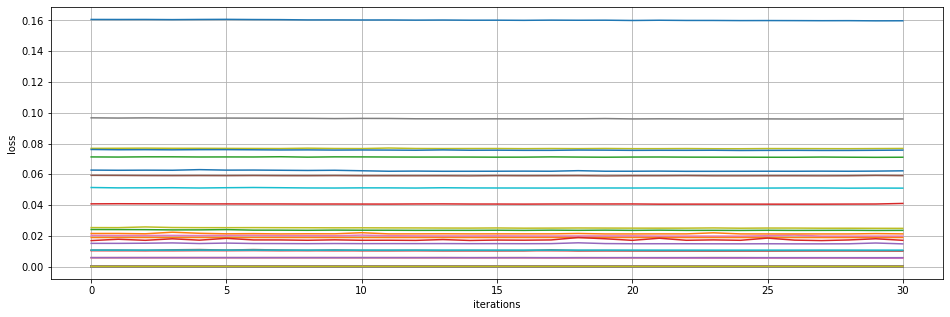

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 56
---------------
epoch 57
---------------
epoch 58
---------------
epoch 59
---------------
epoch 60
---------------
epoch 60
learning rate: 0.00065
sample 0
---------------
epoch 60
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59776801e-01]
 [9.06547165e-05]
 [9.06649892e-05]
 [9.06953797e-05]
 [9.07096393e-05]
 [9.07027917e-05]
 [9.07178828e-05]
 [9.06604301e-05]
 [9.06719205e-05]
 [9.06824942e-05]
 [9.06939727e-05]
 [9.06748352e-05]
 [9.07105

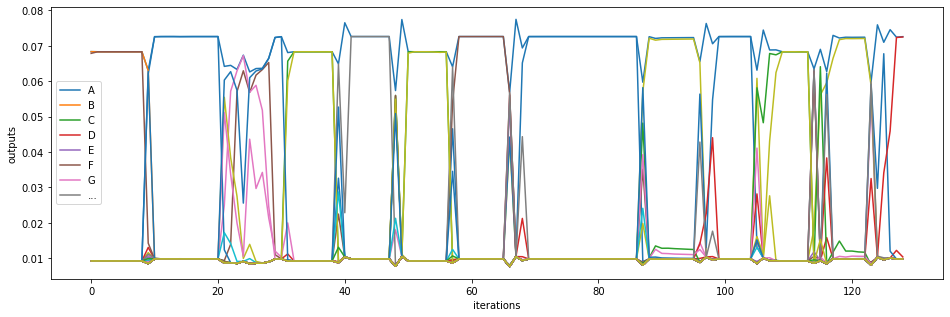

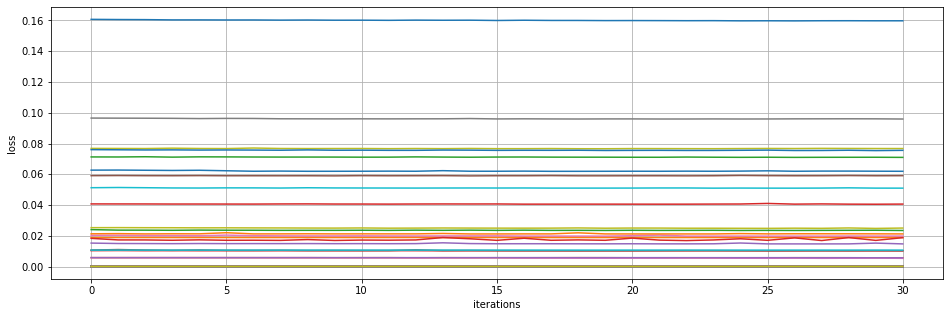

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 61
---------------
epoch 62
---------------
epoch 63
---------------
epoch 64
---------------
epoch 65
---------------
epoch 65
learning rate: 0.00065
sample 0
---------------
epoch 65
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59825546e-01]
 [9.13019631e-05]
 [9.13120573e-05]
 [9.13400033e-05]
 [9.13572109e-05]
 [9.13469672e-05]
 [9.13646014e-05]
 [9.13069211e-05]
 [9.13868777e-05]
 [9.13325452e-05]
 [9.13371651e-05]
 [9.13270684e-05]
 [9.13596

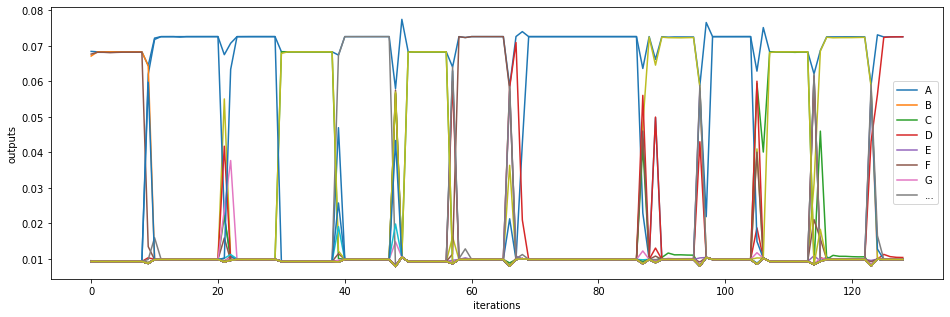

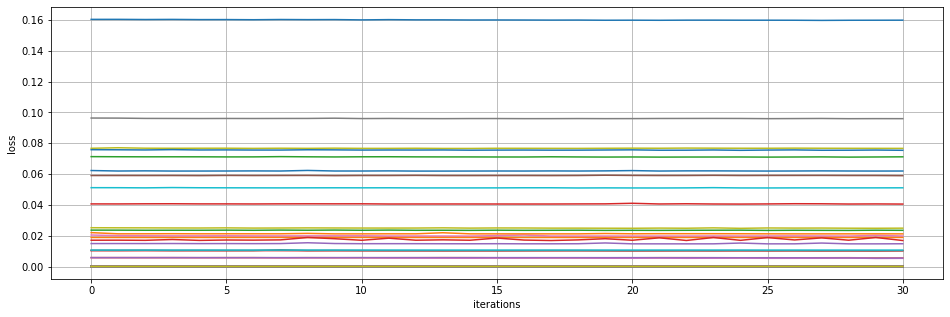

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 66
---------------
epoch 67
---------------
epoch 68
---------------
epoch 69
---------------
epoch 70
---------------
epoch 70
learning rate: 0.00065
sample 0
---------------
epoch 70
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59705021e-01]
 [9.18900867e-05]
 [9.19025097e-05]
 [9.19305185e-05]
 [9.19463639e-05]
 [9.19384181e-05]
 [9.19537635e-05]
 [9.18950442e-05]
 [9.19129989e-05]
 [9.19182776e-05]
 [9.19255097e-05]
 [9.19107122e-05]
 [9.19490

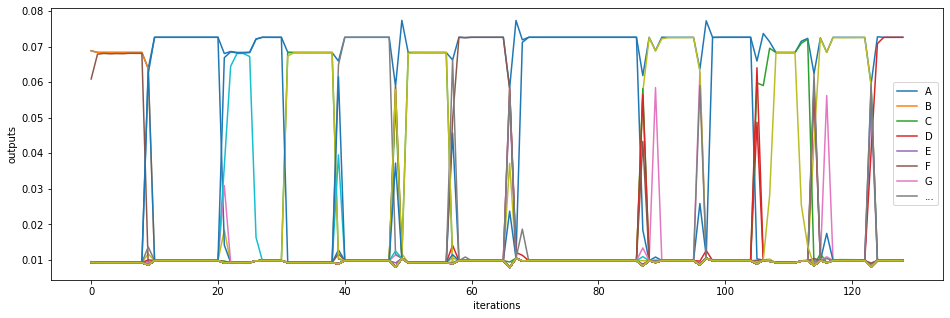

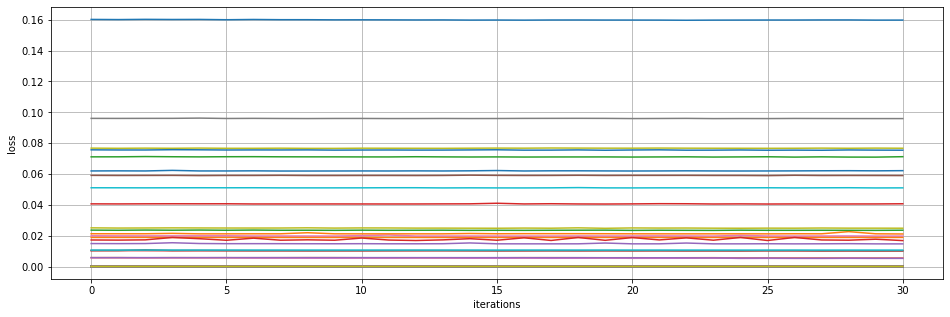

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 71
---------------
epoch 72
---------------
epoch 73
---------------
epoch 74
---------------
epoch 75
---------------
epoch 75
learning rate: 0.00065
sample 0
---------------
epoch 75
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59676509e-01]
 [9.24946314e-05]
 [9.25097399e-05]
 [9.25388473e-05]
 [9.25612518e-05]
 [9.25480667e-05]
 [9.25814703e-05]
 [9.25021242e-05]
 [9.27060270e-05]
 [9.25260855e-05]
 [9.25321043e-05]
 [9.25320745e-05]
 [9.25647

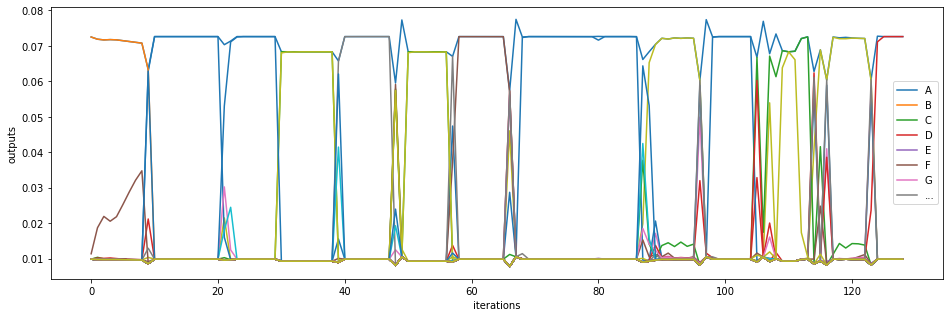

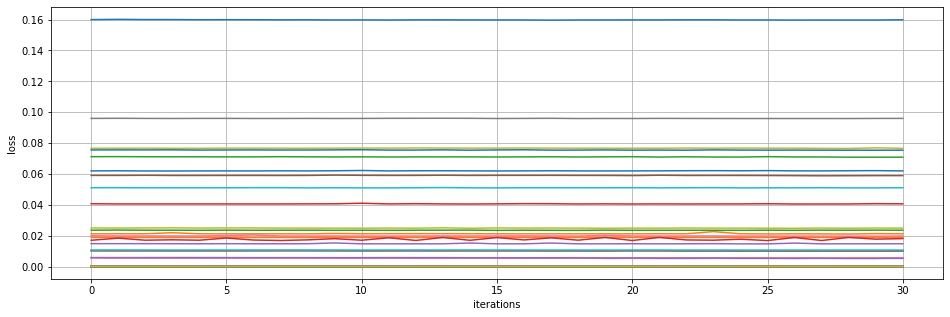

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 76
---------------
epoch 77
---------------
epoch 78
---------------
epoch 79
---------------
epoch 80
---------------
epoch 80
learning rate: 0.00065
sample 0
---------------
epoch 80
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59520254e-01]
 [9.35068638e-05]
 [9.35206181e-05]
 [9.35433119e-05]
 [9.35560963e-05]
 [9.35535763e-05]
 [9.35677453e-05]
 [9.35081709e-05]
 [9.35222227e-05]
 [9.35332281e-05]
 [9.35408270e-05]
 [9.35249335e-05]
 [9.35646

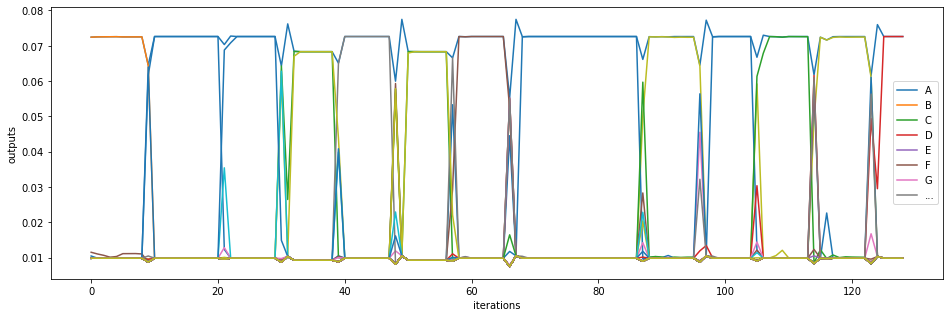

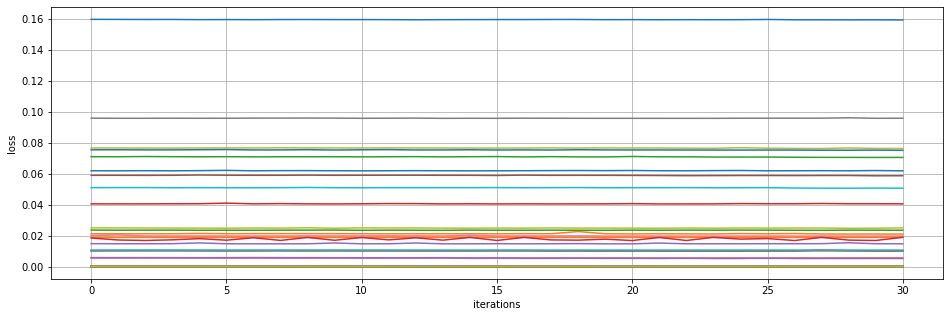

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 81
---------------
epoch 82
---------------
epoch 83
---------------
epoch 84
---------------
epoch 85
---------------
epoch 85
learning rate: 0.00065
sample 0
---------------
epoch 85
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59524027e-01]
 [9.42385861e-05]
 [9.42515512e-05]
 [9.42741369e-05]
 [9.42867399e-05]
 [9.42868299e-05]
 [9.42977249e-05]
 [9.42397628e-05]
 [9.42564392e-05]
 [9.42636159e-05]
 [9.42732227e-05]
 [9.42550773e-05]
 [9.42941

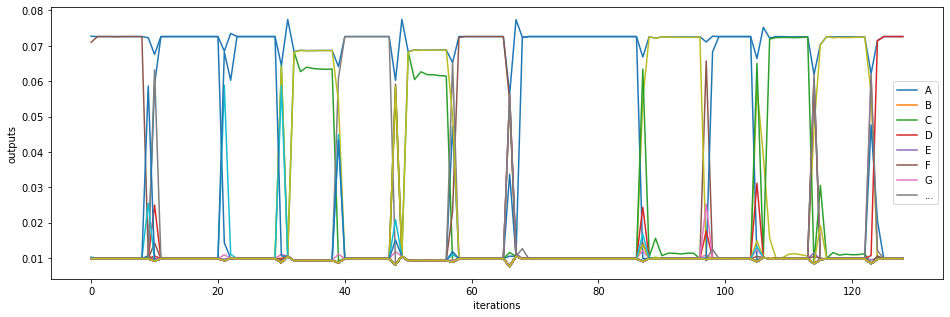

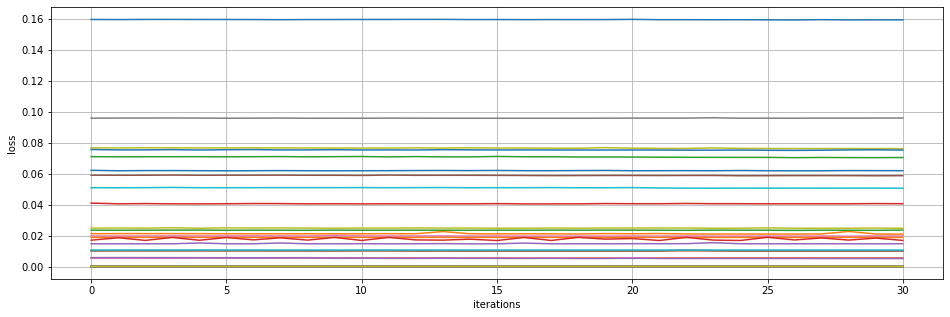

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 86
---------------
epoch 87
---------------
epoch 88
---------------
epoch 89
---------------
epoch 90
---------------
epoch 90
learning rate: 0.00065
sample 0
---------------
epoch 90
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59446491e-01]
 [9.54896333e-05]
 [9.55027344e-05]
 [9.55265511e-05]
 [9.55387290e-05]
 [9.55378500e-05]
 [9.55489344e-05]
 [9.54913959e-05]
 [9.55035194e-05]
 [9.55154739e-05]
 [9.55241252e-05]
 [9.55055578e-05]
 [9.55414

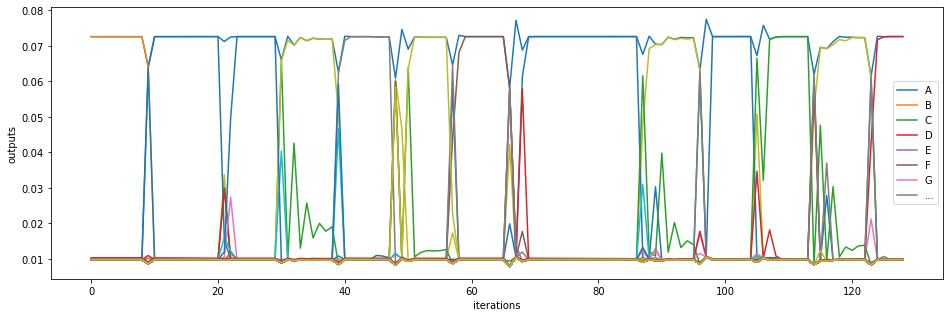

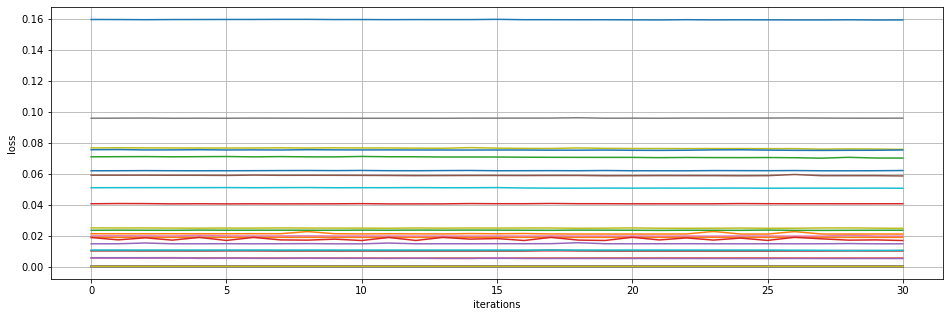

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 91
---------------
epoch 92
---------------
epoch 93
---------------
epoch 94
---------------
epoch 95
---------------
epoch 95
learning rate: 0.00065
sample 0
---------------
epoch 95
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59534607e-01]
 [9.45074541e-05]
 [9.45139840e-05]
 [9.45332123e-05]
 [9.45460982e-05]
 [9.45424684e-05]
 [9.45517396e-05]
 [9.45071567e-05]
 [9.45190154e-05]
 [9.45339504e-05]
 [9.45361062e-05]
 [9.45199443e-05]
 [9.45548

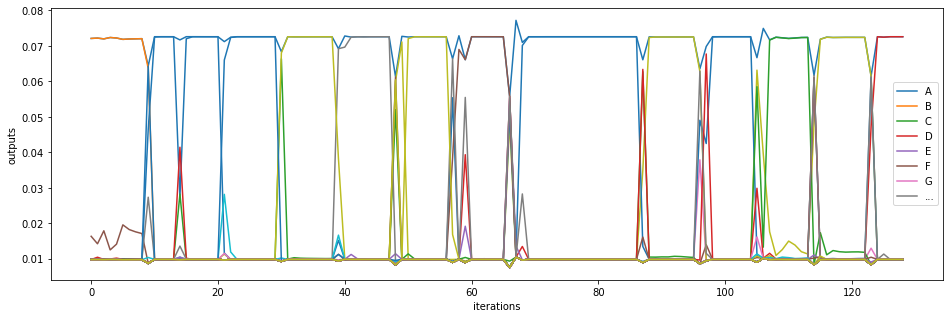

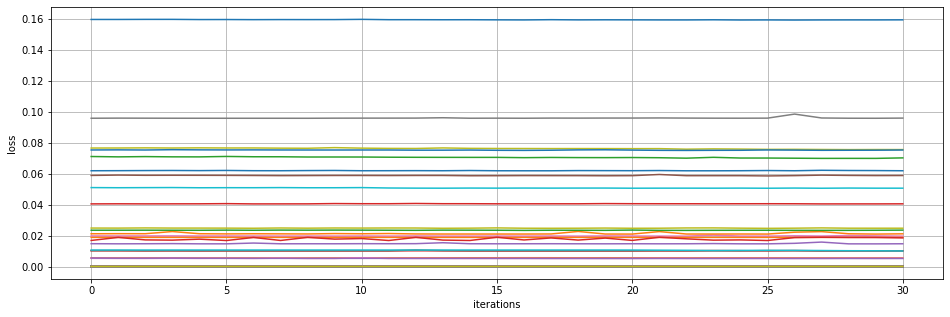

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 96
---------------
epoch 97
---------------
epoch 98
---------------
epoch 99
---------------
epoch 100
---------------
epoch 100
learning rate: 0.00065
sample 0
---------------
epoch 100
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59457147e-01]
 [9.51499941e-05]
 [9.51595709e-05]
 [9.51788139e-05]
 [9.51906253e-05]
 [9.51881397e-05]
 [9.51992581e-05]
 [9.51493640e-05]
 [9.51604595e-05]
 [9.51751561e-05]
 [9.51790256e-05]
 [9.51631739e-05]
 [9.51

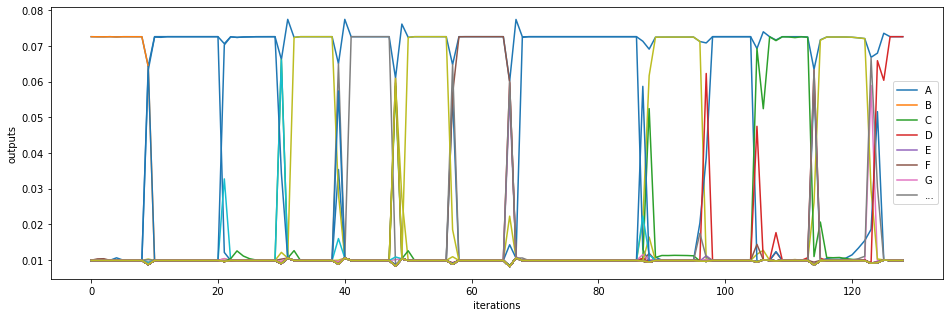

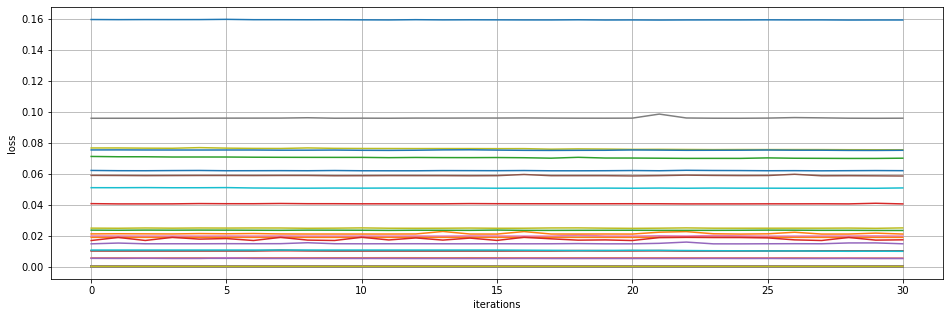

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 101
---------------
epoch 102
---------------
epoch 103
---------------
epoch 104
---------------
epoch 105
---------------
epoch 105
learning rate: 0.00065
sample 0
---------------
epoch 105
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59602070e-01]
 [9.47000451e-05]
 [9.47097781e-05]
 [9.47287169e-05]
 [9.47398074e-05]
 [9.47384761e-05]
 [9.47506808e-05]
 [9.46996333e-05]
 [9.47109389e-05]
 [9.47253480e-05]
 [9.47297080e-05]
 [9.47114624e-05]
 [

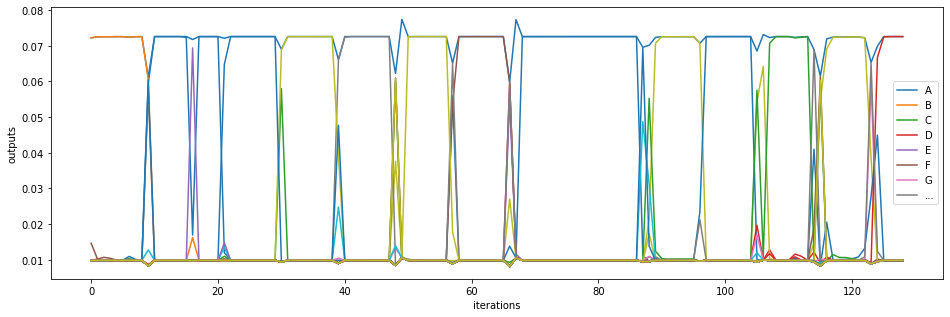

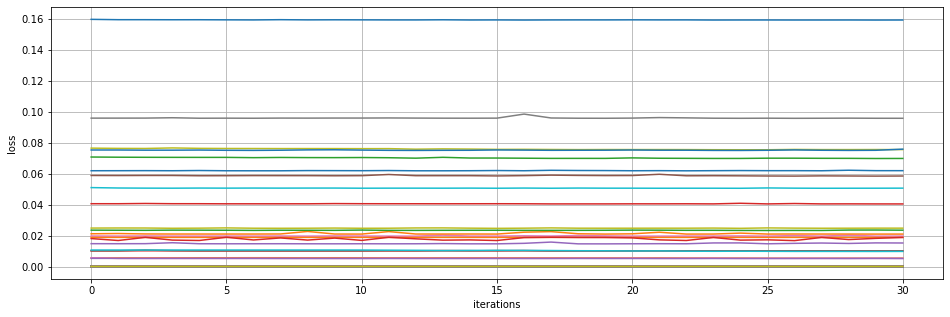

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 106
---------------
epoch 107
---------------
epoch 108
---------------
epoch 109
---------------
epoch 110
---------------
epoch 110
learning rate: 0.00065
sample 0
---------------
epoch 110
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59459535e-01]
 [9.55636314e-05]
 [9.55732274e-05]
 [9.55913075e-05]
 [9.56027701e-05]
 [9.56030318e-05]
 [9.56145192e-05]
 [9.55613152e-05]
 [9.55751622e-05]
 [9.55919568e-05]
 [9.55955567e-05]
 [9.55759815e-05]
 [

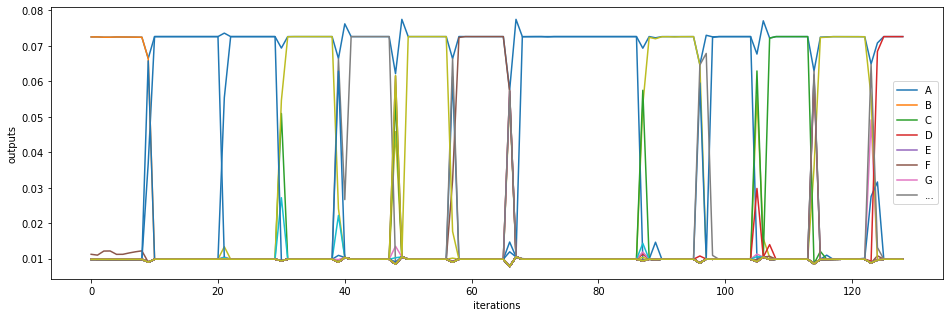

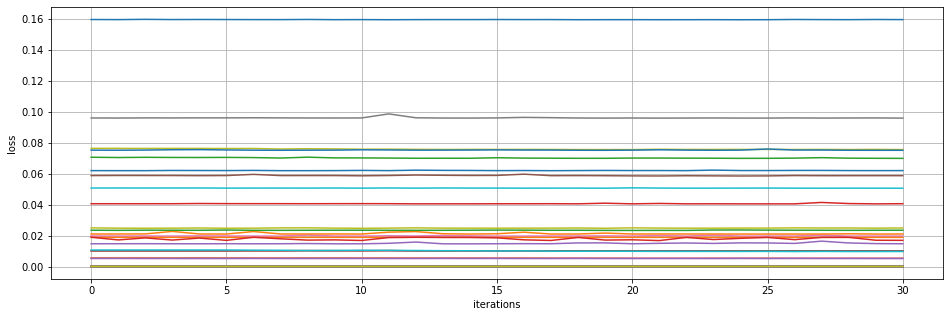

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 111
---------------
epoch 112
---------------
epoch 113
---------------
epoch 114
---------------
epoch 115
---------------
epoch 115
learning rate: 0.00065
sample 0
---------------
epoch 115
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59492209e-01]
 [9.55298734e-05]
 [9.55367817e-05]
 [9.55541949e-05]
 [9.55670390e-05]
 [9.55633698e-05]
 [9.55728298e-05]
 [9.55281956e-05]
 [9.55440971e-05]
 [9.55545875e-05]
 [9.55571859e-05]
 [9.55406400e-05]
 [

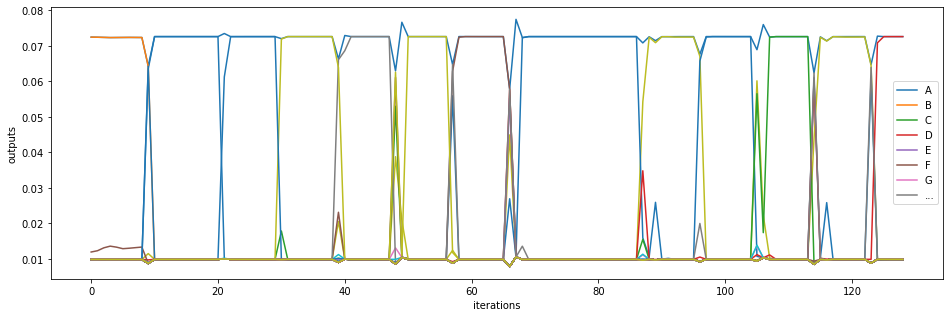

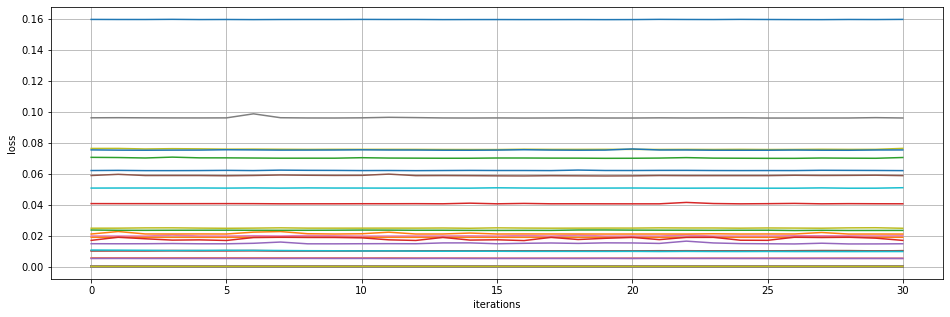

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 116
---------------
epoch 117
---------------
epoch 118
---------------
epoch 119
---------------
epoch 120
---------------
epoch 120
learning rate: 0.00065
sample 0
---------------
epoch 120
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59567700e-01]
 [9.50329122e-05]
 [9.50372671e-05]
 [9.50515736e-05]
 [9.50619193e-05]
 [9.50592541e-05]
 [9.50686872e-05]
 [9.50288688e-05]
 [9.50411901e-05]
 [9.50570578e-05]
 [9.50564542e-05]
 [9.50411147e-05]
 [

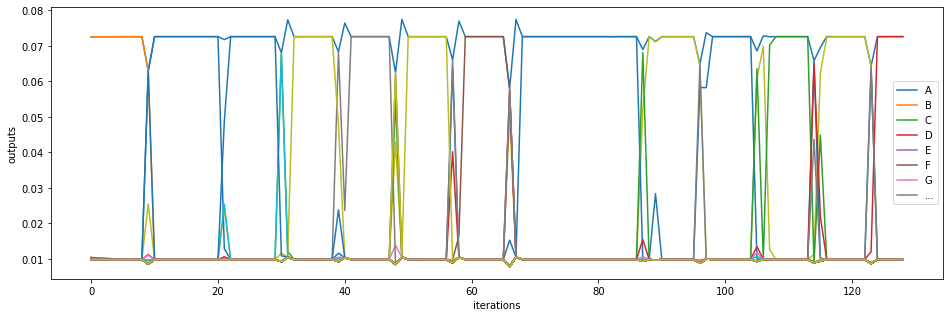

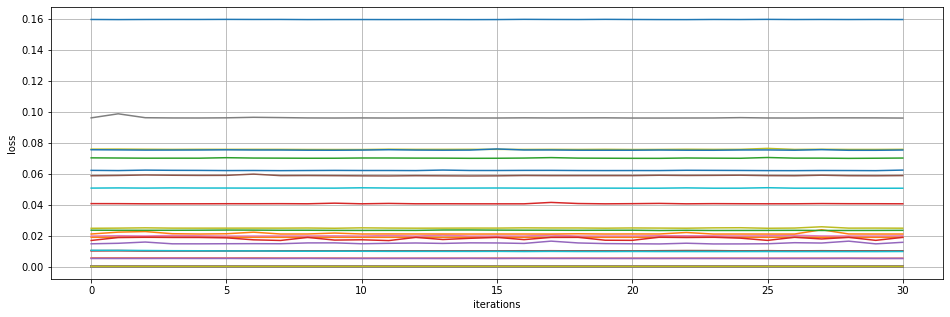

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 121
---------------
epoch 122
---------------
epoch 123
---------------
epoch 124
---------------
epoch 125
---------------
epoch 125
learning rate: 0.00065
sample 0
---------------
epoch 125
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59550206e-01]
 [9.50951139e-05]
 [9.50993663e-05]
 [9.51136035e-05]
 [9.51234781e-05]
 [9.51199519e-05]
 [9.51301882e-05]
 [9.50912068e-05]
 [9.51011183e-05]
 [9.51187636e-05]
 [9.51169519e-05]
 [9.51020623e-05]
 [

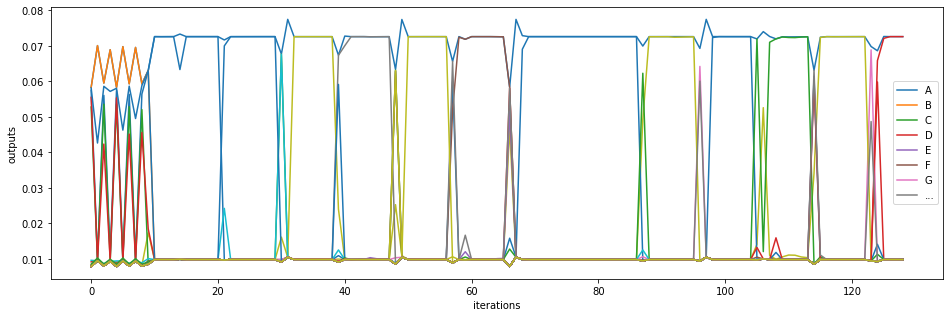

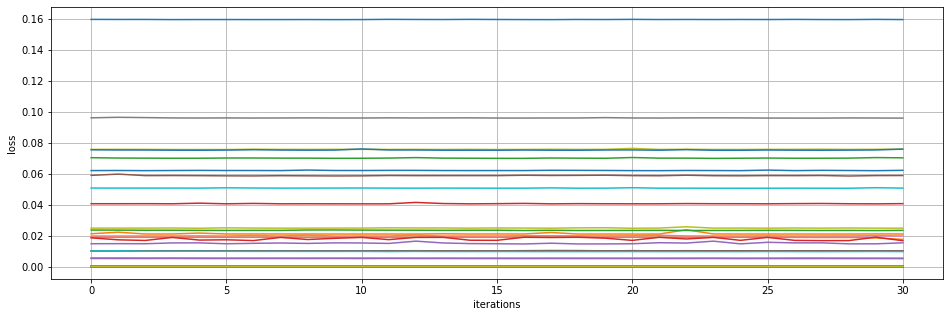

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 126
---------------
epoch 127
---------------
epoch 128
---------------
epoch 129
---------------
epoch 130
---------------
epoch 130
learning rate: 0.00065
sample 0
---------------
epoch 130
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59418975e-01]
 [9.61214731e-05]
 [9.61266890e-05]
 [9.61409625e-05]
 [9.61505189e-05]
 [9.61473755e-05]
 [9.61593366e-05]
 [9.61172582e-05]
 [9.61322531e-05]
 [9.61447608e-05]
 [9.61436836e-05]
 [9.61287255e-05]
 [

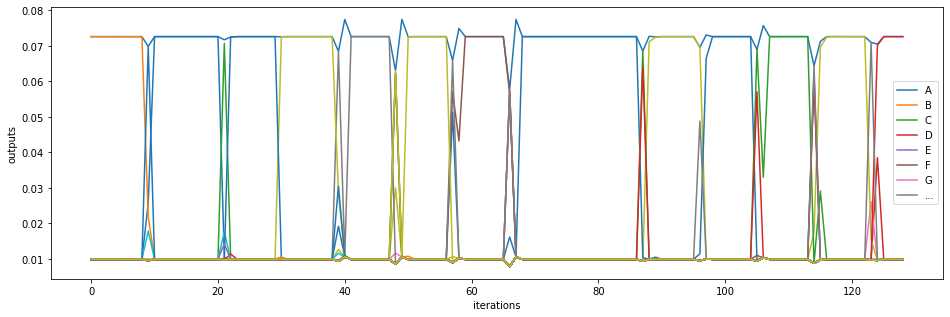

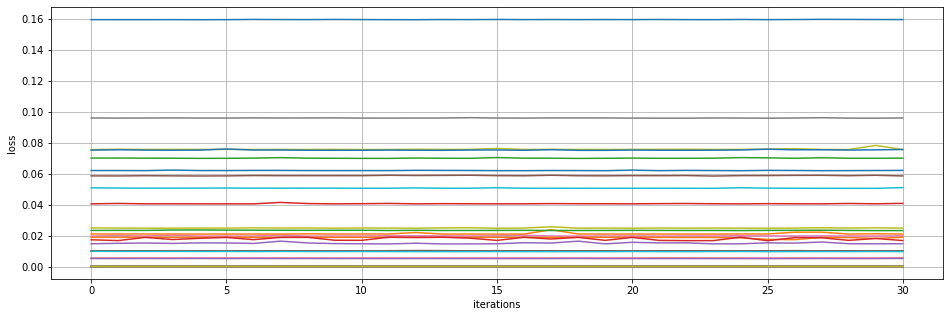

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 131
---------------
epoch 132
---------------
epoch 133
---------------
epoch 134
---------------
epoch 135
---------------
epoch 135
learning rate: 0.00065
sample 0
---------------
epoch 135
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59488390e-01]
 [9.56240630e-05]
 [9.56294199e-05]
 [9.56421368e-05]
 [9.56494792e-05]
 [9.56489828e-05]
 [9.56612976e-05]
 [9.56183511e-05]
 [9.56304964e-05]
 [9.56463051e-05]
 [9.56461196e-05]
 [9.56293914e-05]
 [

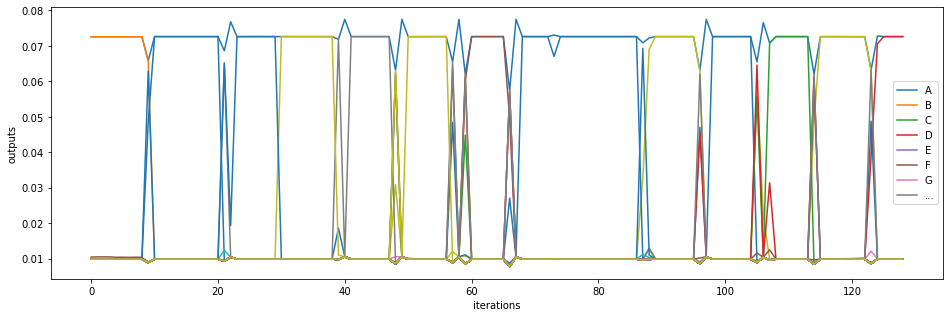

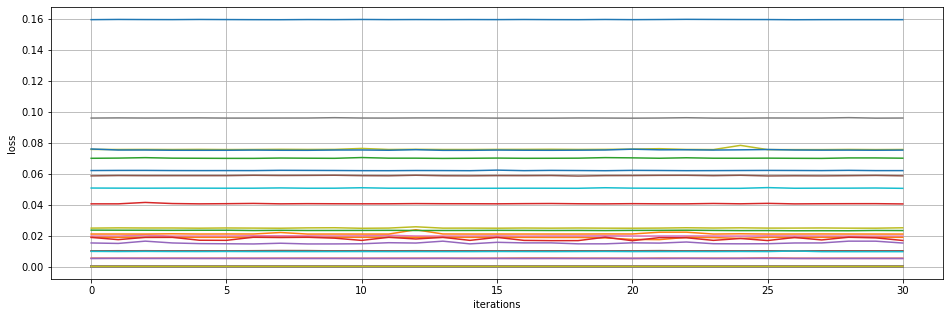

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 136
---------------
epoch 137
---------------
epoch 138
---------------
epoch 139
---------------
epoch 140
---------------
epoch 140
learning rate: 0.00065
sample 0
---------------
epoch 140
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59833948e-01]
 [9.43137450e-05]
 [9.43208105e-05]
 [9.43329330e-05]
 [9.43418302e-05]
 [9.43404800e-05]
 [9.43552069e-05]
 [9.43074762e-05]
 [9.43222687e-05]
 [9.43388970e-05]
 [9.43371753e-05]
 [9.43230760e-05]
 [

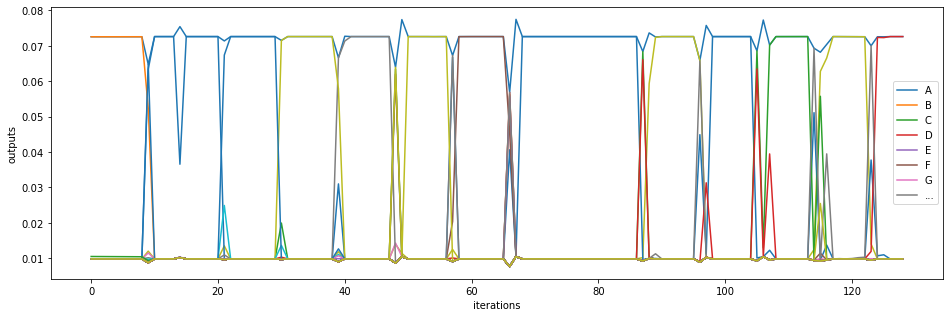

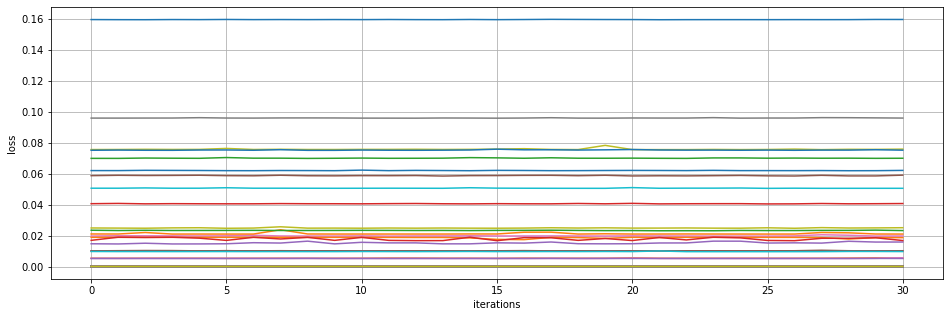

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 141
---------------
epoch 142
---------------
epoch 143
---------------
epoch 144
---------------
epoch 145
---------------
epoch 145
learning rate: 0.00065
sample 0
---------------
epoch 145
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59690553e-01]
 [9.43674832e-05]
 [9.43763299e-05]
 [9.43898275e-05]
 [9.44154446e-05]
 [9.43968118e-05]
 [9.44151218e-05]
 [9.43624477e-05]
 [9.43842763e-05]
 [9.43959226e-05]
 [9.43904163e-05]
 [9.43811893e-05]
 [

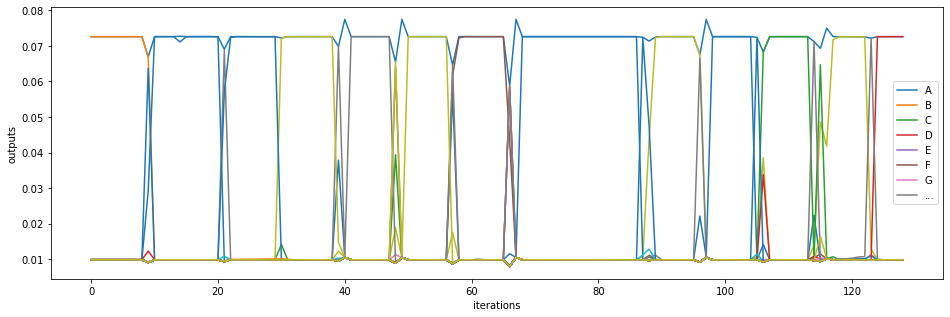

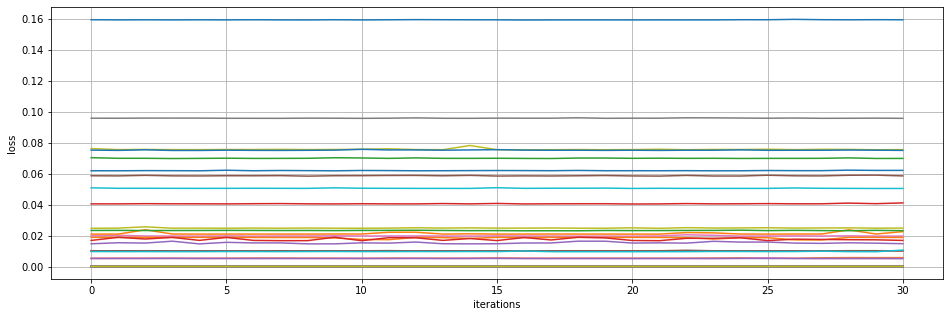

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 146
---------------
epoch 147
---------------
epoch 148
---------------
epoch 149
---------------
epoch 150
---------------
epoch 150
learning rate: 0.00065
sample 0
---------------
epoch 150
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59469929e-01]
 [9.53655668e-05]
 [9.53729684e-05]
 [9.53851596e-05]
 [9.53925883e-05]
 [9.53920878e-05]
 [9.54067717e-05]
 [9.53595162e-05]
 [9.53735324e-05]
 [9.53893137e-05]
 [9.53882435e-05]
 [9.53729800e-05]
 [

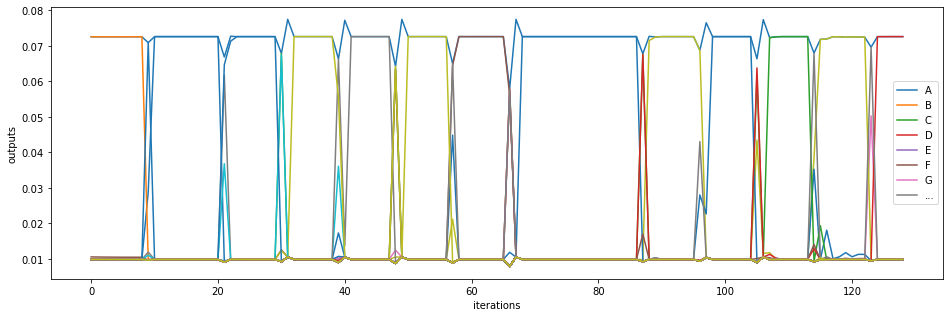

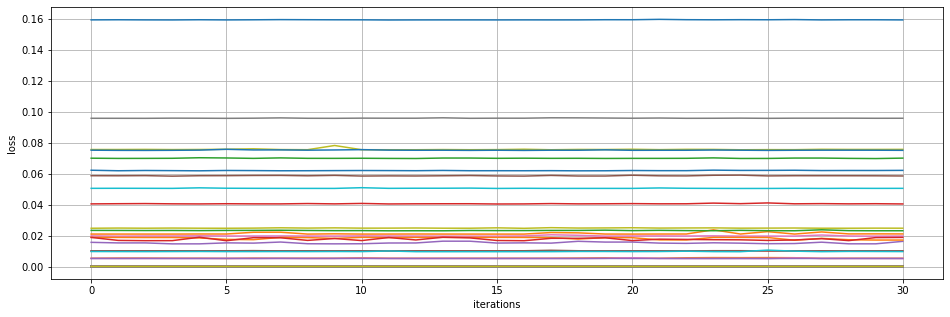

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 151
---------------
epoch 152
---------------
epoch 153
---------------
epoch 154
---------------
epoch 155
---------------
epoch 155
learning rate: 0.00065
sample 0
---------------
epoch 155
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59520541e-01]
 [9.60373224e-05]
 [9.60447981e-05]
 [9.60564582e-05]
 [9.60692902e-05]
 [9.60635918e-05]
 [9.60787763e-05]
 [9.60311299e-05]
 [9.60466306e-05]
 [9.60602492e-05]
 [9.60598809e-05]
 [9.60445101e-05]
 [

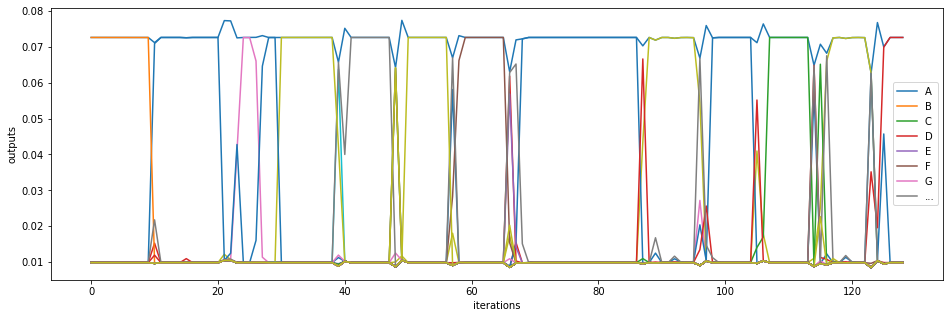

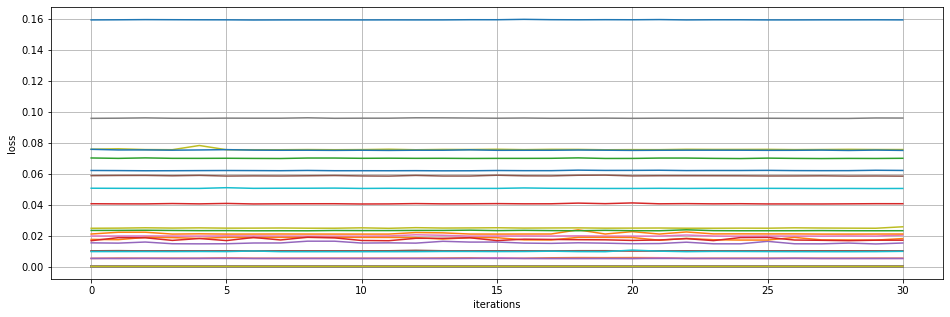

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 156
---------------
epoch 157
---------------
epoch 158
---------------
epoch 159
---------------
epoch 160
---------------
epoch 160
learning rate: 0.00065
sample 0
---------------
epoch 160
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59565739e-01]
 [9.52570872e-05]
 [9.52643254e-05]
 [9.52770093e-05]
 [9.52844436e-05]
 [9.52836426e-05]
 [9.52984217e-05]
 [9.52515562e-05]
 [9.52649702e-05]
 [9.52806750e-05]
 [9.52796919e-05]
 [9.52640911e-05]
 [

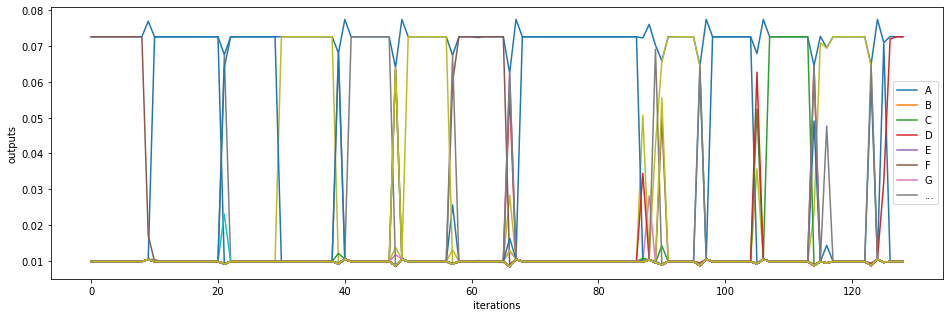

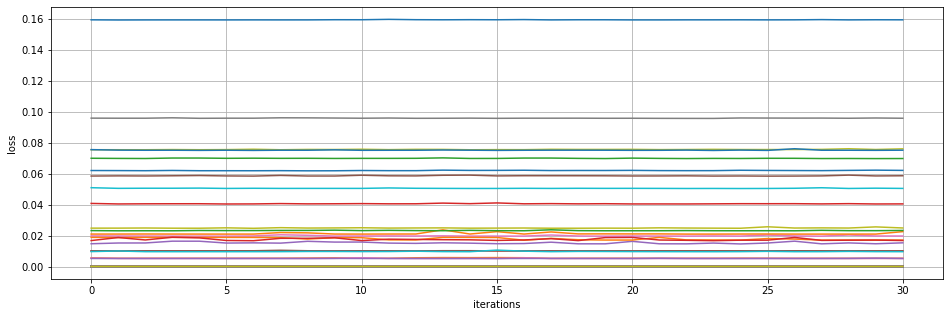

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 161
---------------
epoch 162
---------------
epoch 163
---------------
epoch 164
---------------
epoch 165
---------------
epoch 165
learning rate: 0.00065
sample 0
---------------
epoch 165
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59518388e-01]
 [9.57759631e-05]
 [9.57808567e-05]
 [9.57921726e-05]
 [9.57969678e-05]
 [9.57979276e-05]
 [9.58087088e-05]
 [9.57701129e-05]
 [9.57813306e-05]
 [9.57958956e-05]
 [9.57946334e-05]
 [9.57797728e-05]
 [

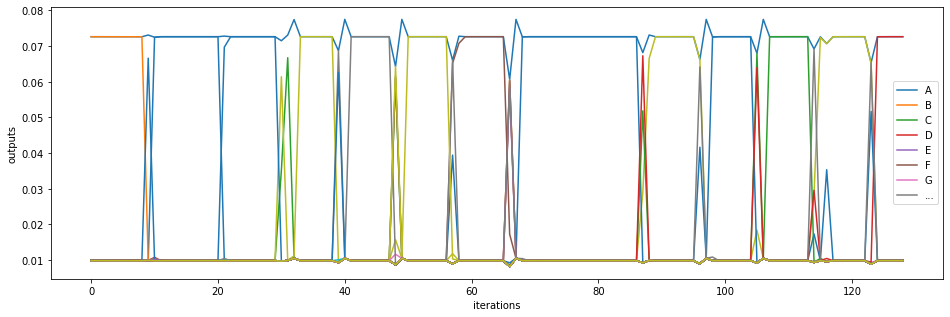

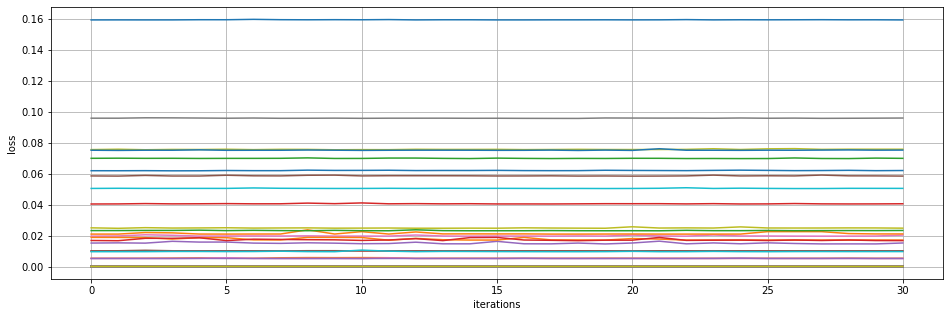

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 166
---------------
epoch 167
---------------
epoch 168
---------------
epoch 169
---------------
epoch 170
---------------
epoch 170
learning rate: 0.00065
sample 0
---------------
epoch 170
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59589420e-01]
 [9.49940326e-05]
 [9.49991504e-05]
 [9.50104694e-05]
 [9.50150587e-05]
 [9.50171486e-05]
 [9.50286371e-05]
 [9.49875809e-05]
 [9.49996102e-05]
 [9.50133974e-05]
 [9.50144855e-05]
 [9.49970336e-05]
 [

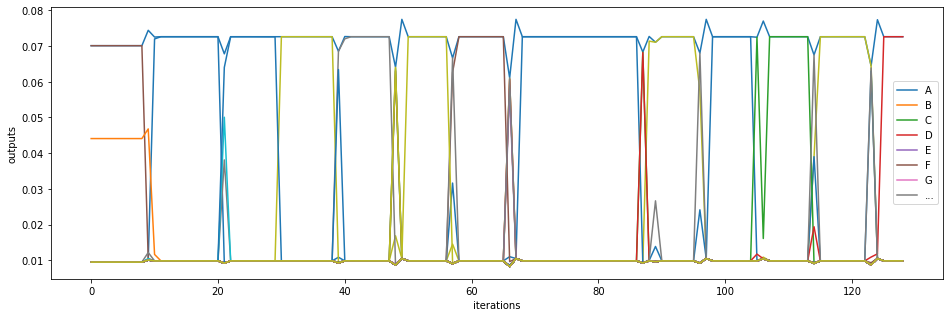

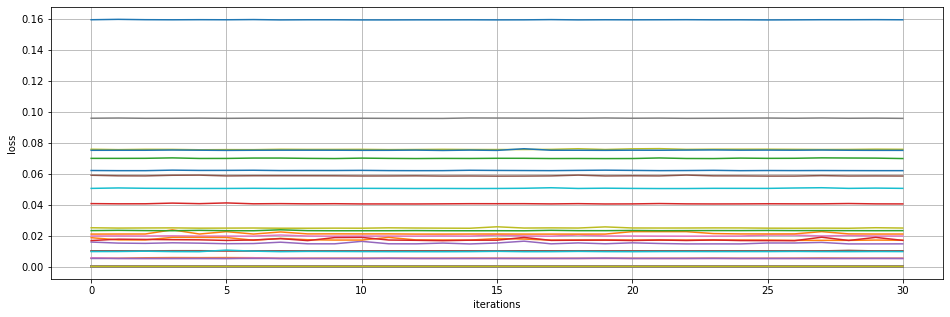

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 171
---------------
epoch 172
---------------
epoch 173
---------------
epoch 174
---------------
epoch 175
---------------
epoch 175
learning rate: 0.00065
sample 0
---------------
epoch 175
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59469364e-01]
 [9.57324455e-05]
 [9.57358703e-05]
 [9.57473106e-05]
 [9.57512965e-05]
 [9.57520665e-05]
 [9.57601717e-05]
 [9.57273122e-05]
 [9.57364523e-05]
 [9.57509178e-05]
 [9.57490201e-05]
 [9.57352611e-05]
 [

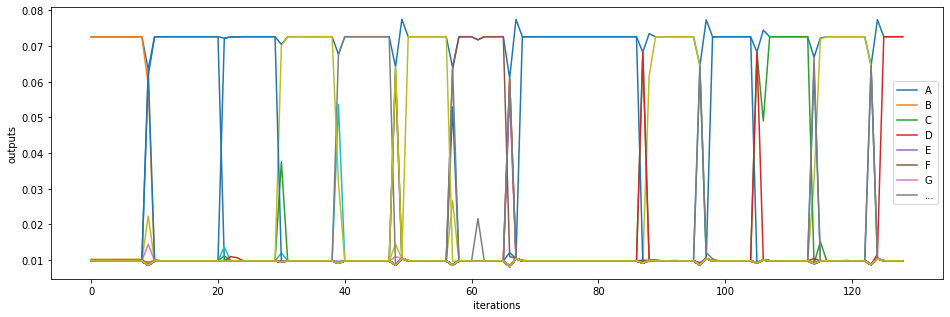

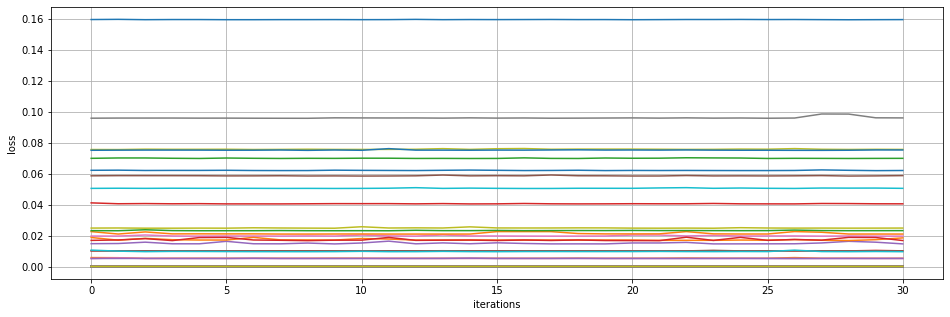

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 176
---------------
epoch 177
---------------
epoch 178
---------------
epoch 179
---------------
epoch 180
---------------
epoch 180
learning rate: 0.00065
sample 0
---------------
epoch 180
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59492684e-01]
 [9.57382010e-05]
 [9.57418773e-05]
 [9.57520423e-05]
 [9.57565316e-05]
 [9.57576777e-05]
 [9.57669297e-05]
 [9.57322349e-05]
 [9.57425094e-05]
 [9.57551809e-05]
 [9.57558869e-05]
 [9.57409384e-05]
 [

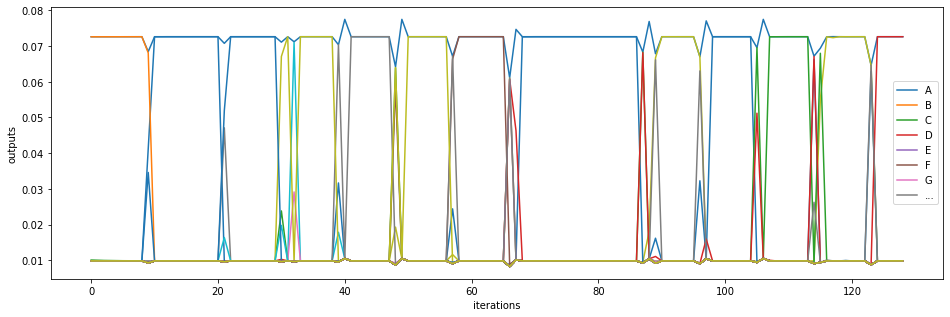

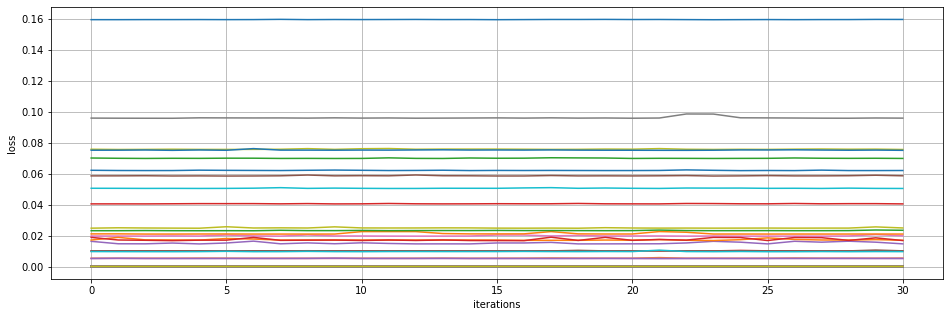

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 181
---------------
epoch 182
---------------
epoch 183
---------------
epoch 184
---------------
epoch 185
---------------
epoch 185
learning rate: 0.00065
sample 0
---------------
epoch 185
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59446419e-01]
 [9.58372930e-05]
 [9.58411959e-05]
 [9.58520501e-05]
 [9.58573542e-05]
 [9.58571057e-05]
 [9.58678158e-05]
 [9.58316946e-05]
 [9.58415895e-05]
 [9.58554273e-05]
 [9.58550278e-05]
 [9.58402253e-05]
 [

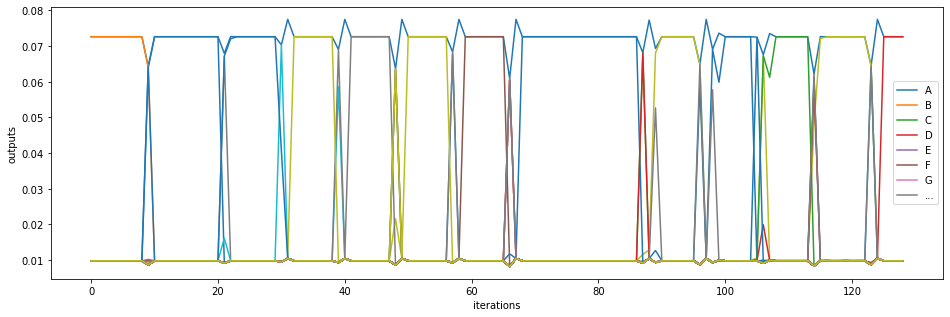

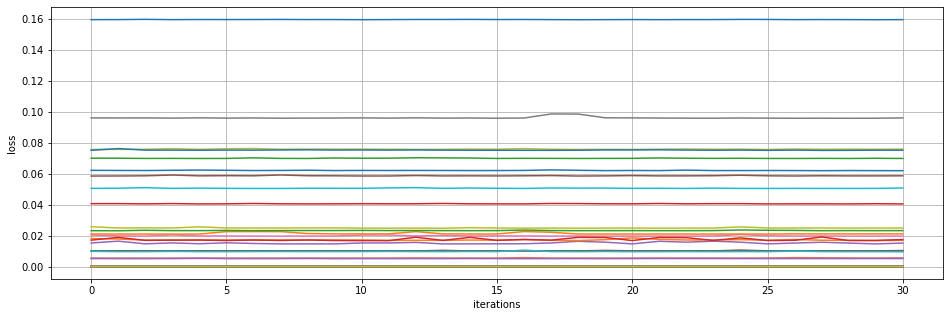

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 186
---------------
epoch 187
---------------
epoch 188
---------------
epoch 189
---------------
epoch 190
---------------
epoch 190
learning rate: 0.00065
sample 0
---------------
epoch 190
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59486981e-01]
 [9.63205123e-05]
 [9.63246303e-05]
 [9.63355508e-05]
 [9.63403207e-05]
 [9.63411454e-05]
 [9.63517609e-05]
 [9.63145843e-05]
 [9.63247942e-05]
 [9.63385521e-05]
 [9.63387527e-05]
 [9.63228374e-05]
 [

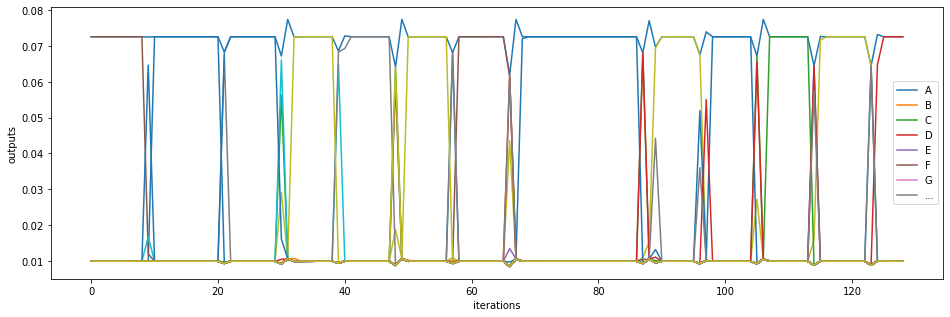

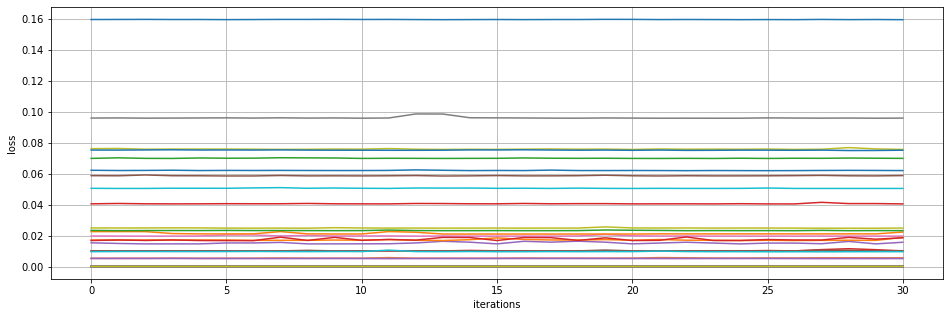

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 191
---------------
epoch 192
---------------
epoch 193
---------------
epoch 194
---------------
epoch 195
---------------
epoch 195
learning rate: 0.00065
sample 0
---------------
epoch 195
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59561256e-01]
 [9.54799743e-05]
 [9.54853972e-05]
 [9.54969144e-05]
 [9.55026160e-05]
 [9.55034152e-05]
 [9.55155673e-05]
 [9.54738206e-05]
 [9.54857628e-05]
 [9.54981488e-05]
 [9.55006892e-05]
 [9.54827208e-05]
 [

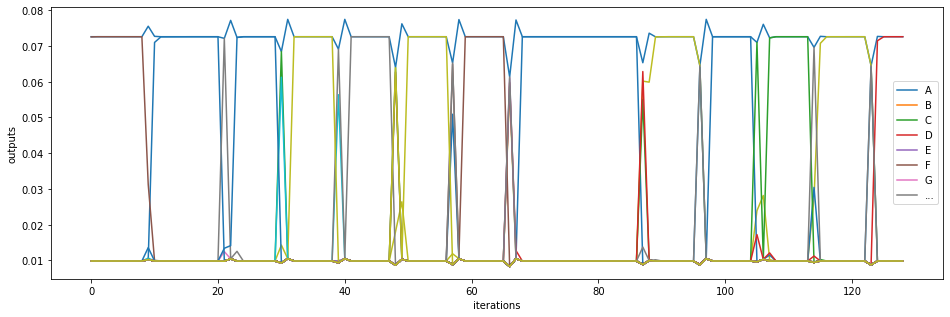

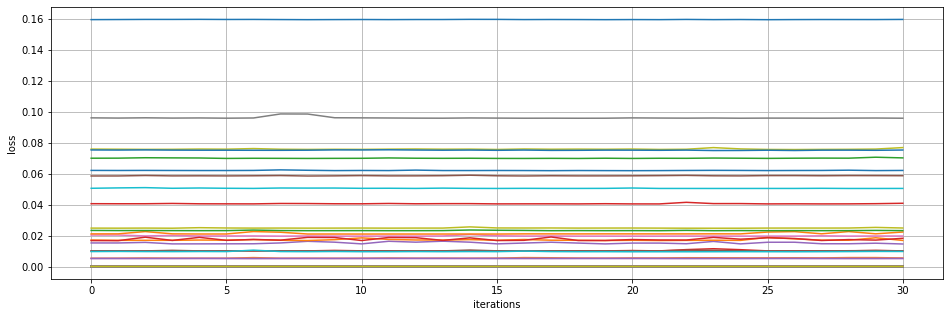

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 196
---------------
epoch 197
---------------
epoch 198
---------------
epoch 199
---------------
epoch 200
---------------
epoch 200
learning rate: 0.00065
sample 0
---------------
epoch 200
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59458475e-01]
 [9.62829146e-05]
 [9.62900762e-05]
 [9.63022177e-05]
 [9.62986058e-05]
 [9.63079871e-05]
 [9.63124286e-05]
 [9.62771332e-05]
 [9.62879024e-05]
 [9.62996061e-05]
 [9.62990496e-05]
 [9.62851095e-05]
 [

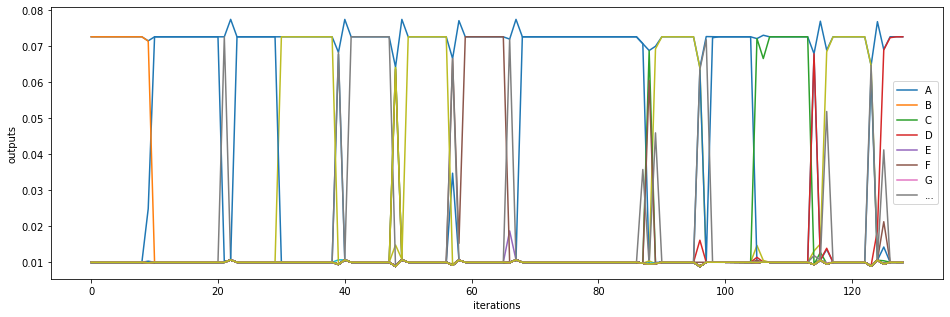

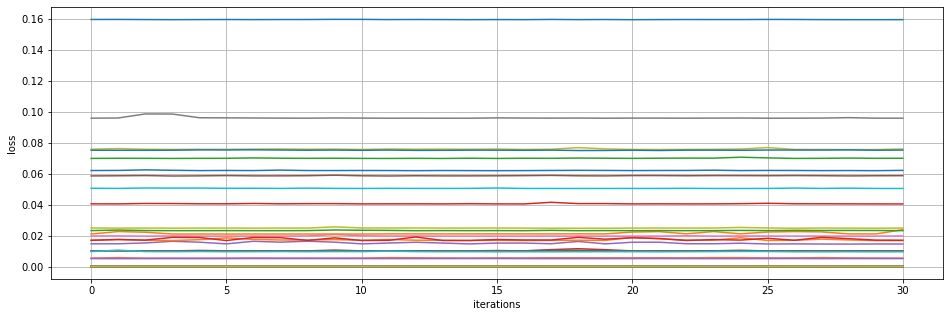

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 201
---------------
epoch 202
---------------
epoch 203
---------------
epoch 204
---------------
epoch 205
---------------
epoch 205
learning rate: 0.00065
sample 0
---------------
epoch 205
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59470511e-01]
 [9.57980224e-05]
 [9.58050277e-05]
 [9.58184076e-05]
 [9.58085841e-05]
 [9.58220312e-05]
 [9.58182072e-05]
 [9.57938806e-05]
 [9.58016927e-05]
 [9.58135848e-05]
 [9.58079738e-05]
 [9.57996043e-05]
 [

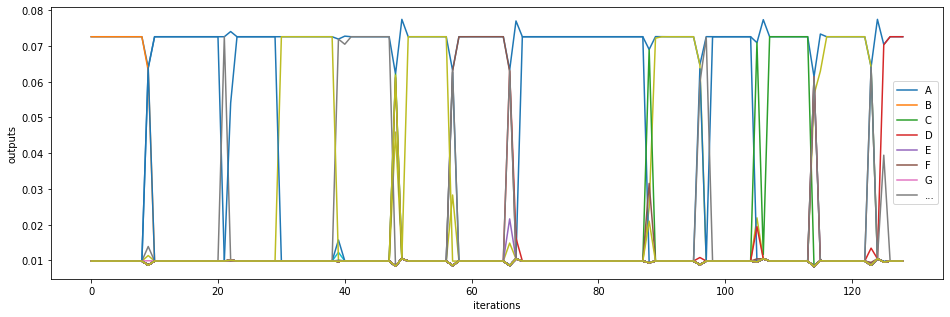

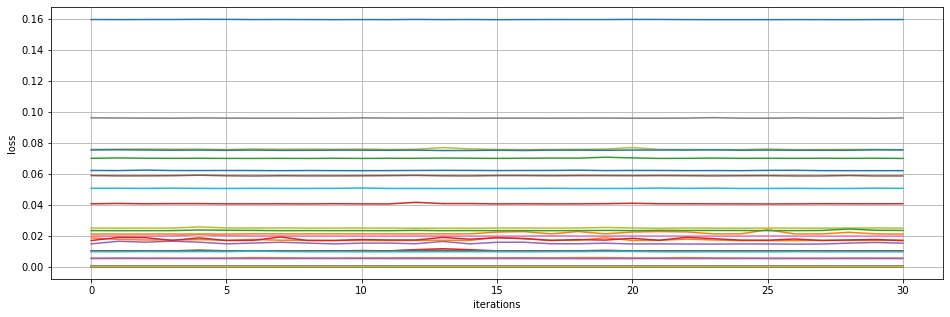

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 206
---------------
epoch 207
---------------
epoch 208
---------------
epoch 209
---------------
epoch 210
---------------
epoch 210
learning rate: 0.00065
sample 0
---------------
epoch 210
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59490496e-01]
 [9.59799895e-05]
 [9.59862391e-05]
 [9.59989387e-05]
 [9.59931094e-05]
 [9.60033155e-05]
 [9.60035715e-05]
 [9.59754723e-05]
 [9.59838208e-05]
 [9.59963165e-05]
 [9.59924703e-05]
 [9.59819448e-05]
 [

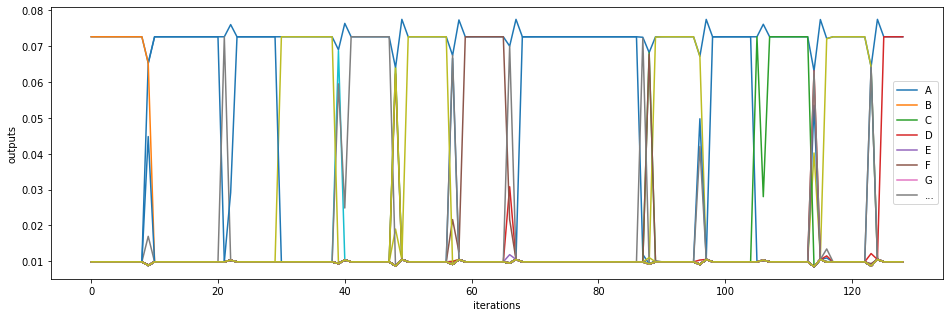

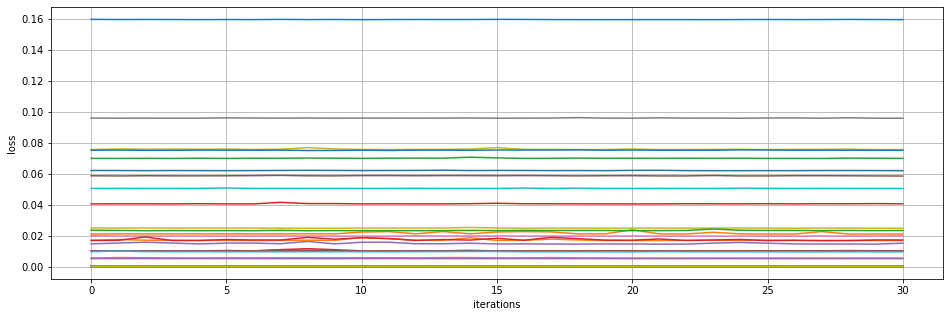

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 211
---------------
epoch 212
---------------
epoch 213
---------------
epoch 214
---------------
epoch 215
---------------
epoch 215
learning rate: 0.00065
sample 0
---------------
epoch 215
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59472255e-01]
 [9.66220005e-05]
 [9.66309152e-05]
 [9.66462184e-05]
 [9.66311195e-05]
 [9.66496645e-05]
 [9.66433027e-05]
 [9.66169743e-05]
 [9.66259892e-05]
 [9.66382969e-05]
 [9.66331267e-05]
 [9.66224577e-05]
 [

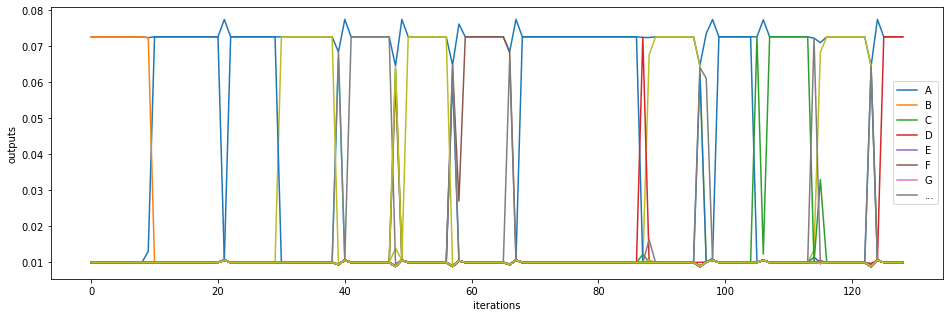

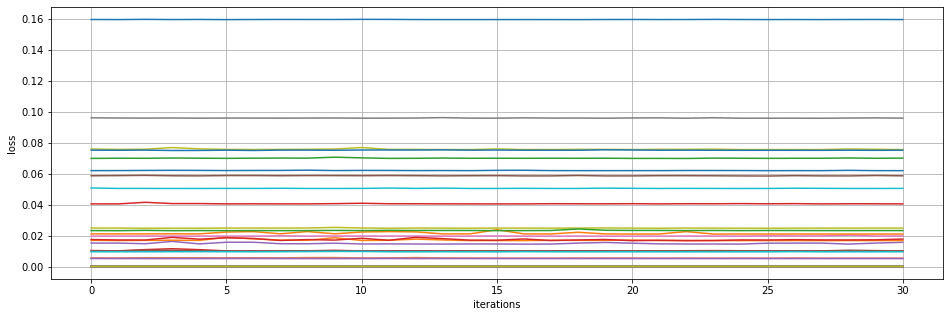

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 216
---------------
epoch 217
---------------
epoch 218
---------------
epoch 219
---------------
epoch 220
---------------
epoch 220
learning rate: 0.00065
sample 0
---------------
epoch 220
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59474372e-01]
 [9.62319636e-05]
 [9.62380698e-05]
 [9.62527718e-05]
 [9.62481756e-05]
 [9.62570894e-05]
 [9.62583127e-05]
 [9.62277146e-05]
 [9.62362861e-05]
 [9.62511663e-05]
 [9.62465867e-05]
 [9.62344265e-05]
 [

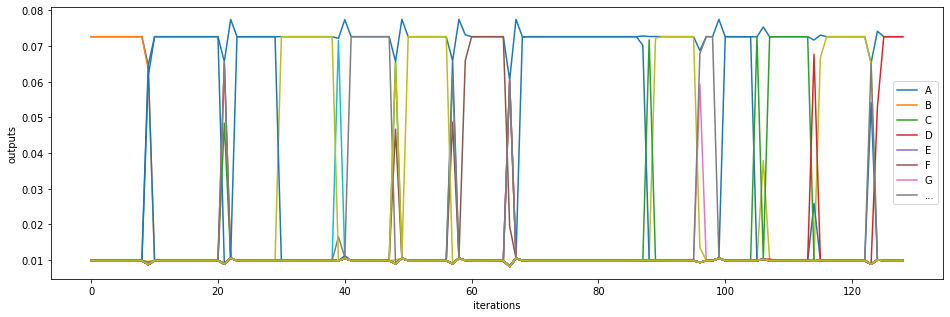

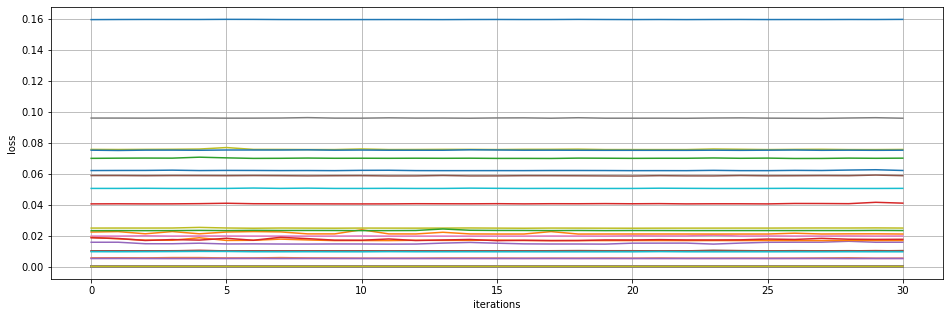

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 221
---------------
epoch 222
---------------
epoch 223
---------------
epoch 224
---------------
epoch 225
---------------
epoch 225
learning rate: 0.00065
sample 0
---------------
epoch 225
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59459260e-01]
 [9.63652720e-05]
 [9.63716887e-05]
 [9.63850041e-05]
 [9.63782659e-05]
 [9.63889965e-05]
 [9.63884399e-05]
 [9.63608833e-05]
 [9.63691439e-05]
 [9.63820216e-05]
 [9.63775852e-05]
 [9.63674287e-05]
 [

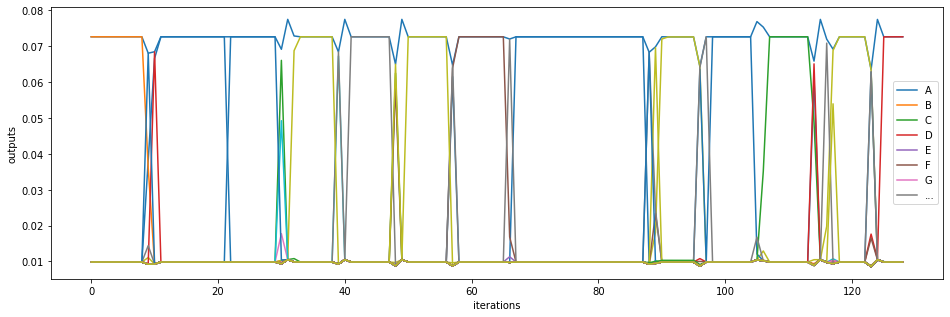

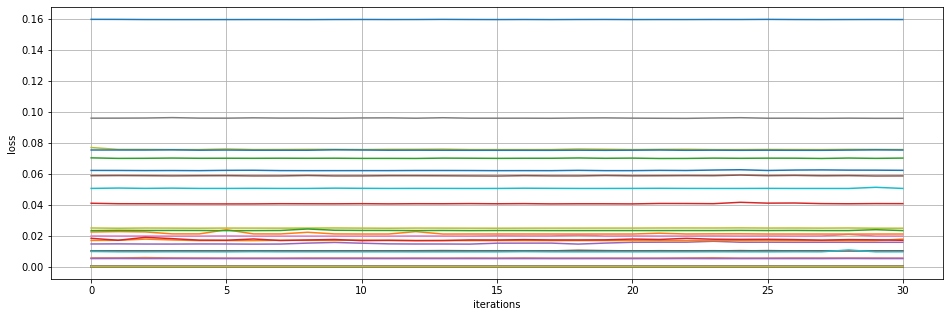

iiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
---------------
epoch 226
---------------
epoch 227
---------------
epoch 228
---------------
epoch 229
---------------
epoch 230
---------------
epoch 230
learning rate: 0.00065
sample 0
---------------
epoch 230
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59463802e-01]
 [9.61752215e-05]
 [9.61804265e-05]
 [9.61926768e-05]
 [9.61931020e-05]
 [9.61973892e-05]
 [9.62040963e-05]
 [9.61700769e-05]
 [9.61793383e-05]
 [9.61932502e-05]
 [9.61914222e-05]
 [9.61775886e-05]
 [

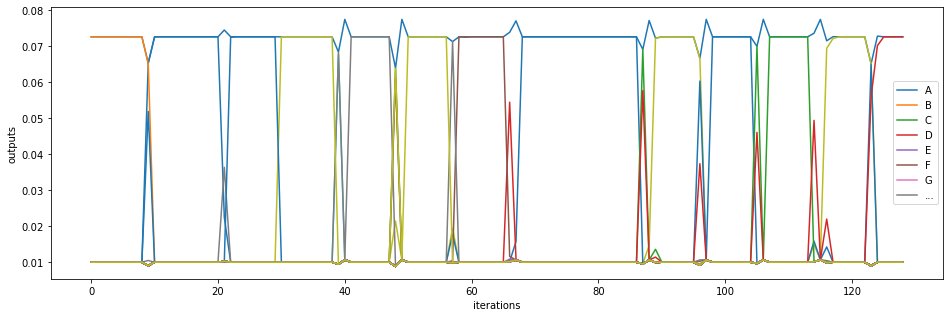

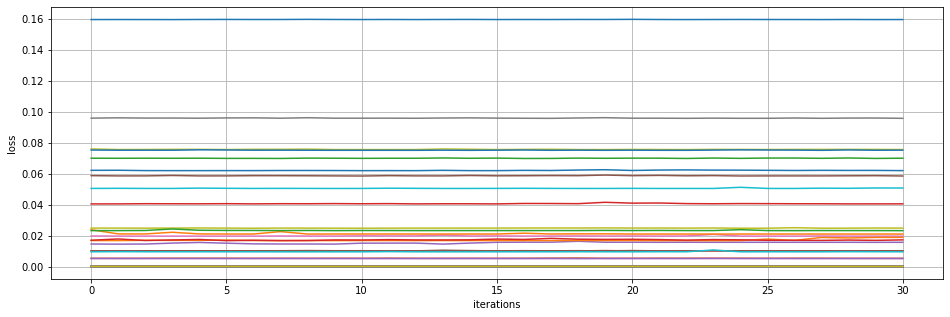

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 231
---------------
epoch 232
---------------
epoch 233
---------------
epoch 234
---------------
epoch 235
---------------
epoch 235
learning rate: 0.00065
sample 0
---------------
epoch 235
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59437572e-01]
 [9.58131285e-05]
 [9.58212071e-05]
 [9.58378217e-05]
 [9.58257058e-05]
 [9.58413910e-05]
 [9.58364473e-05]
 [9.58093651e-05]
 [9.58169514e-05]
 [9.58323737e-05]
 [9.58244203e-05]
 [9.58149068e-05]
 [

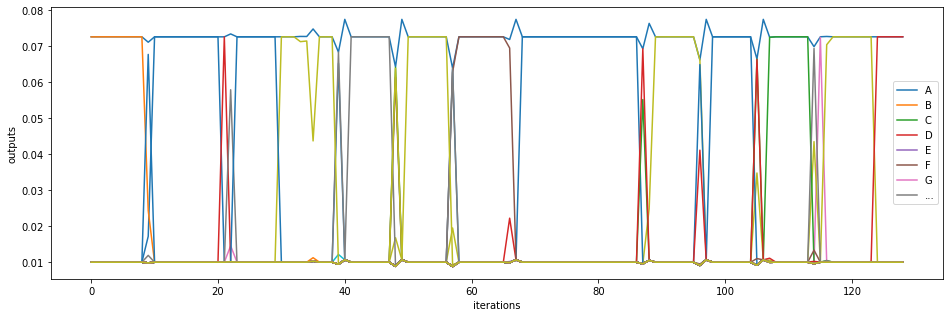

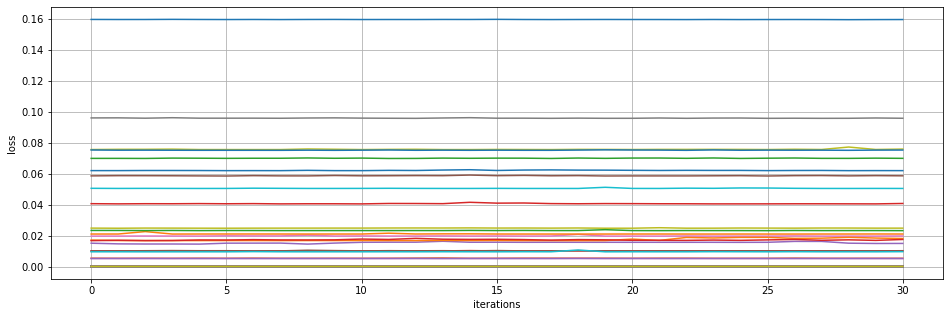

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 236
---------------
epoch 237
---------------
epoch 238
---------------
epoch 239
---------------
epoch 240
---------------
epoch 240
learning rate: 0.00065
sample 0
---------------
epoch 240
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59473515e-01]
 [9.62580181e-05]
 [9.62659292e-05]
 [9.62818206e-05]
 [9.62727148e-05]
 [9.62857208e-05]
 [9.62841791e-05]
 [9.62537359e-05]
 [9.62623955e-05]
 [9.62773296e-05]
 [9.62713476e-05]
 [9.62604758e-05]
 [

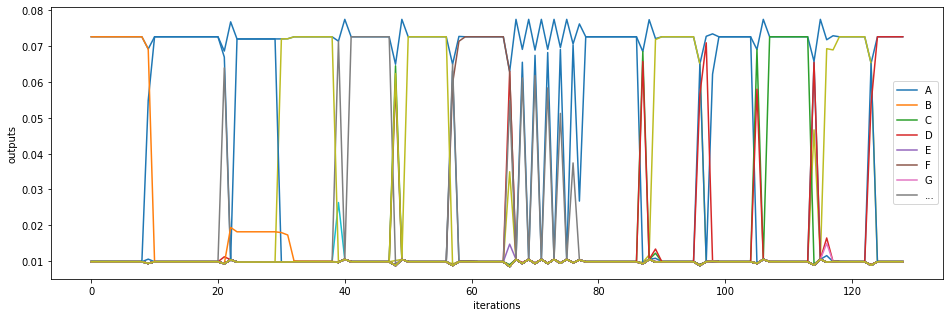

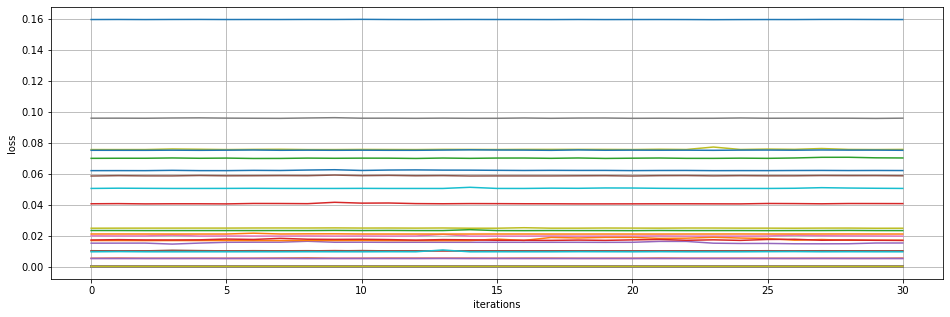

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                           
---------------
epoch 241
---------------
epoch 242
---------------
epoch 243
---------------
epoch 244
---------------
epoch 245
---------------
epoch 245
learning rate: 0.00065
sample 0
---------------
epoch 245
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59443103e-01]
 [9.63819279e-05]
 [9.63916427e-05]
 [9.64061934e-05]
 [9.63928313e-05]
 [9.64101079e-05]
 [9.64060520e-05]
 [9.63769566e-05]
 [9.63866110e-05]
 [9.63986448e-05]
 [9.63938928e-05]
 [9.63837319e-05]
 [

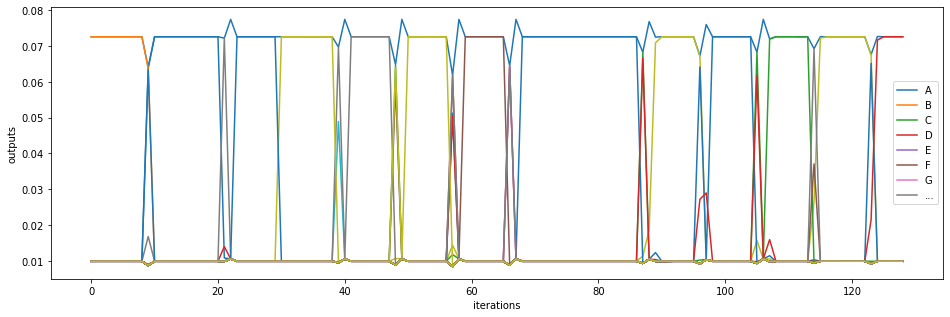

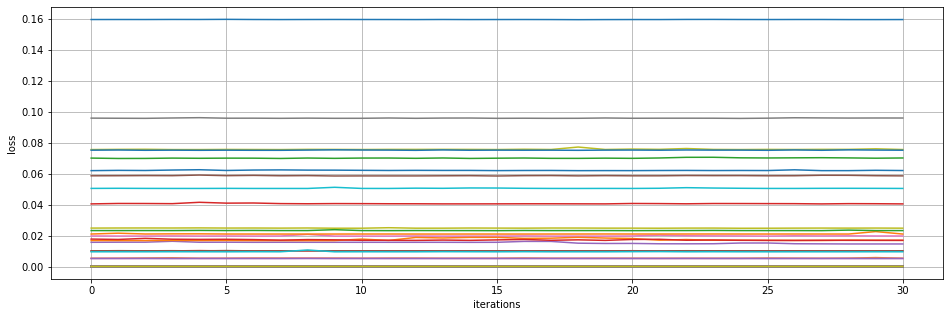

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 246
---------------
epoch 247
---------------
epoch 248
---------------
epoch 249
---------------
epoch 250
---------------
epoch 250
learning rate: 0.00065
sample 0
---------------
epoch 250
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59404653e-01]
 [9.63885144e-05]
 [9.63990693e-05]
 [9.64130043e-05]
 [9.63930894e-05]
 [9.64156161e-05]
 [9.64034866e-05]
 [9.63849392e-05]
 [9.63919659e-05]
 [9.64019175e-05]
 [9.63943495e-05]
 [9.63898412e-05]
 [

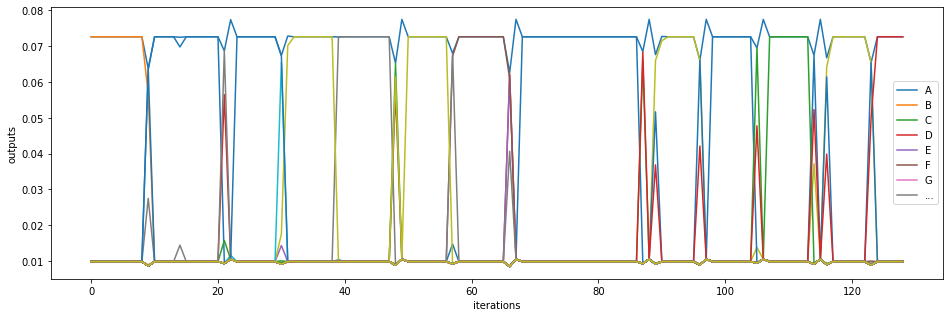

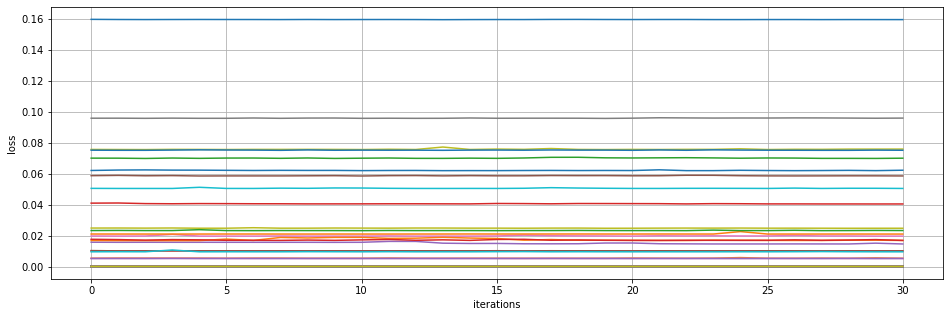

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 251
---------------
epoch 252
---------------
epoch 253
---------------
epoch 254
---------------
epoch 255
---------------
epoch 255
learning rate: 0.00065
sample 0
---------------
epoch 255
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59419057e-01]
 [9.64466912e-05]
 [9.64574374e-05]
 [9.64742035e-05]
 [9.64522662e-05]
 [9.64761073e-05]
 [9.64622377e-05]
 [9.64438468e-05]
 [9.64500795e-05]
 [9.64623508e-05]
 [9.64526989e-05]
 [9.64479582e-05]
 [

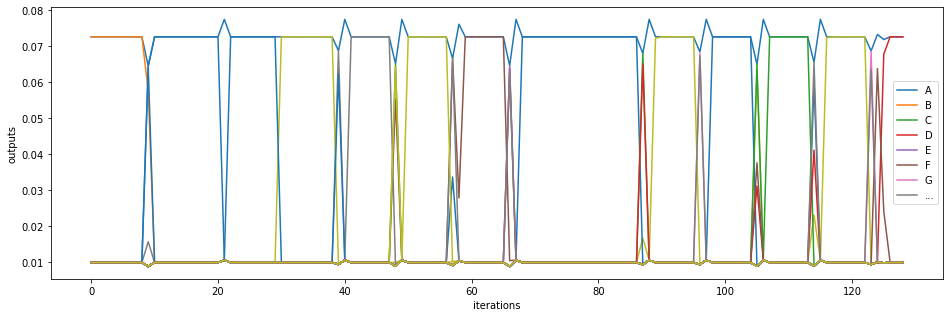

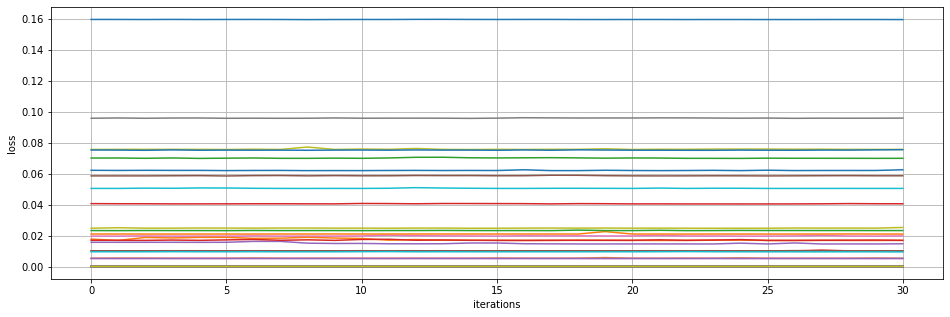

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 256
---------------
epoch 257
---------------
epoch 258
---------------
epoch 259
---------------
epoch 260
---------------
epoch 260
learning rate: 0.00065
sample 0
---------------
epoch 260
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59396442e-01]
 [9.64110480e-05]
 [9.64238299e-05]
 [9.64367274e-05]
 [9.64155832e-05]
 [9.64397346e-05]
 [9.64287841e-05]
 [9.64063914e-05]
 [9.64152048e-05]
 [9.64232107e-05]
 [9.64181488e-05]
 [9.64120294e-05]
 [

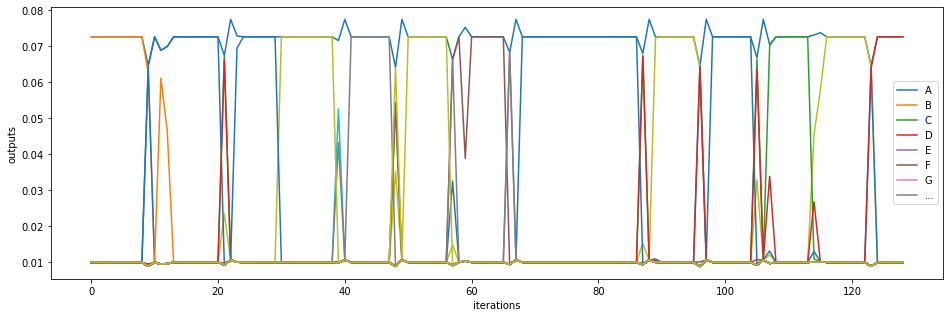

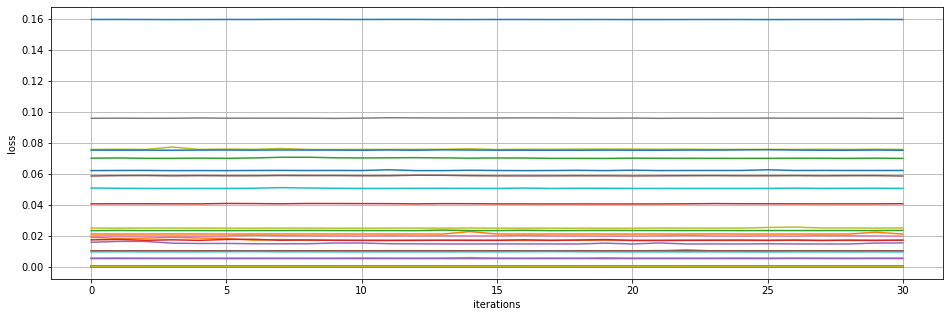

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 261
---------------
epoch 262
---------------
epoch 263
---------------
epoch 264
---------------
epoch 265
---------------
epoch 265
learning rate: 0.00065
sample 0
---------------
epoch 265
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59438088e-01]
 [9.60031961e-05]
 [9.60150144e-05]
 [9.60289091e-05]
 [9.60065884e-05]
 [9.60306185e-05]
 [9.60170634e-05]
 [9.59997626e-05]
 [9.60069042e-05]
 [9.60155663e-05]
 [9.60082350e-05]
 [9.60041935e-05]
 [

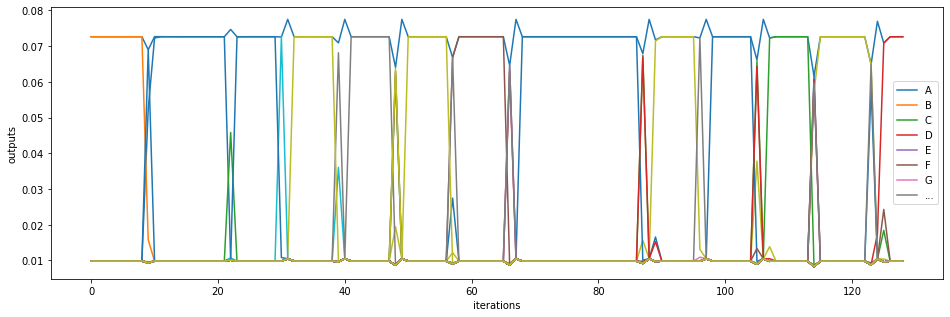

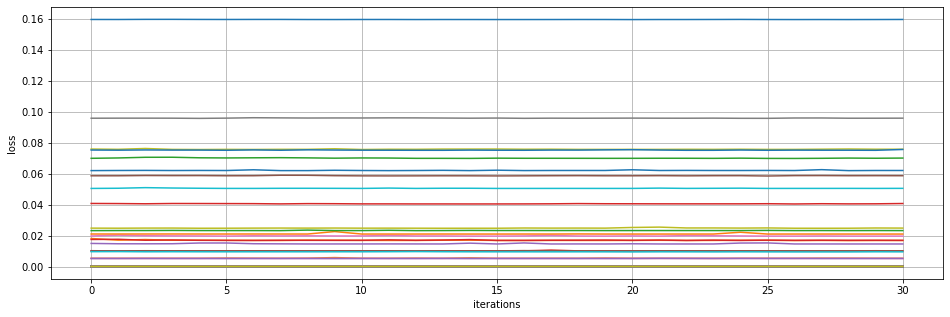

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 266
---------------
epoch 267
---------------
epoch 268
---------------
epoch 269
---------------
epoch 270
---------------
epoch 270
learning rate: 0.00065
sample 0
---------------
epoch 270
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59440534e-01]
 [9.62610746e-05]
 [9.62728347e-05]
 [9.62873353e-05]
 [9.62665332e-05]
 [9.62896668e-05]
 [9.62783686e-05]
 [9.62571765e-05]
 [9.62647982e-05]
 [9.62754125e-05]
 [9.62677001e-05]
 [9.62626549e-05]
 [

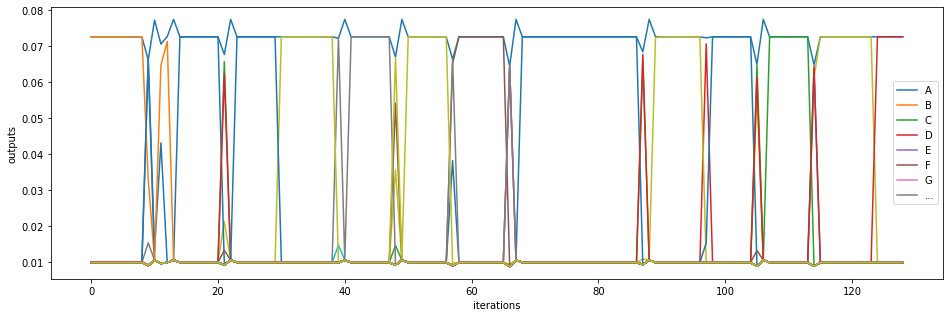

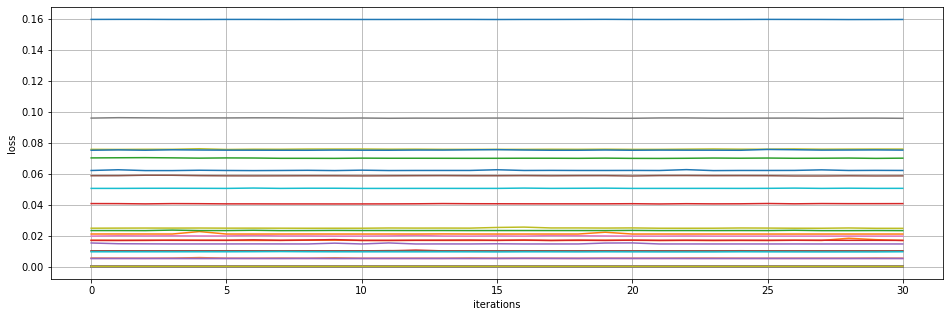

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 271
---------------
epoch 272
---------------
epoch 273
---------------
epoch 274
---------------
epoch 275
---------------
epoch 275
learning rate: 0.00065
sample 0
---------------
epoch 275
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59451297e-01]
 [9.65687824e-05]
 [9.65792550e-05]
 [9.65912790e-05]
 [9.65731749e-05]
 [9.65938445e-05]
 [9.65831536e-05]
 [9.65653893e-05]
 [9.65723630e-05]
 [9.65811023e-05]
 [9.65740251e-05]
 [9.65711360e-05]
 [

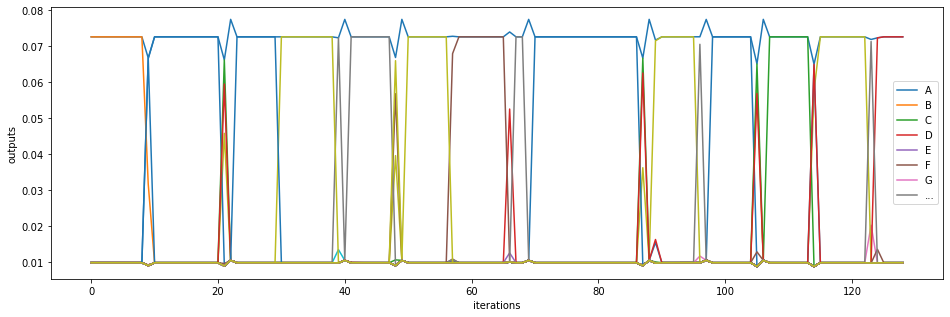

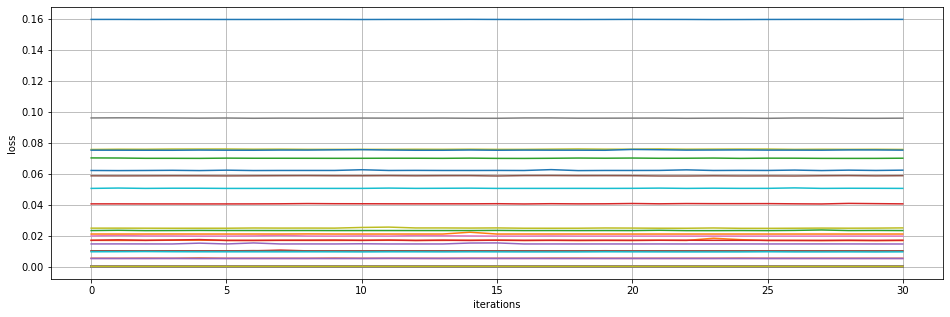

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 276
---------------
epoch 277
---------------
epoch 278
---------------
epoch 279
---------------
epoch 280
---------------
epoch 280
learning rate: 0.00065
sample 0
---------------
epoch 280
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59424121e-01]
 [9.64420222e-05]
 [9.64544401e-05]
 [9.64669500e-05]
 [9.64455830e-05]
 [9.64701591e-05]
 [9.64575848e-05]
 [9.64380406e-05]
 [9.64458198e-05]
 [9.64540656e-05]
 [9.64473570e-05]
 [9.64432754e-05]
 [

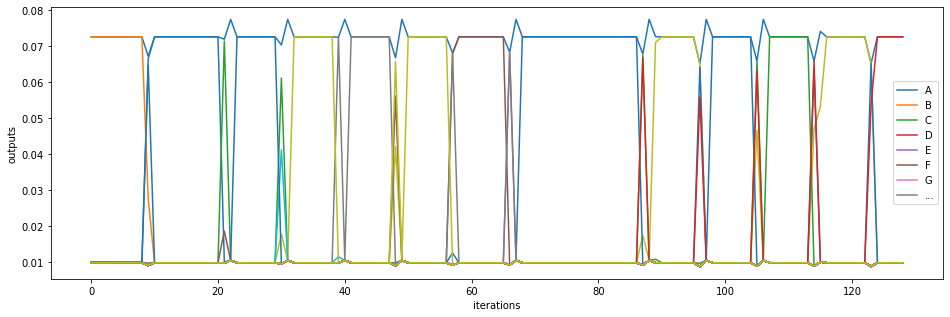

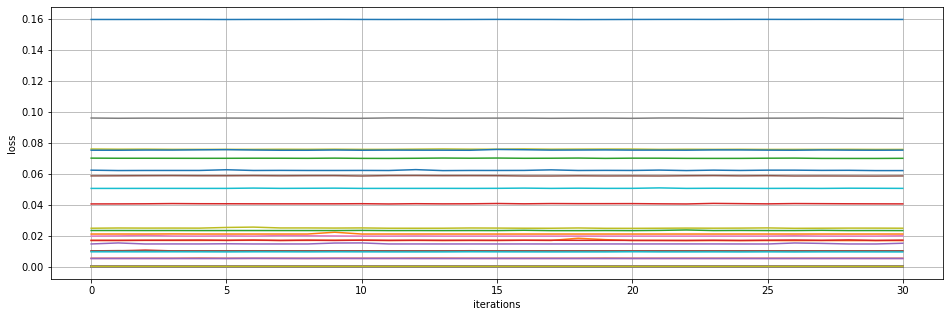

i                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   
---------------
epoch 281
---------------
epoch 282
---------------
epoch 283
---------------
epoch 284
---------------
epoch 285
---------------
epoch 285
learning rate: 0.00065
sample 0
---------------
epoch 285
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59474611e-01]
 [9.64458973e-05]
 [9.64555776e-05]
 [9.64711534e-05]
 [9.64512663e-05]
 [9.64719559e-05]
 [9.64587756e-05]
 [9.64443011e-05]
 [9.64493936e-05]
 [9.64598981e-05]
 [9.64508662e-05]
 [9.64484681e-05]
 [

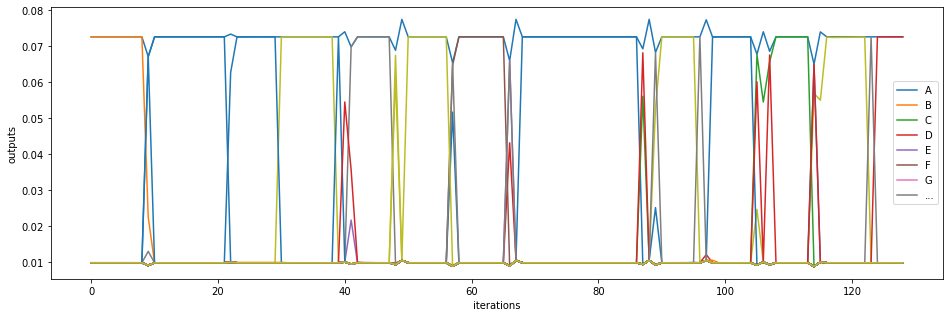

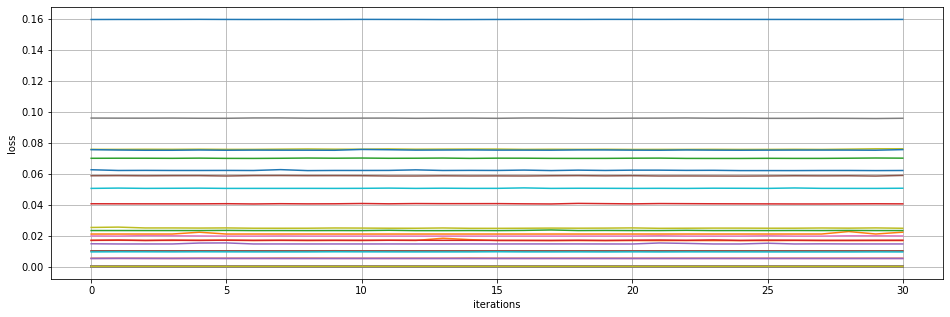

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 286
---------------
epoch 287
---------------
epoch 288
---------------
epoch 289
---------------
epoch 290
---------------
epoch 290
learning rate: 0.00065
sample 0
---------------
epoch 290
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59404337e-01]
 [9.65406694e-05]
 [9.65491812e-05]
 [9.65610678e-05]
 [9.65493746e-05]
 [9.65644398e-05]
 [9.65602012e-05]
 [9.65365019e-05]
 [9.65444693e-05]
 [9.65548522e-05]
 [9.65495788e-05]
 [9.65434338e-05]
 [

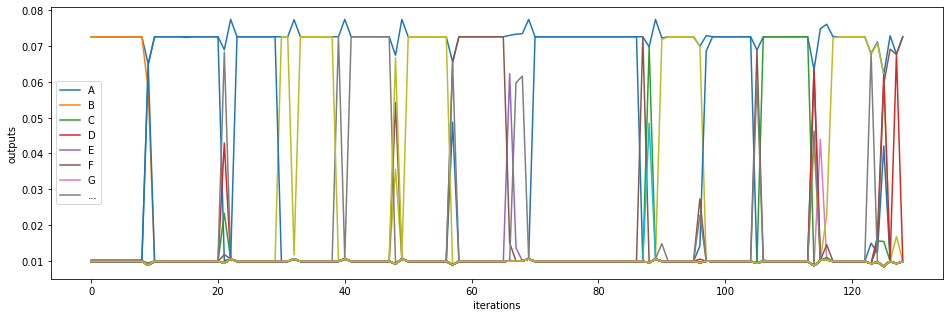

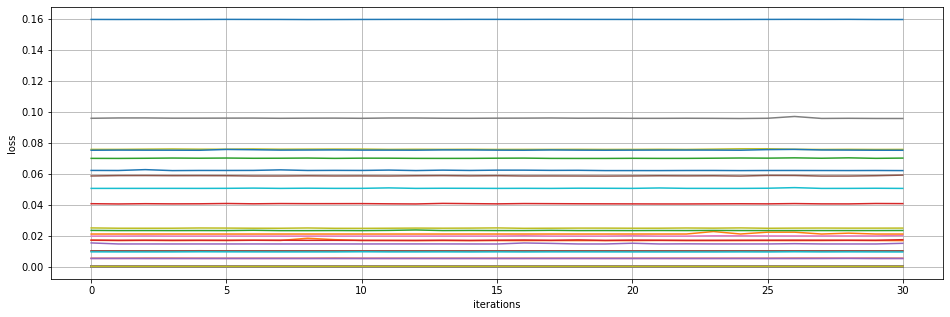

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 291
---------------
epoch 292
---------------
epoch 293
---------------
epoch 294
---------------
epoch 295
---------------
epoch 295
learning rate: 0.00065
sample 0
---------------
epoch 295
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59414309e-01]
 [9.66050497e-05]
 [9.66149114e-05]
 [9.66253904e-05]
 [9.66082447e-05]
 [9.66279234e-05]
 [9.66183006e-05]
 [9.66008479e-05]
 [9.66081096e-05]
 [9.66161090e-05]
 [9.66099637e-05]
 [9.66067461e-05]
 [

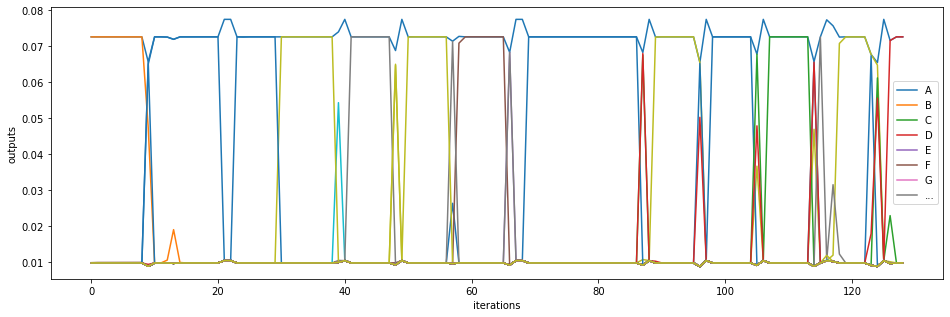

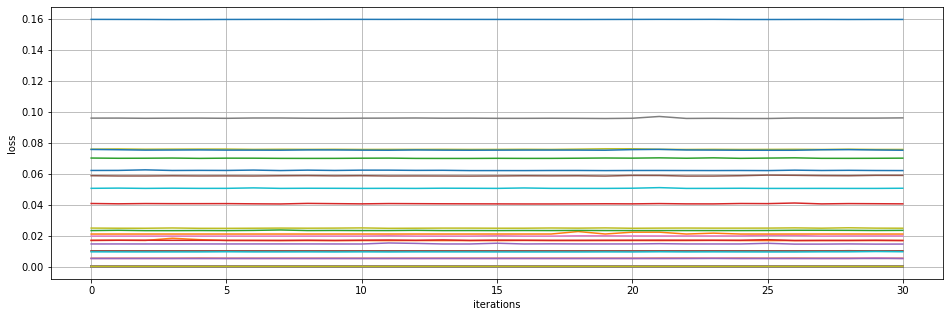

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                             
---------------
epoch 296
---------------
epoch 297
---------------
epoch 298
---------------
epoch 299
---------------
epoch 300
---------------
epoch 300
learning rate: 0.00065
sample 0
---------------
epoch 300
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59423268e-01]
 [9.67551573e-05]
 [9.67653591e-05]
 [9.67769592e-05]
 [9.67594455e-05]
 [9.67794402e-05]
 [9.67700203e-05]
 [9.67510058e-05]
 [9.67583550e-05]
 [9.67672711e-05]
 [9.67609426e-05]
 [9.67569769e-05]
 [

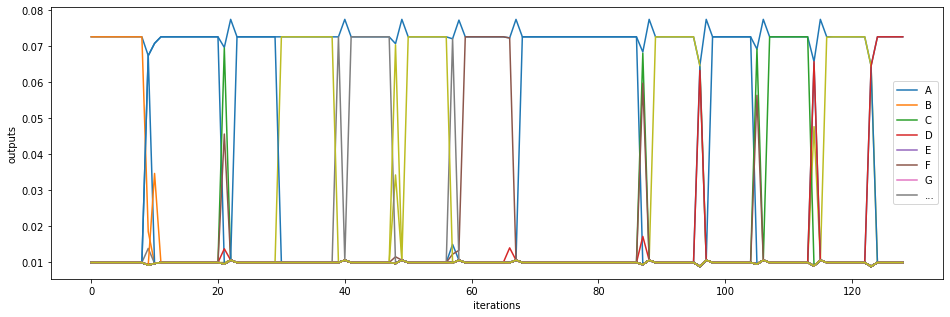

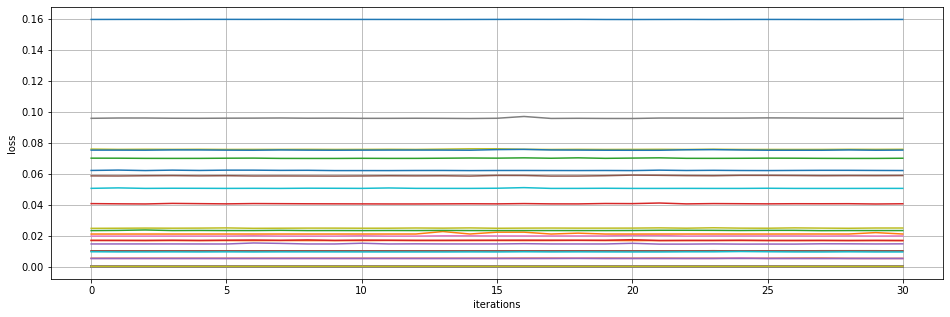

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                          
---------------
epoch 301
---------------
epoch 302
---------------
epoch 303
---------------
epoch 304
---------------
epoch 305
---------------
epoch 305
learning rate: 0.00065
sample 0
---------------
epoch 305
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59386732e-01]
 [9.66596331e-05]
 [9.66692895e-05]
 [9.66778198e-05]
 [9.66666146e-05]
 [9.66818753e-05]
 [9.66804530e-05]
 [9.66537635e-05]
 [9.66634424e-05]
 [9.66714134e-05]
 [9.66688002e-05]
 [9.66617539e-05]
 [

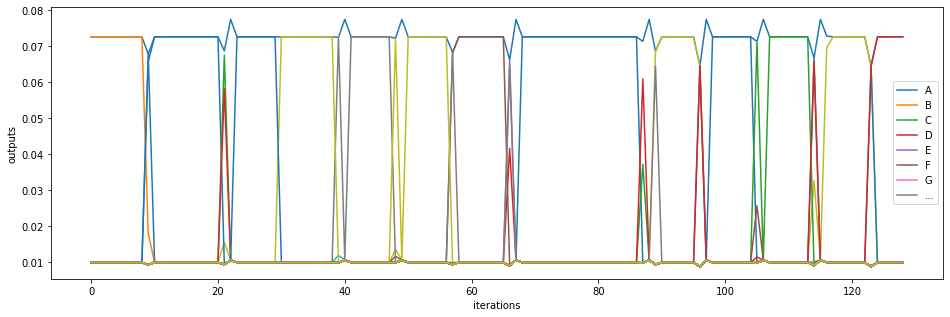

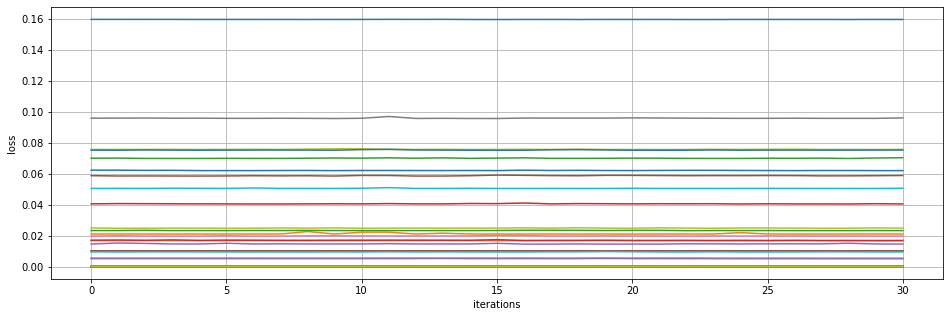

                                                                                                                                                                                                                                                                                                                         kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk
---------------
epoch 306
---------------
epoch 307
---------------
epoch 308
---------------
epoch 309
---------------
epoch 310
---------------
epoch 310
learning rate: 0.00065
sample 0
---------------
epoch 310
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59447308e-01]
 [9.67195706e-05]
 [9.67288965e-05]
 [9.67390457e-05]
 [9.67247551e-05]
 [9.67415941e-05]
 [9.67345919e-05]
 [9.67156678e-05]
 [9.67230635e-05]
 [9.67309891e-05]
 [9.67257696e-05]
 [9.67224784e-05]
 [

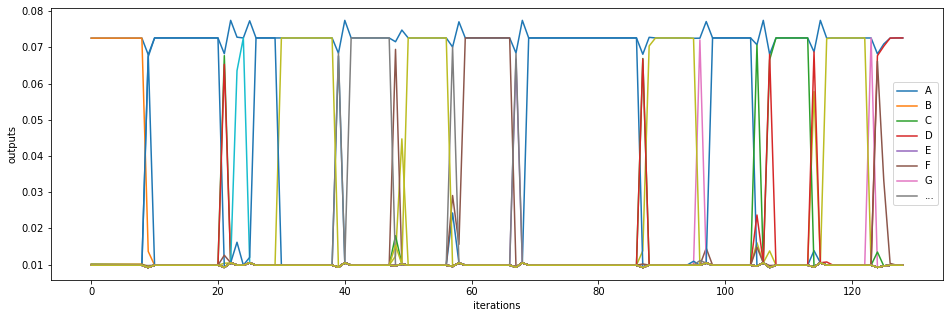

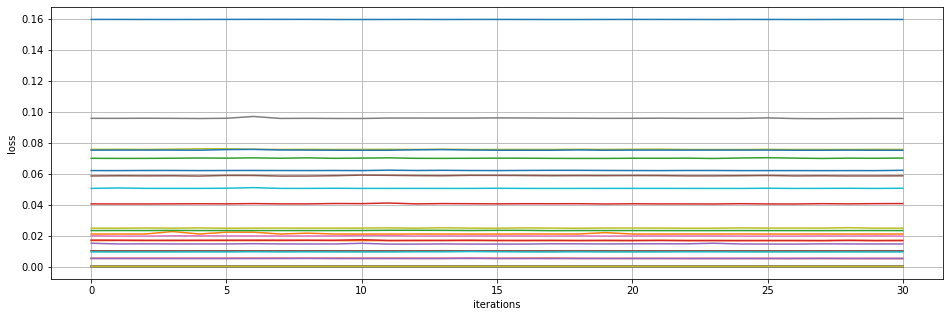

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 311
---------------
epoch 312
---------------
epoch 313
---------------
epoch 314
---------------
epoch 315
---------------
epoch 315
learning rate: 0.00065
sample 0
---------------
epoch 315
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59386008e-01]
 [9.66169850e-05]
 [9.66287164e-05]
 [9.66373111e-05]
 [9.66186296e-05]
 [9.66408217e-05]
 [9.66315280e-05]
 [9.66113020e-05]
 [9.66205578e-05]
 [9.66268255e-05]
 [9.66219492e-05]
 [9.66170576e-05]
 [

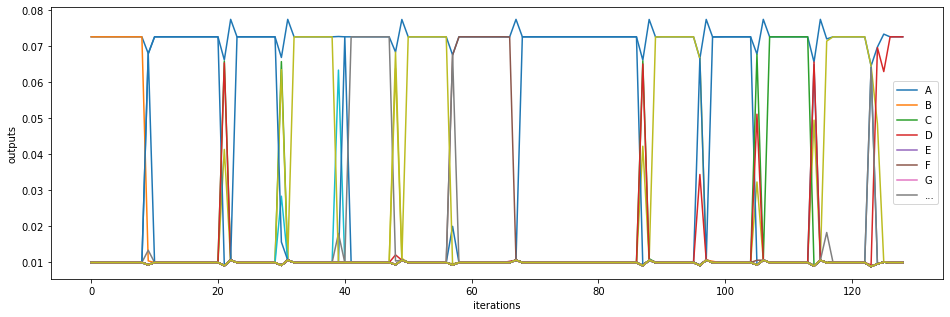

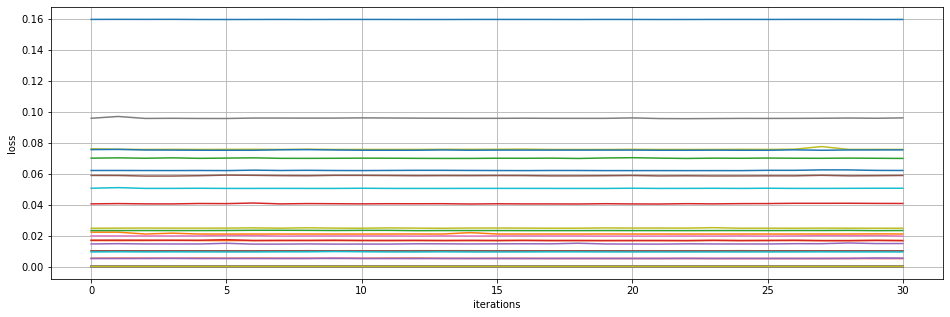

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 316
---------------
epoch 317
---------------
epoch 318
---------------
epoch 319
---------------
epoch 320
---------------
epoch 320
learning rate: 0.00065
sample 0
---------------
epoch 320
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59525540e-01]
 [9.66683461e-05]
 [9.66801419e-05]
 [9.66887652e-05]
 [9.66710698e-05]
 [9.66926412e-05]
 [9.66843926e-05]
 [9.66627358e-05]
 [9.66718013e-05]
 [9.66782689e-05]
 [9.66742443e-05]
 [9.66691408e-05]
 [

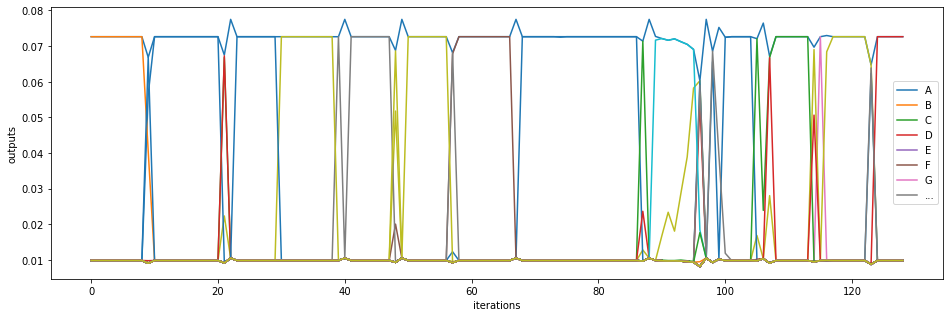

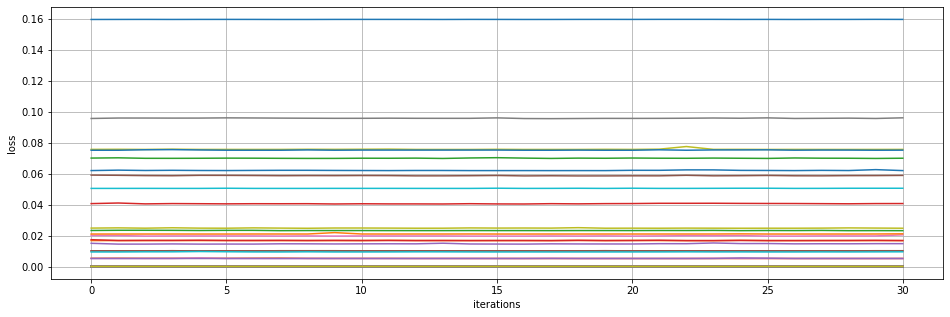

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                            
---------------
epoch 321
---------------
epoch 322
---------------
epoch 323
---------------
epoch 324
---------------
epoch 325
---------------
epoch 325
learning rate: 0.00065
sample 0
---------------
epoch 325
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59491313e-01]
 [9.66293744e-05]
 [9.66409204e-05]
 [9.66539952e-05]
 [9.66329205e-05]
 [9.66564300e-05]
 [9.66442402e-05]
 [9.66252615e-05]
 [9.66324750e-05]
 [9.66424140e-05]
 [9.66345829e-05]
 [9.66301771e-05]
 [

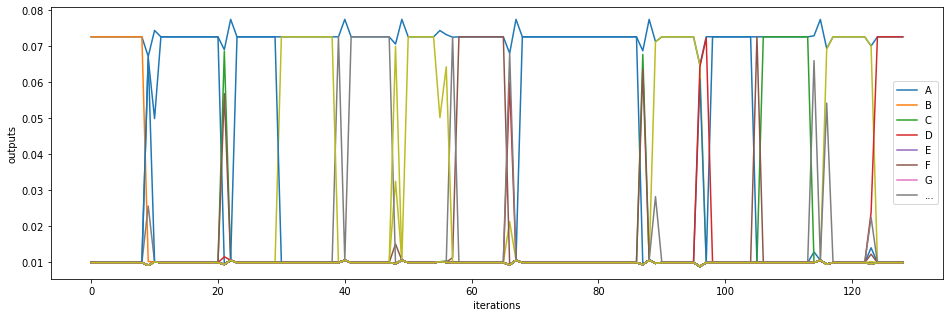

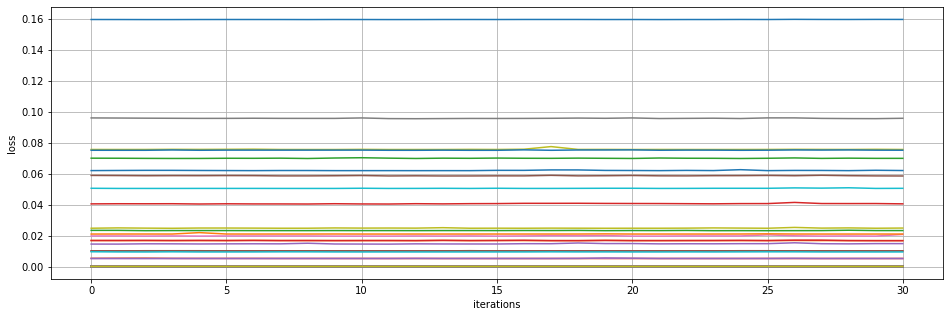

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 326
---------------
epoch 327
---------------
epoch 328
---------------
epoch 329
---------------
epoch 330
---------------
epoch 330
learning rate: 0.00065
sample 0
---------------
epoch 330
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59444481e-01]
 [9.67094586e-05]
 [9.67214096e-05]
 [9.67354649e-05]
 [9.67125202e-05]
 [9.67368053e-05]
 [9.67241863e-05]
 [9.67049129e-05]
 [9.67127188e-05]
 [9.67222570e-05]
 [9.67151454e-05]
 [9.67089208e-05]
 [

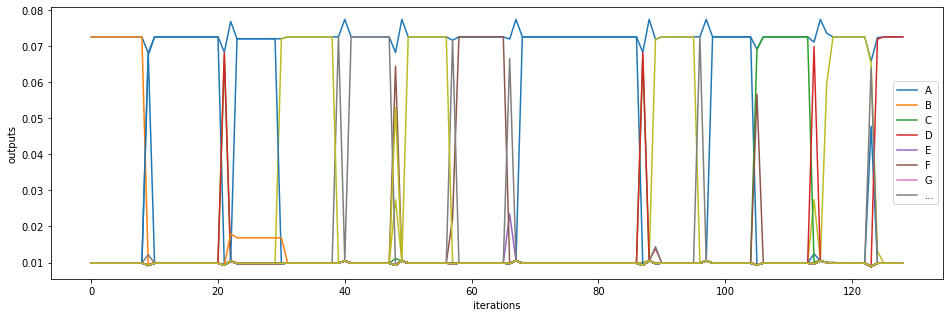

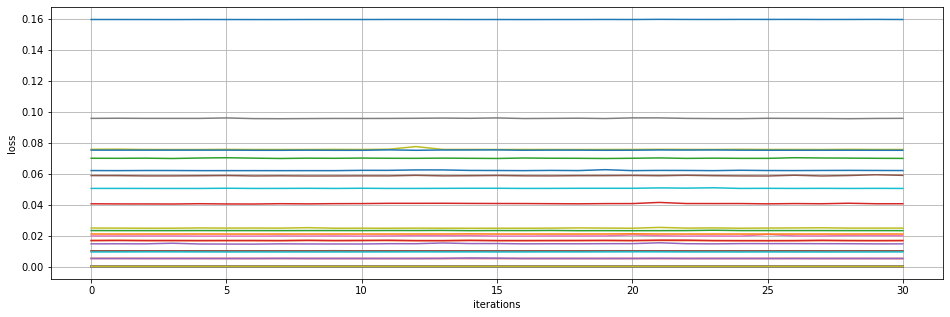

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 331
---------------
epoch 332
---------------
epoch 333
---------------
epoch 334
---------------
epoch 335
---------------
epoch 335
learning rate: 0.00065
sample 0
---------------
epoch 335
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59449262e-01]
 [9.67182599e-05]
 [9.67290170e-05]
 [9.67471441e-05]
 [9.67245997e-05]
 [9.67480006e-05]
 [9.67340783e-05]
 [9.67157716e-05]
 [9.67214767e-05]
 [9.67354104e-05]
 [9.67244336e-05]
 [9.67195234e-05]
 [

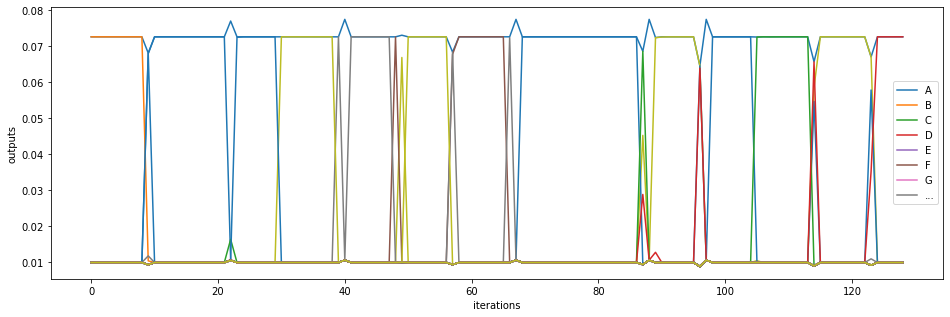

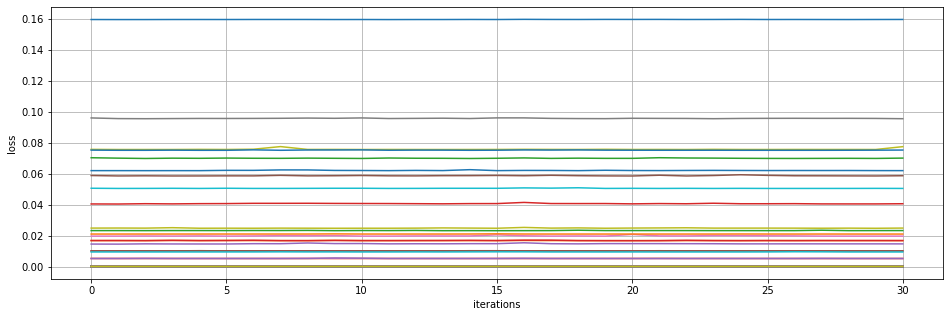

ii                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
---------------
epoch 336
---------------
epoch 337
---------------
epoch 338
---------------
epoch 339
---------------
epoch 340
---------------
epoch 340
learning rate: 0.00065
sample 0
---------------
epoch 340
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59370813e-01]
 [9.68333832e-05]
 [9.68449274e-05]
 [9.68644330e-05]
 [9.68399719e-05]
 [9.68651007e-05]
 [9.68506581e-05]
 [9.68304484e-05]
 [9.68366971e-05]
 [9.68509341e-05]
 [9.68403983e-05]
 [9.68338227e-05]
 [

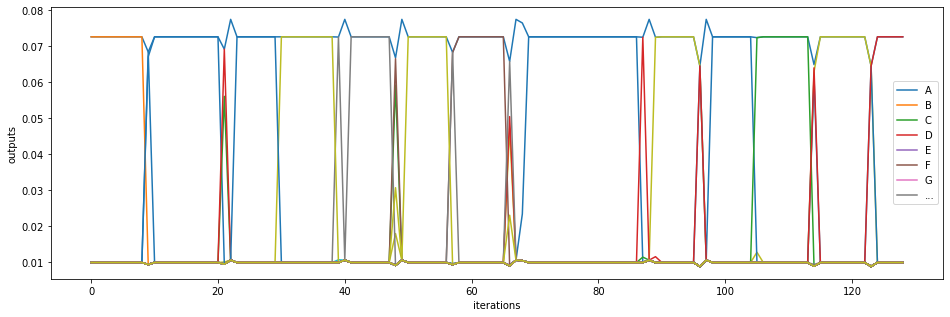

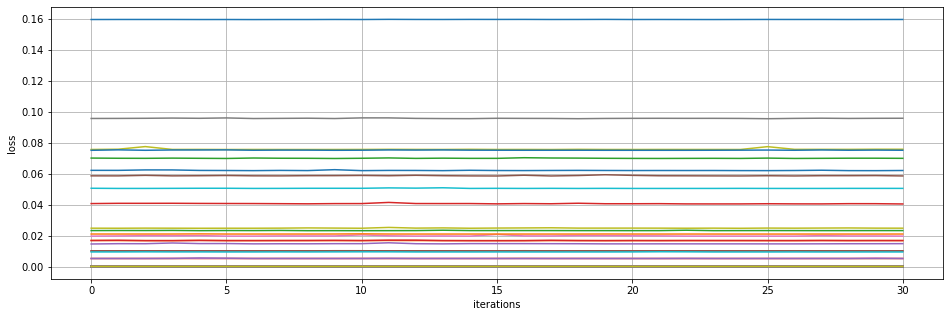

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                                                
---------------
epoch 341
---------------
epoch 342
---------------
epoch 343
---------------
epoch 344
---------------
epoch 345
---------------
epoch 345
learning rate: 0.00065
sample 0
---------------
epoch 345
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59426043e-01]
 [9.68705806e-05]
 [9.68804868e-05]
 [9.68976217e-05]
 [9.68809865e-05]
 [9.69006793e-05]
 [9.68924935e-05]
 [9.68670669e-05]
 [9.68743087e-05]
 [9.68893563e-05]
 [9.68802287e-05]
 [9.68721029e-05]
 [

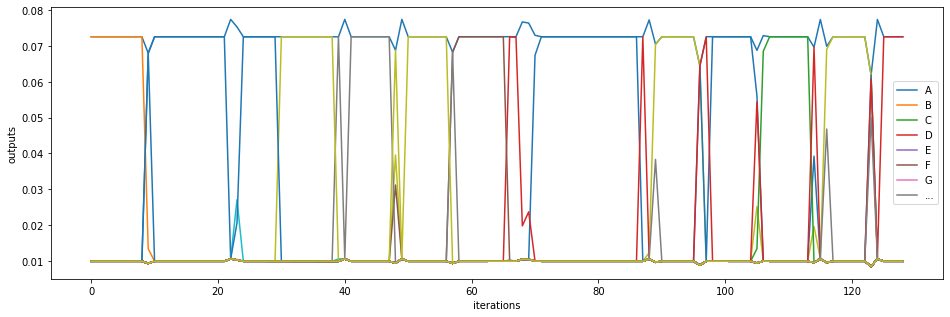

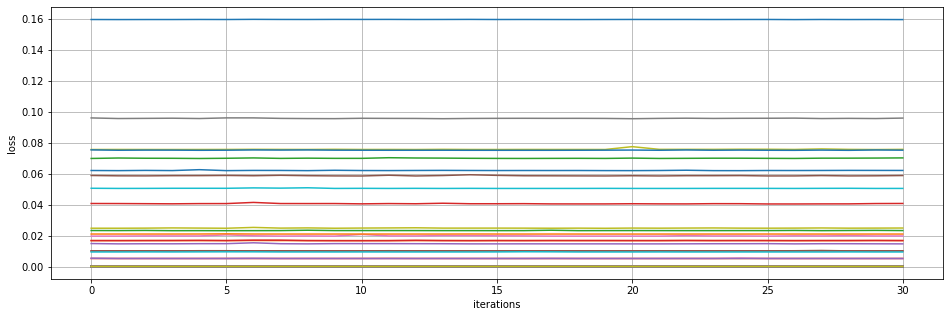

iiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
---------------
epoch 346
---------------
epoch 347
---------------
epoch 348
---------------
epoch 349
---------------
epoch 350
---------------
epoch 350
learning rate: 0.00065
sample 0
---------------
epoch 350
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59379010e-01]
 [9.69841703e-05]
 [9.69950014e-05]
 [9.70118880e-05]
 [9.69916202e-05]
 [9.70141059e-05]
 [9.70027308e-05]
 [9.69808559e-05]
 [9.69876678e-05]
 [9.70014767e-05]
 [9.69916604e-05]
 [9.69855111e-05]
 [

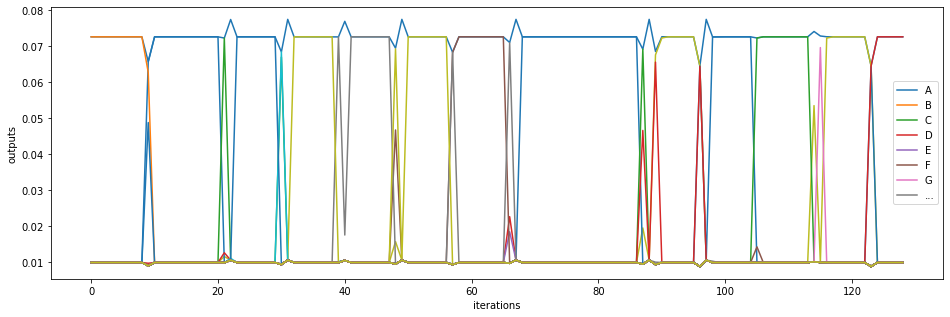

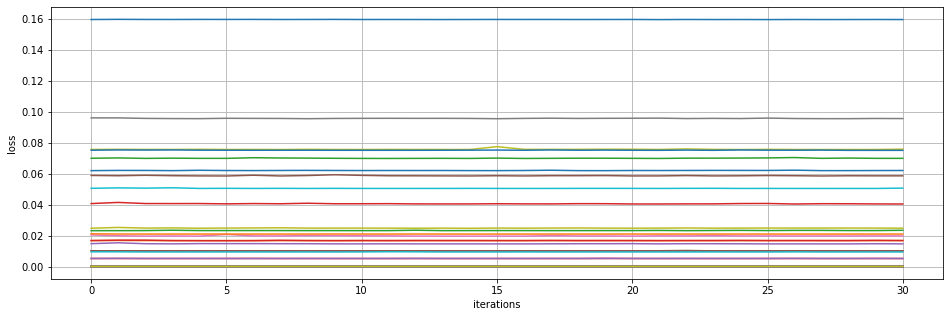

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 351
---------------
epoch 352
---------------
epoch 353
---------------
epoch 354
---------------
epoch 355
---------------
epoch 355
learning rate: 0.00065
sample 0
---------------
epoch 355
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59432766e-01]
 [9.68932586e-05]
 [9.69051833e-05]
 [9.69204947e-05]
 [9.68996327e-05]
 [9.69222733e-05]
 [9.69119379e-05]
 [9.68891149e-05]
 [9.68970779e-05]
 [9.69099670e-05]
 [9.69005148e-05]
 [9.68946334e-05]
 [

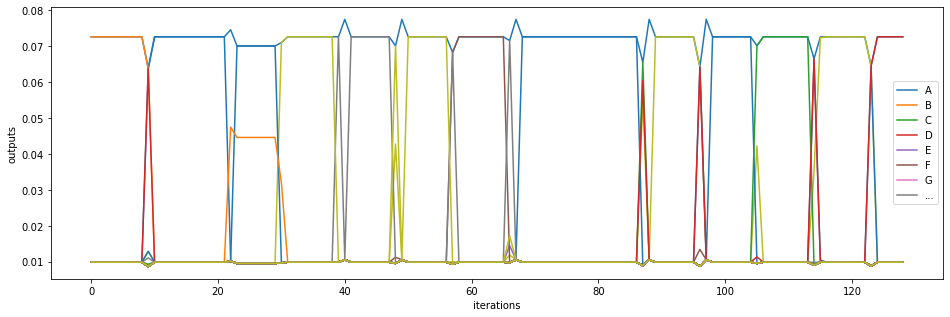

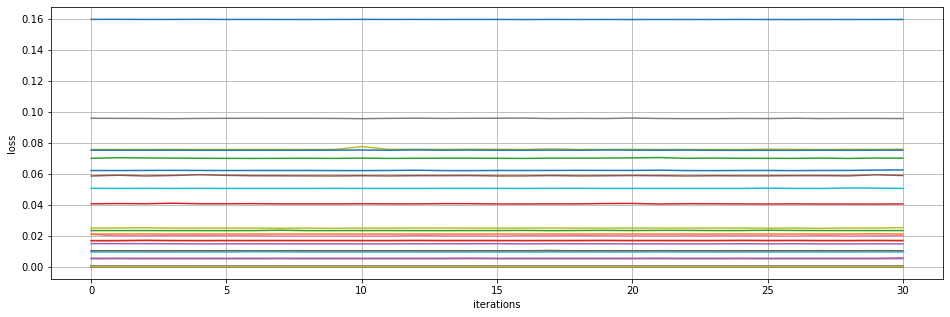

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 356
---------------
epoch 357
---------------
epoch 358
---------------
epoch 359
---------------
epoch 360
---------------
epoch 360
learning rate: 0.00065
sample 0
---------------
epoch 360
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59427977e-01]
 [9.69049363e-05]
 [9.69149575e-05]
 [9.69315437e-05]
 [9.69106190e-05]
 [9.69327693e-05]
 [9.69190365e-05]
 [9.69027894e-05]
 [9.69078398e-05]
 [9.69210277e-05]
 [9.69102175e-05]
 [9.69068434e-05]
 [

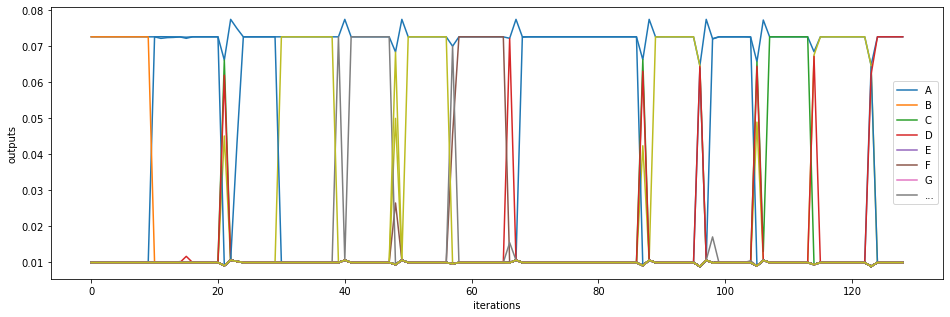

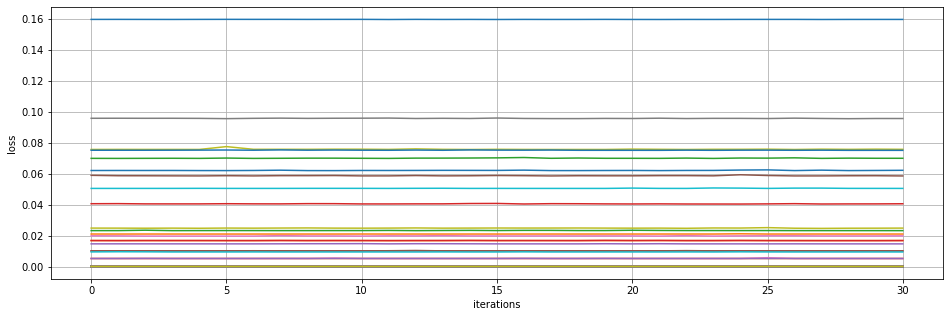

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 361
---------------
epoch 362
---------------
epoch 363
---------------
epoch 364
---------------
epoch 365
---------------
epoch 365
learning rate: 0.00065
sample 0
---------------
epoch 365
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59408085e-01]
 [9.70175526e-05]
 [9.70284577e-05]
 [9.70442509e-05]
 [9.70227688e-05]
 [9.70461145e-05]
 [9.70325894e-05]
 [9.70146998e-05]
 [9.70205130e-05]
 [9.70331840e-05]
 [9.70229764e-05]
 [9.70190974e-05]
 [

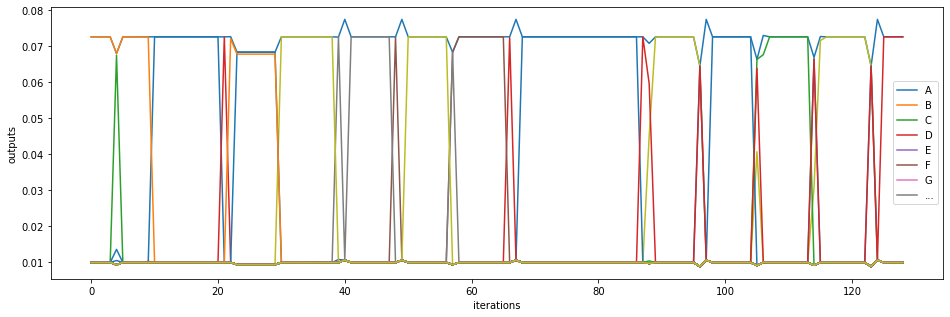

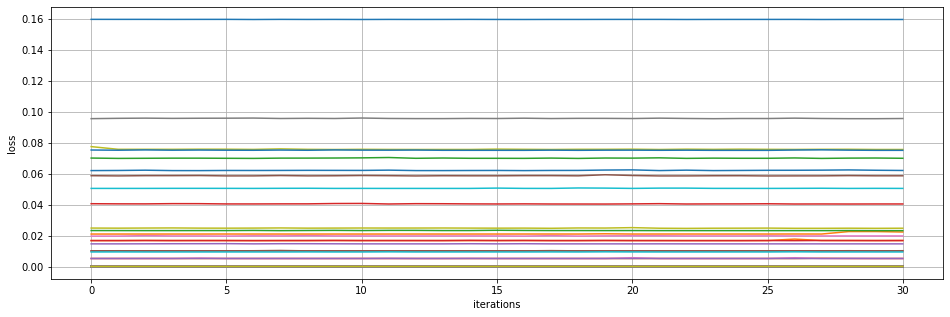

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 366
---------------
epoch 367
---------------
epoch 368
---------------
epoch 369
---------------
epoch 370
---------------
epoch 370
learning rate: 0.00065
sample 0
---------------
epoch 370
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59375330e-01]
 [9.70417885e-05]
 [9.70516187e-05]
 [9.70680401e-05]
 [9.70474128e-05]
 [9.70686272e-05]
 [9.70543447e-05]
 [9.70406964e-05]
 [9.70447798e-05]
 [9.70573597e-05]
 [9.70463428e-05]
 [9.70448637e-05]
 [

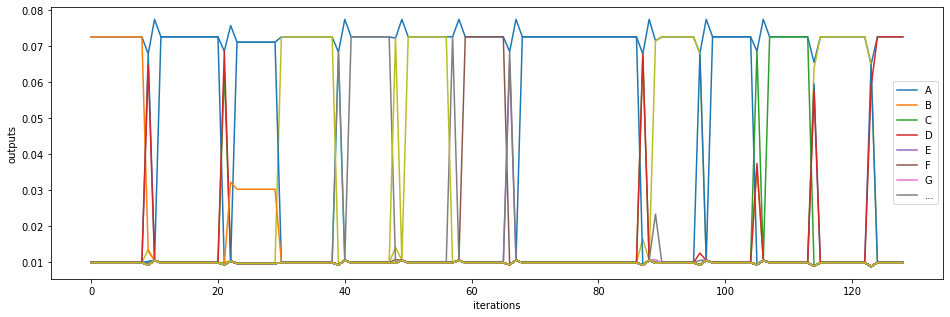

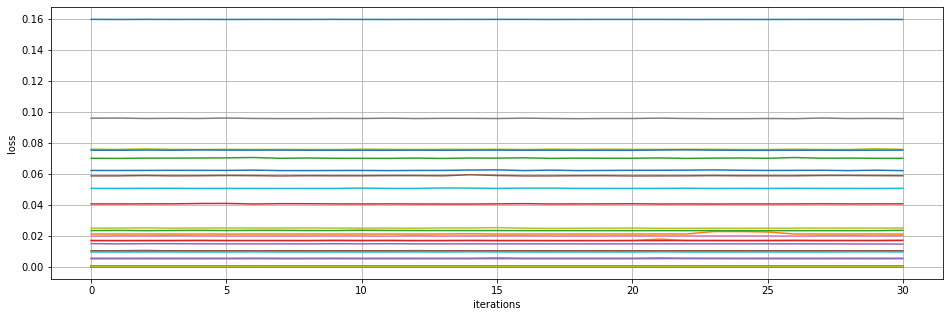

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                                         
---------------
epoch 371
---------------
epoch 372
---------------
epoch 373
---------------
epoch 374
---------------
epoch 375
---------------
epoch 375
learning rate: 0.00065
sample 0
---------------
epoch 375
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59408990e-01]
 [9.69503041e-05]
 [9.69611648e-05]
 [9.69775869e-05]
 [9.69561300e-05]
 [9.69783528e-05]
 [9.69646004e-05]
 [9.69485546e-05]
 [9.69537173e-05]
 [9.69664332e-05]
 [9.69553302e-05]
 [9.69531814e-05]
 [

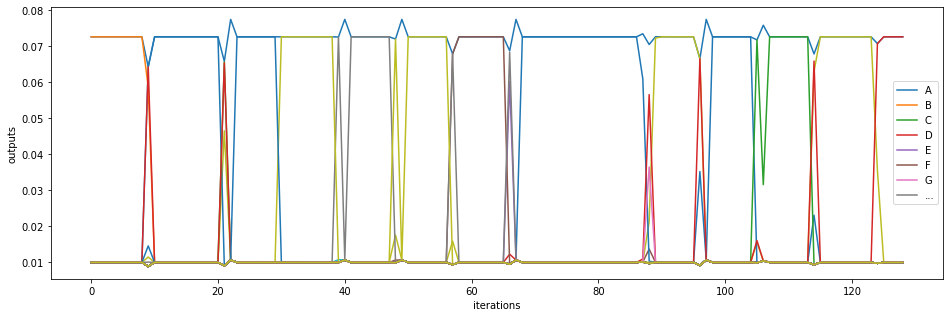

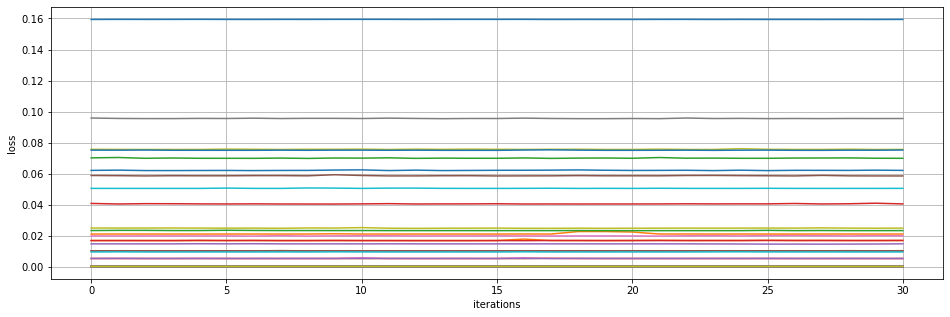

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 376
---------------
epoch 377
---------------
epoch 378
---------------
epoch 379
---------------
epoch 380
---------------
epoch 380
learning rate: 0.00065
sample 0
---------------
epoch 380
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59391816e-01]
 [9.69422803e-05]
 [9.69523185e-05]
 [9.69707433e-05]
 [9.69512768e-05]
 [9.69706048e-05]
 [9.69583892e-05]
 [9.69414487e-05]
 [9.69457396e-05]
 [9.69619483e-05]
 [9.69482426e-05]
 [9.69466053e-05]
 [

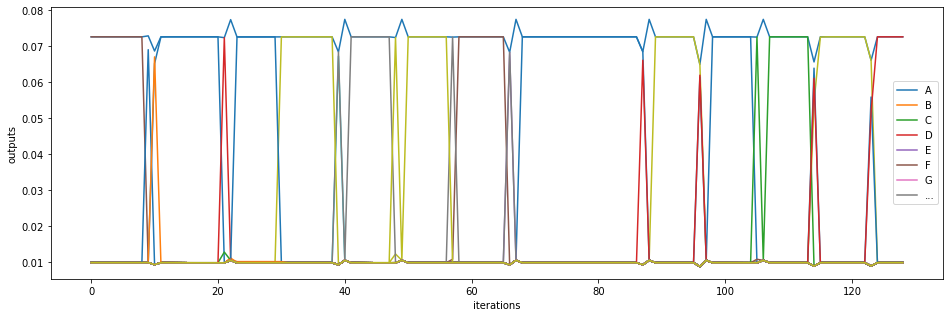

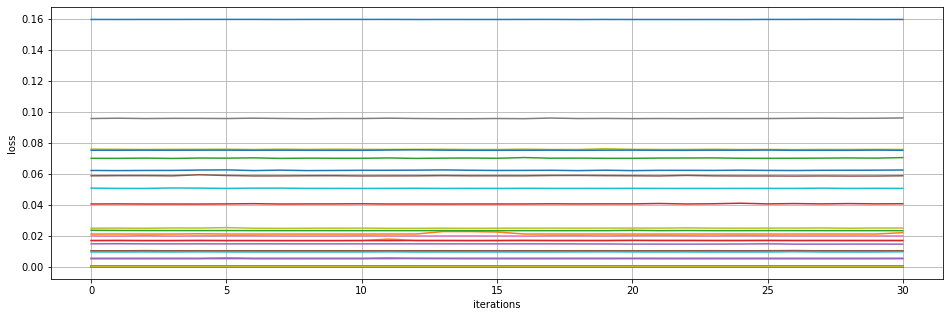

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                      
---------------
epoch 381
---------------
epoch 382
---------------
epoch 383
---------------
epoch 384
---------------
epoch 385
---------------
epoch 385
learning rate: 0.00065
sample 0
---------------
epoch 385
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59391264e-01]
 [9.70024367e-05]
 [9.70111622e-05]
 [9.70301449e-05]
 [9.70117627e-05]
 [9.70295100e-05]
 [9.70166750e-05]
 [9.70027165e-05]
 [9.70056271e-05]
 [9.70221747e-05]
 [9.70079570e-05]
 [9.70071799e-05]
 [

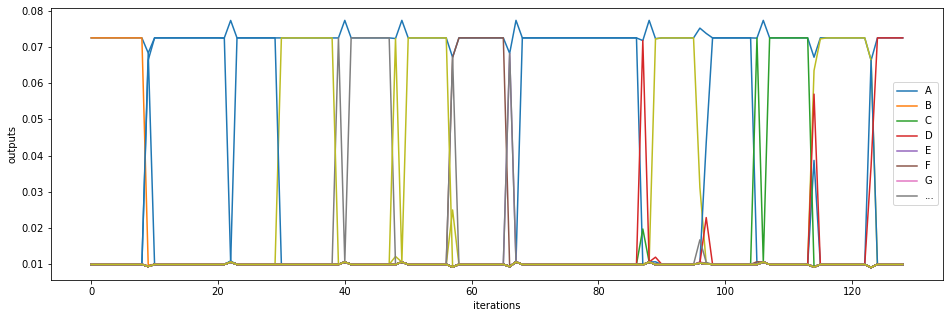

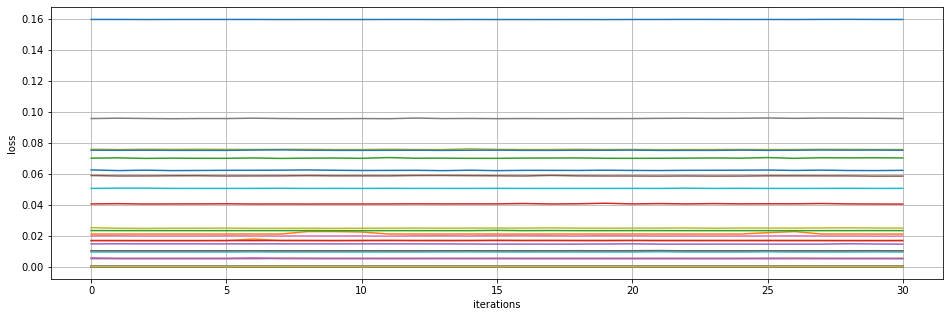

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii hhh                                                                                                                                                                                                                                                                                                                                                                                                                     
---------------
epoch 386
---------------
epoch 387
---------------
epoch 388
---------------
epoch 389
---------------
epoch 390
---------------
epoch 390
learning rate: 0.00065
sample 0
---------------
epoch 390
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59372569e-01]
 [9.68552452e-05]
 [9.68639377e-05]
 [9.68828804e-05]
 [9.68634876e-05]
 [9.68817068e-05]
 [9.68678574e-05]
 [9.68559094e-05]
 [9.68584327e-05]
 [9.68740917e-05]
 [9.68600662e-05]
 [9.68600270e-05]
 [

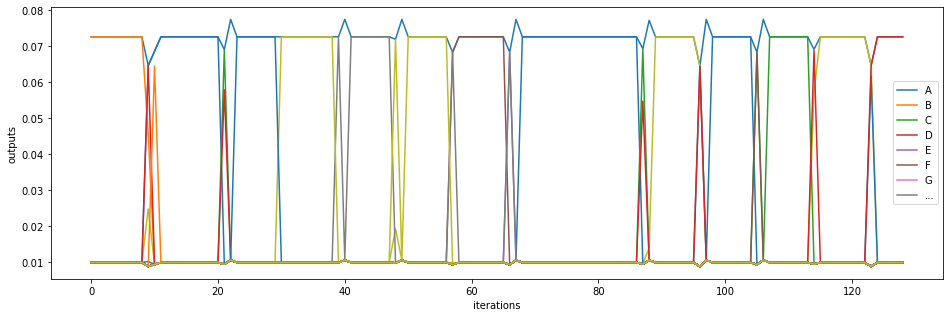

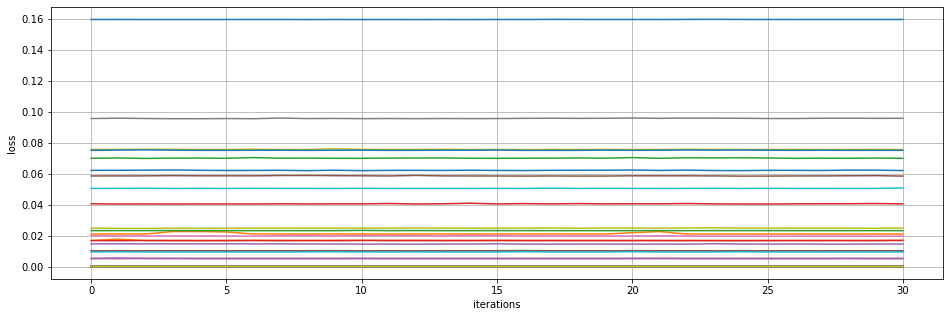

iiiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               
---------------
epoch 391
---------------
epoch 392
---------------
epoch 393
---------------
epoch 394
---------------
epoch 395
---------------
epoch 395
learning rate: 0.00065
sample 0
---------------
epoch 395
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59380046e-01]
 [9.69900835e-05]
 [9.69996514e-05]
 [9.70181798e-05]
 [9.69978982e-05]
 [9.70164555e-05]
 [9.70027948e-05]
 [9.69905049e-05]
 [9.69934168e-05]
 [9.70088989e-05]
 [9.69946780e-05]
 [9.69954163e-05]
 [

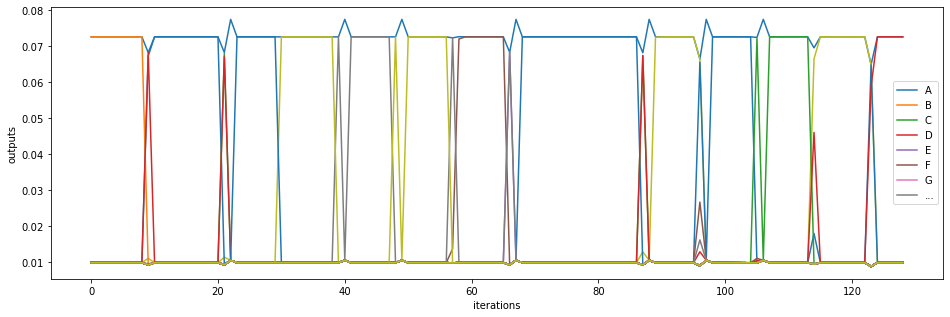

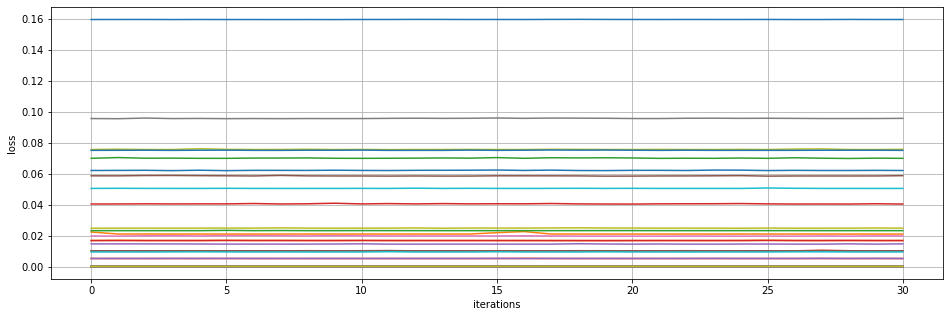

iiiiiiiiiiiiiiiiiiii                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
---------------
epoch 396
---------------
epoch 397
---------------
epoch 398
---------------
epoch 399
---------------
epoch 400
---------------
epoch 400
learning rate: 0.00065
sample 0
---------------
epoch 400
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59389057e-01]
 [9.69783356e-05]
 [9.69871186e-05]
 [9.70025255e-05]
 [9.69831549e-05]
 [9.70012619e-05]
 [9.69875930e-05]
 [9.69784801e-05]
 [9.69811516e-05]
 [9.69925274e-05]
 [9.69815488e-05]
 [9.69827223e-05]
 [

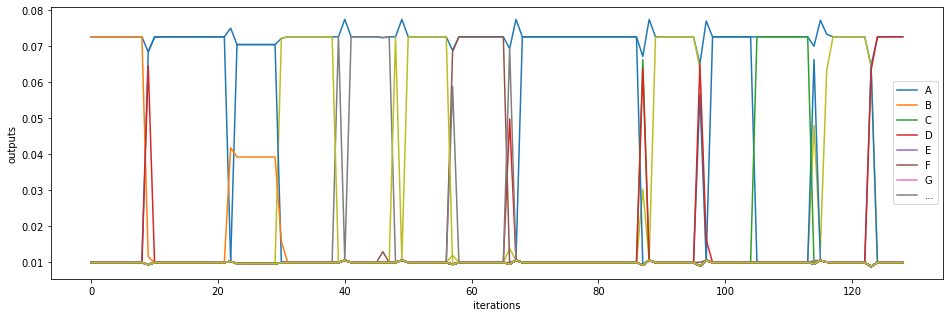

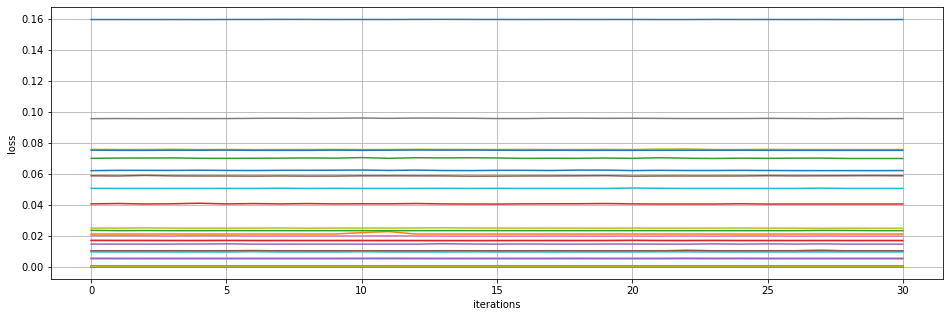

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
---------------
epoch 401
---------------
epoch 402
---------------
epoch 403
---------------
epoch 404
---------------
epoch 405
---------------
epoch 405
learning rate: 0.00065
sample 0
---------------
epoch 405
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59401912e-01]
 [9.70247364e-05]
 [9.70341237e-05]
 [9.70505404e-05]
 [9.70304206e-05]
 [9.70489591e-05]
 [9.70352548e-05]
 [9.70248762e-05]
 [9.70277208e-05]
 [9.70402476e-05]
 [9.70283568e-05]
 [9.70295395e-05]
 [

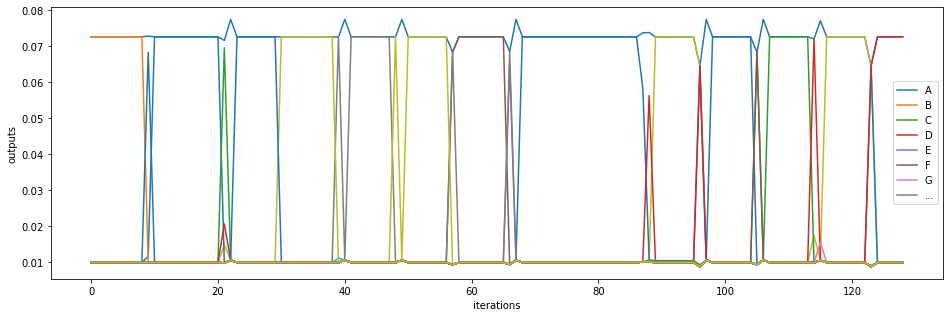

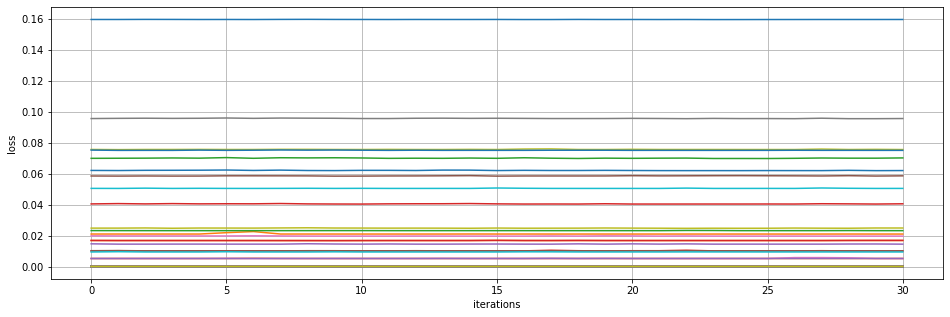

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 406
---------------
epoch 407
---------------
epoch 408
---------------
epoch 409
---------------
epoch 410
---------------
epoch 410
learning rate: 0.00065
sample 0
---------------
epoch 410
learning rate: 0.00065
sample 801
-----------------
average loss: 
[[1.59395821e-01]
 [9.69823533e-05]
 [9.69926798e-05]
 [9.70077533e-05]
 [9.69870875e-05]
 [9.70069389e-05]
 [9.69934326e-05]
 [9.69814174e-05]
 [9.69852915e-05]
 [9.69970548e-05]
 [9.69859236e-05]
 [9.69867062e-05]
 [

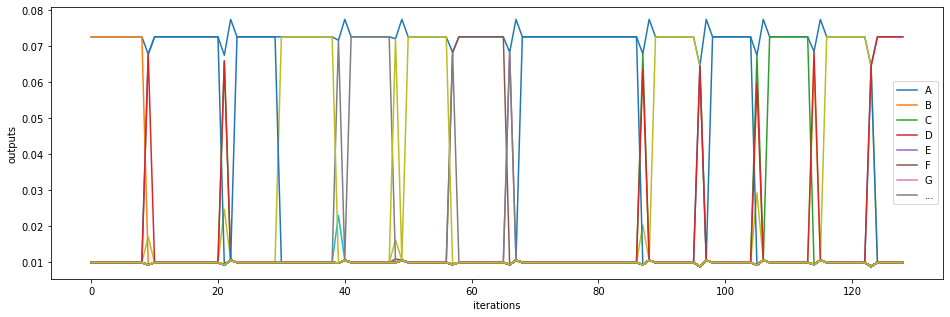

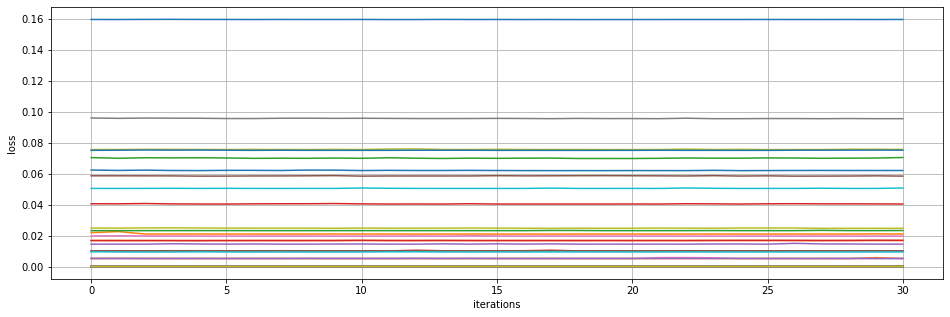

iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii
---------------
epoch 411
---------------
epoch 412


In [ ]:
epochs = 14000
batch = 1
early_stop = 500
loss = 0
prevLoss = 999
losses = []

for e in range(0, epochs+1):
    network.clear_memory()
    loss = 0
    outputs = []
    print("---------------")
    print("epoch " + str(e))
    network.learning_rate /= 1.0000
    for i in range(0, len(input_data)-1):
        output = network.forward_pass(input_data[i])
        if i > len(input_data)-1 - 130:
            outputs.append(output)
        loss += network.backpropagation_through_time(input_data, input_data[i+1], 55, i+1, batch)
  
        if e%5 == 0 and i%801 == 0:
            print("---------------")
            print("epoch " + str(e))
            print("learning rate: " + str(network.learning_rate))
            print("sample " + str(i))
            #print("output: \n" + str(output))
            #print("target: \n" + str(input_data[i+1]))
    
    if e%5 == 0:        
        print("-----------------")
        print("average loss: ")
        print(str(loss/len(input_data))) 
        plt.plot(np.squeeze(outputs))
        plt.ylabel('outputs')
        plt.xlabel('iterations')
        plt.legend(["A", "B", "C", "D", "E", "F", "G", "..."])
        plt.show()
        
        plt.plot(np.squeeze(losses))
        plt.ylabel('loss')
        plt.xlabel('iterations')
        plt.grid()
        plt.show()
        network.predict(input_data)
        
        
    prevLoss = loss
    losses.append(loss/len(input_data))
    if e > 30:
        del losses[0]
    
    
print("------------training finished successfully!------------")
        

In [ ]:
print(str(network.layers[-3].inputs))

In [ ]:
print(str(network.layers[-1].bz))

In [ ]:
print(str(network.layers[-1].br))

In [ ]:
print(str(network.layers[-1].Wz))

In [ ]:
print(str(network.layers[-1].Wr))

In [ ]:
print(str(network.layers[-1].Wh))

In [ ]:
print(str(network.layers[-1].Ur))

In [ ]:
print(str(network.layers[-1].Uz))

In [ ]:
print(str(network.layers[-1].Uh))

In [ ]:
print(str(network.layers[-1].bh))